In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

focal_length_1_x = 5299.313
focal_length_1_y = 5299.313
principal_point_1_x = 1263.818
principal_point_1_y = 977.763

focal_length_2_x = 5299.313
focal_length_2_y = 5299.313
principal_point_2_x = 1438.004
principal_point_2_y = 977.763

baseline=177.288

K1 = np.array([[focal_length_1_x, 0, principal_point_1_x],
               [0, focal_length_1_y, principal_point_1_y],
               [0, 0, 1]])
K2 = np.array([[focal_length_2_x, 0, principal_point_2_x],
               [0, focal_length_2_y, principal_point_2_y],
               [0, 0, 1]])

img_left = cv2.imread('/content/bikeL.png', 0)
img_right = cv2.imread('/content/bikeR.png', 0)

img1 = img_left.copy()
img2 = img_right.copy()
gray1 = img1
gray2 = img2
sift = cv2.SIFT_create()
kp1,des1 = sift.detectAndCompute(gray1, None)
kp2,des2 = sift.detectAndCompute(gray2, None)
img_1=cv2.drawKeypoints(gray1,kp1,img1)
img_2=cv2.drawKeypoints(gray2,kp2,img2)
bf = cv2.BFMatcher()
matches = bf.match(des1,des2)
matches = sorted(matches, key = lambda x:x.distance)
matches = matches[:150]

pt_img1 =np.array([kp1[match.queryIdx].pt for match in matches]).reshape(-1,2)
pt_img2 = np.array([kp2[match.trainIdx].pt for match in matches]).reshape(-1,2)

stereo image I1

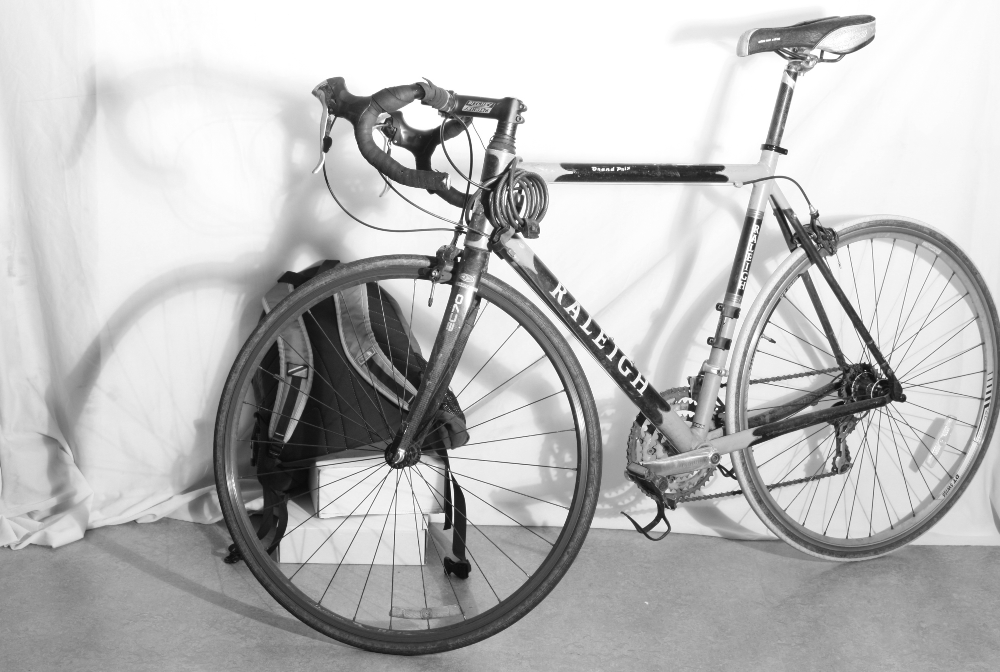

In [ ]:
cv2_imshow(img_left)

stereo image I2

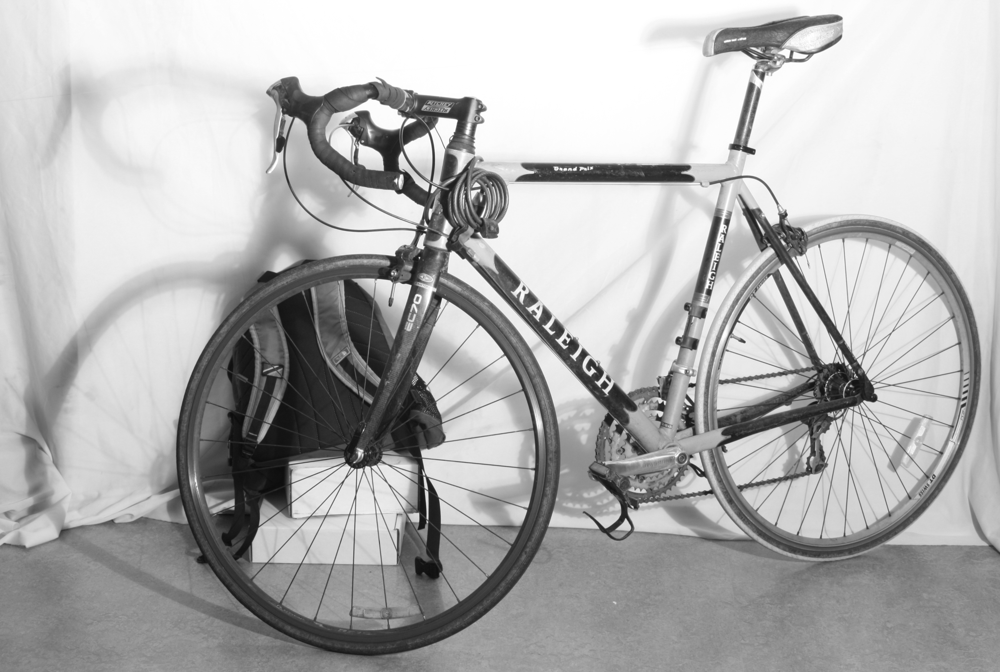

In [ ]:
cv2_imshow(img_right)

normalising pixel points using handmade function so that the points are invariant to changes in image's scale and translation

In [ ]:
def normalise_points(pts):
    mean_ =np.mean(pts,axis=0)

    #finding centre
    u = pts[:,0] - mean_[0]
    v = pts[:,1] - mean_[1]

    sd_u = 1/np.std(pts[:,0])
    sd_v = 1/np.std(pts[:,1])
    Tscale = np.array([[sd_u,0,0],[0,sd_v,0],[0,0,1]])
    Ta = np.array([[1,0,-mean_[0]],[0,1,-mean_[1]],[0,0,1]])
    T = np.dot(Tscale,Ta)

    pt = np.column_stack((pts,np.ones(len(pts))))
    norm_pts = (np.dot(T,pt.T)).T

    return norm_pts,T

calculates the fundamental matrix between a pair of sets of corresponding normalised image points/pixels

In [ ]:
def estimate_F(img1_pts,img2_pts):
    img1_pts,T1 = normalise_points(img1_pts)
    img2_pts,T2 = normalise_points(img2_pts)

    x1 = img1_pts[:,0]
    y1 = img1_pts[:,1]
    x1dash = img2_pts[:,0]
    y1dash = img2_pts[:,1]
    A = np.zeros((len(x1),9))

    for i in range(len(x1)):
        A[i] = np.array([x1dash[i]*x1[i],x1dash[i]*y1[i],x1dash[i], y1dash[i]*x1[i],y1dash[i]*y1[i],y1dash[i],x1[i],y1[i],1])

    #taking SVD of A for estimation of F
    U, S, V = np.linalg.svd(A,full_matrices=True)
    F_est = V[-1, :]
    F_est = F_est.reshape(3,3)

    #forcing rank 2 for F
    ua,sa,va = np.linalg.svd(F_est,full_matrices=True)
    sa = np.diag(sa)
    sa[2,2] = 0
    F = np.dot(ua,np.dot(sa,va))
    F = np.dot(T2.T, np.dot(F, T1))
    return F

in this ransac function, I estimated the fundamental matrix 'F' by iteratively selecting random subsets of points and fitting a model to find the best set of inliers

In [ ]:
def ransac(pt1,pt2):
    n_rows = np.array(pt1).shape[0]
    no_iter = 1000
    threshold = 0.05
    inliers = 0

    final_indices = []
    for i in range(no_iter):
        indices = []

        #randomly selecting eight points
        random = np.random.choice(n_rows,size = 8)
        img1_8pt = pt1[random]
        img2_8pt = pt2[random]

        F_est = estimate_F(img1_8pt,img2_8pt)

        for j in range(n_rows):
            x1 = pt1[j]
            x2 = pt2[j]

            #computing error
            pt1_ = np.array([x1[0],x1[1],1])
            pt2_ = np.array([x2[0],x2[1],1])
            error = np.dot(pt1_.T,np.dot(F_est,pt2_))

            if np.abs(error) < threshold:
                indices.append(j)

        if len(indices) > inliers:
            inliers = len(indices)
            final_indices = indices
            F = F_est
    img1_points = pt1[final_indices]
    img2_points = pt2[final_indices]
    return img1_points,img2_points, F

Here, I derive the essential matrix 'E' from the fundamental matrix 'F' and the camera intrinsic matrices "K1" and "K2"

In [ ]:
def estimate_E(K1, K2, F):
    return np.dot(np.dot(K2.T, F), K1)

fundamental matrix

In [ ]:
pts1_,pts2_, F = ransac(pt_img1,pt_img2)
print("Estimated F:\n",F)

Estimated F:
 [[ 1.89322429e-10  1.97851950e-07 -1.67747531e-04]
 [-2.03524390e-07 -2.20769609e-09  1.55553263e-03]
 [ 1.70671656e-04 -1.51981433e-03 -2.54206210e-02]]


essential matrix

In [ ]:
E = estimate_E(K1, K2, F)
print("Estimated E:\n",E)

Estimated E:
 [[ 5.31668842e-03  5.55622057e+00  1.37485663e-01]
 [-5.71551812e+00 -6.19981074e-02  6.86873761e+00]
 [-1.48670721e-01 -6.55769336e+00  8.90033930e-03]]


Here, I derive the rotation and translation matrices from the essential matrix and corresponding point sets using camera intrinsic matrices "K1" and "K2"

In [ ]:
def extract_pose(E, pts1, pts2, K1, K2):
    _, R, T, _ = cv2.recoverPose(E, pts1, pts2, K1)
    return R, T

R,T = extract_pose(E,pts1_,pts2_,K1,K2)

rotation matrix

In [ ]:
R

array([[ 0.9999576 ,  0.00151261, -0.00908305],
       [-0.00148997,  0.99999577,  0.00249882],
       [ 0.00908679, -0.00248519,  0.99995563]])

translation matrix

In [ ]:
T

array([[-0.76278733],
       [ 0.01610572],
       [-0.64644883]])

I rectify two images using the given fundamental matrix 'F' and corresponding point sets

In [ ]:
def rectify(img1,img2,F,pts1,pts2):
    h1,w1 = img1.shape[:2]
    h2,w2 = img2.shape[:2]

    _,H1, H2 = cv2.stereoRectifyUncalibrated(np.float32(pts1), np.float32(pts2), F, imgSize=(w1, h1))
    img1_rectified = cv2.warpPerspective(img1, H1, (w1, h1))
    img2_rectified = cv2.warpPerspective(img2, H2, (w2, h2))

    H1_inv = np.linalg.inv(H1)
    H2_inv = np.linalg.inv(H2)
    F_rectified = np.dot(H2_inv.T, np.dot(F,H1_inv))

    return img1_rectified,img2_rectified,F_rectified

I drew lines and points on an image based on a set of lines and corresponding points

In [ ]:
def draw_lines(lines_set,image,points):
    image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    for line,pt in zip(lines_set,points):
        x0,y0 = map(int, [0, -line[2]/line[1] ])
        x1,y1 = map(int, [image.shape[1]-1, -line[2]/line[1] ])
        img = cv2.line(image, (x0,y0), (x1,y1), (0,255,0) ,2)
        img = cv2.circle(image, (int(pt[0]),int(pt[1])), 5, (0,255,0), 2)
    return img

I computed epipolar lines for two sets of points using the fundamental matrix 'F', and visualised these lines on two images and displayed the computed lines

In [ ]:
def epipolar_lines(pts1_,pts2_,F,image1,image2):
    lines1_,lines2_ = [], []
    for i in range(len(pts1_)):
        p1 = np.array([pts1_[i,0], pts1_[i,1], 1])
        p2 = np.array([pts2_[i,0], pts2_[i,1], 1])

        lines1_.append(np.dot(F.T, p2))
        lines2_.append(np.dot(F,p1))
    img1 = draw_lines(lines1_,image1,pts1_)
    img2 = draw_lines(lines2_,image2,pts2_)

    out = np.hstack((img1, img2))
    cv2_imshow(out)
    return lines1_,lines2_

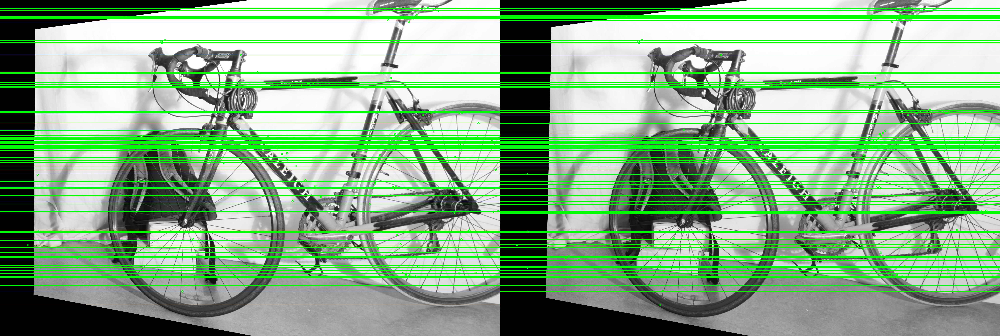

In [ ]:
img1_rectified, img2_rectified, F_rectified = rectify(img_left, img_right, F, pts1_, pts2_)
lines1, lines2 = epipolar_lines(pts1_, pts2_, F_rectified, img1_rectified, img2_rectified)

I extractED blocks of specified window_size from THE image, storing both the blocks and their corresponding locations within the image

In [ ]:
def get_blocks(img,window_size):
    height,width = img.shape
    window_set=[]
    window_loc = []
    for y in range(window_size, height - window_size):
        for x in range(window_size, width - window_size):
            img_window = img[y:y + window_size, x:x + window_size]
            window_set.append(img_window)
            window_loc.append((y,x))
    return window_set,window_loc

boundary conditions

In [ ]:
def get_boundary_condition(x,y,search_range,width,height):
    range_min = max(0, x-search_range)
    range_max = min(width,x+search_range )
    return range_max,range_min

deriving the um of squared differences b/w 2 image windows

In [ ]:
def get_sdd(imgl_window,imgr_window):
    max = 1e10
    if imgl_window.shape == imgr_window.shape:
        diff = np.abs(imgl_window - imgr_window)
        SSD = np.sum(np.square(imgl_window - imgr_window))
        return SSD
    else:
        return max

I iteratively compared each block from the left image with blocks in the right image within the search range, computing the SSD to find the best matching block and calculating the disparity

In [ ]:
from tqdm import tqdm
def get_disparity(img1,img2,search_range):
        imgl = img1.copy()
        imgr = img2.copy()
        disparityImg = np.zeros(img2.shape)
        window_size = 15
        #get a patch in left image
        height,width = img1.shape

        imgl = imgl.astype(np.int32)
        imgr = imgr.astype(np.int32)

        for y in tqdm(range(0,height-window_size)):

            imgl_window_set = []
            imgr_window_set = []

            for x in range(0,width-window_size):
                left_window = imgl[y:y+window_size, x:x+window_size]
                right_window = imgr[y:y+window_size, x:x+window_size]
                imgl_window_set.append(left_window.flatten())
                imgr_window_set.append(right_window.flatten())

            imgl_window_set = np.array(imgl_window_set)
            imgr_window_set = np.array(imgr_window_set)
            print(len(imgl_window_set))
            for i in range(len(imgl_window_set)):

                SSD = np.sum(np.square(imgr_window_set- imgl_window_set[i]),axis=1)
                index = np.argmin(SSD)
                disparity = np.abs(i - index)
                # disparity = ((disparity+1) / 2) * 255
                disparityImg[y,i] = np.uint8(disparity)
        return disparityImg

I calculated the depth using the formula depth and clipped the maximum depth value to 10,000 before normalisation

In [ ]:
def get_depth(disparityImg,b,f):
    depth = (b * f) / (disparityImg + 1e-10)
    depth[depth > 10000] = 10000
    depth_map = np.uint8(depth * 255 / np.max(depth))
    return depth_map

  0%|          | 0/1993 [00:00<?, ?it/s]

2973


  0%|          | 1/1993 [00:03<2:09:08,  3.89s/it]

2973


  0%|          | 2/1993 [00:07<1:56:28,  3.51s/it]

2973


  0%|          | 3/1993 [00:11<2:05:33,  3.79s/it]

2973


  0%|          | 4/1993 [00:14<1:58:52,  3.59s/it]

2973


  0%|          | 5/1993 [00:17<1:54:53,  3.47s/it]

2973


  0%|          | 6/1993 [00:21<1:53:51,  3.44s/it]

2973


  0%|          | 7/1993 [00:25<2:01:27,  3.67s/it]

2973


  0%|          | 8/1993 [00:28<1:57:20,  3.55s/it]

2973


  0%|          | 9/1993 [00:31<1:54:39,  3.47s/it]

2973


  1%|          | 10/1993 [00:35<2:00:46,  3.65s/it]

2973


  1%|          | 11/1993 [00:39<1:58:26,  3.59s/it]

2973


  1%|          | 12/1993 [00:42<1:55:00,  3.48s/it]

2973


  1%|          | 13/1993 [00:45<1:52:31,  3.41s/it]

2973


  1%|          | 14/1993 [00:49<1:59:29,  3.62s/it]

2973


  1%|          | 15/1993 [00:53<1:58:35,  3.60s/it]

2973


  1%|          | 16/1993 [00:57<1:59:18,  3.62s/it]

2973


  1%|          | 17/1993 [01:01<2:00:57,  3.67s/it]

2973


  1%|          | 18/1993 [01:04<1:59:42,  3.64s/it]

2973


  1%|          | 19/1993 [01:07<1:55:16,  3.50s/it]

2973


  1%|          | 20/1993 [01:10<1:52:29,  3.42s/it]

2973


  1%|          | 21/1993 [01:15<1:59:28,  3.64s/it]

2973


  1%|          | 22/1993 [01:18<1:55:28,  3.52s/it]

2973


  1%|          | 23/1993 [01:21<1:52:17,  3.42s/it]

2973


  1%|          | 24/1993 [01:24<1:51:15,  3.39s/it]

2973


  1%|▏         | 25/1993 [01:28<1:57:24,  3.58s/it]

2973


  1%|▏         | 26/1993 [01:32<1:53:43,  3.47s/it]

2973


  1%|▏         | 27/1993 [01:35<1:51:13,  3.39s/it]

2973


  1%|▏         | 28/1993 [01:39<1:55:04,  3.51s/it]

2973


  1%|▏         | 29/1993 [01:42<1:56:05,  3.55s/it]

2973


  2%|▏         | 30/1993 [01:46<1:53:20,  3.46s/it]

2973


  2%|▏         | 31/1993 [01:49<1:50:50,  3.39s/it]

2973


  2%|▏         | 32/1993 [01:53<1:58:11,  3.62s/it]

2973


  2%|▏         | 33/1993 [01:56<1:54:17,  3.50s/it]

2973


  2%|▏         | 34/1993 [01:59<1:51:49,  3.43s/it]

2973


  2%|▏         | 35/1993 [02:03<1:51:43,  3.42s/it]

2973


  2%|▏         | 36/1993 [02:07<1:57:59,  3.62s/it]

2973


  2%|▏         | 37/1993 [02:10<1:54:30,  3.51s/it]

2973


  2%|▏         | 38/1993 [02:13<1:52:11,  3.44s/it]

2973


  2%|▏         | 39/1993 [02:17<1:57:44,  3.62s/it]

2973


  2%|▏         | 40/1993 [02:21<1:55:46,  3.56s/it]

2973


  2%|▏         | 41/1993 [02:24<1:53:00,  3.47s/it]

2973


  2%|▏         | 42/1993 [02:27<1:50:28,  3.40s/it]

2973


  2%|▏         | 43/1993 [02:31<1:57:30,  3.62s/it]

2973


  2%|▏         | 44/1993 [02:35<1:53:51,  3.51s/it]

2973


  2%|▏         | 45/1993 [02:38<1:51:15,  3.43s/it]

2973


  2%|▏         | 46/1993 [02:41<1:51:50,  3.45s/it]

2973


  2%|▏         | 47/1993 [02:45<1:55:42,  3.57s/it]

2973


  2%|▏         | 48/1993 [02:49<1:52:33,  3.47s/it]

2973


  2%|▏         | 49/1993 [02:52<1:50:02,  3.40s/it]

2973


  3%|▎         | 50/1993 [02:56<1:55:51,  3.58s/it]

2973


  3%|▎         | 51/1993 [02:59<1:53:25,  3.50s/it]

2973


  3%|▎         | 52/1993 [03:02<1:50:43,  3.42s/it]

2973


  3%|▎         | 53/1993 [03:06<1:48:45,  3.36s/it]

2973


  3%|▎         | 54/1993 [03:10<1:55:58,  3.59s/it]

2973


  3%|▎         | 55/1993 [03:13<1:52:29,  3.48s/it]

2973


  3%|▎         | 56/1993 [03:16<1:49:37,  3.40s/it]

2973


  3%|▎         | 57/1993 [03:20<1:50:07,  3.41s/it]

2973


  3%|▎         | 58/1993 [03:23<1:55:16,  3.57s/it]

2973


  3%|▎         | 59/1993 [03:27<1:51:49,  3.47s/it]

2973


  3%|▎         | 60/1993 [03:30<1:49:04,  3.39s/it]

2973


  3%|▎         | 61/1993 [03:34<1:54:56,  3.57s/it]

2973


  3%|▎         | 62/1993 [03:37<1:52:52,  3.51s/it]

2973


  3%|▎         | 63/1993 [03:40<1:50:00,  3.42s/it]

2973


  3%|▎         | 64/1993 [03:44<1:47:54,  3.36s/it]

2973


  3%|▎         | 65/1993 [03:48<1:54:56,  3.58s/it]

2973


  3%|▎         | 66/1993 [03:51<1:51:17,  3.47s/it]

2973


  3%|▎         | 67/1993 [03:54<1:48:59,  3.40s/it]

2973


  3%|▎         | 68/1993 [03:58<1:48:54,  3.39s/it]

2973


  3%|▎         | 69/1993 [04:02<1:54:09,  3.56s/it]

2973


  4%|▎         | 70/1993 [04:05<1:51:16,  3.47s/it]

2973


  4%|▎         | 71/1993 [04:08<1:48:42,  3.39s/it]

2973


  4%|▎         | 72/1993 [04:12<1:53:08,  3.53s/it]

2973


  4%|▎         | 73/1993 [04:15<1:52:14,  3.51s/it]

2973


  4%|▎         | 74/1993 [04:19<1:49:21,  3.42s/it]

2973


  4%|▍         | 75/1993 [04:22<1:47:28,  3.36s/it]

2973


  4%|▍         | 76/1993 [04:26<1:54:43,  3.59s/it]

2973


  4%|▍         | 77/1993 [04:29<1:50:54,  3.47s/it]

2973


  4%|▍         | 78/1993 [04:32<1:48:25,  3.40s/it]

2973


  4%|▍         | 79/1993 [04:36<1:47:45,  3.38s/it]

2973


  4%|▍         | 80/1993 [04:40<1:53:27,  3.56s/it]

2973


  4%|▍         | 81/1993 [04:43<1:50:03,  3.45s/it]

2973


  4%|▍         | 82/1993 [04:46<1:47:45,  3.38s/it]

2973


  4%|▍         | 83/1993 [04:50<1:51:31,  3.50s/it]

2973


  4%|▍         | 84/1993 [04:53<1:51:35,  3.51s/it]

2973


  4%|▍         | 85/1993 [04:57<1:48:34,  3.41s/it]

2973


  4%|▍         | 86/1993 [05:00<1:46:25,  3.35s/it]

2973


  4%|▍         | 87/1993 [05:04<1:53:44,  3.58s/it]

2973


  4%|▍         | 88/1993 [05:07<1:50:13,  3.47s/it]

2973


  4%|▍         | 89/1993 [05:10<1:47:38,  3.39s/it]

2973


  5%|▍         | 90/1993 [05:14<1:45:58,  3.34s/it]

2973


  5%|▍         | 91/1993 [05:18<1:53:16,  3.57s/it]

2973


  5%|▍         | 92/1993 [05:21<1:49:32,  3.46s/it]

2973


  5%|▍         | 93/1993 [05:24<1:47:33,  3.40s/it]

2973


  5%|▍         | 94/1993 [05:28<1:50:35,  3.49s/it]

2973


  5%|▍         | 95/1993 [05:31<1:51:46,  3.53s/it]

2973


  5%|▍         | 96/1993 [05:35<1:48:39,  3.44s/it]

2973


  5%|▍         | 97/1993 [05:38<1:46:39,  3.38s/it]

2973


  5%|▍         | 98/1993 [05:42<1:53:55,  3.61s/it]

2973


  5%|▍         | 99/1993 [05:45<1:50:02,  3.49s/it]

2973


  5%|▌         | 100/1993 [05:48<1:47:23,  3.40s/it]

2973


  5%|▌         | 101/1993 [05:52<1:45:50,  3.36s/it]

2973


  5%|▌         | 102/1993 [05:56<1:52:48,  3.58s/it]

2973


  5%|▌         | 103/1993 [05:59<1:49:38,  3.48s/it]

2973


  5%|▌         | 104/1993 [06:02<1:47:20,  3.41s/it]

2973


  5%|▌         | 105/1993 [06:06<1:49:59,  3.50s/it]

2973


  5%|▌         | 106/1993 [06:10<1:51:38,  3.55s/it]

2973


  5%|▌         | 107/1993 [06:13<1:48:34,  3.45s/it]

2973


  5%|▌         | 108/1993 [06:16<1:46:22,  3.39s/it]

2973


  5%|▌         | 109/1993 [06:20<1:53:40,  3.62s/it]

2973


  6%|▌         | 110/1993 [06:24<1:50:09,  3.51s/it]

2973


  6%|▌         | 111/1993 [06:27<1:47:16,  3.42s/it]

2973


  6%|▌         | 112/1993 [06:30<1:45:08,  3.35s/it]

2973


  6%|▌         | 113/1993 [06:34<1:52:21,  3.59s/it]

2973


  6%|▌         | 114/1993 [06:37<1:48:36,  3.47s/it]

2973


  6%|▌         | 115/1993 [06:40<1:46:04,  3.39s/it]

2973


  6%|▌         | 116/1993 [06:44<1:48:00,  3.45s/it]

2973


  6%|▌         | 117/1993 [06:48<1:50:29,  3.53s/it]

2973


  6%|▌         | 118/1993 [06:51<1:47:34,  3.44s/it]

2973


  6%|▌         | 119/1993 [06:54<1:44:57,  3.36s/it]

2973


  6%|▌         | 120/1993 [06:58<1:51:43,  3.58s/it]

2973


  6%|▌         | 121/1993 [07:02<1:48:30,  3.48s/it]

2973


  6%|▌         | 122/1993 [07:05<1:46:06,  3.40s/it]

2973


  6%|▌         | 123/1993 [07:08<1:44:17,  3.35s/it]

2973


  6%|▌         | 124/1993 [07:12<1:51:19,  3.57s/it]

2973


  6%|▋         | 125/1993 [07:15<1:47:46,  3.46s/it]

2973


  6%|▋         | 126/1993 [07:18<1:45:08,  3.38s/it]

2973


  6%|▋         | 127/1993 [07:22<1:46:37,  3.43s/it]

2973


  6%|▋         | 128/1993 [07:26<1:50:14,  3.55s/it]

2973


  6%|▋         | 129/1993 [07:29<1:47:16,  3.45s/it]

2973


  7%|▋         | 130/1993 [07:32<1:44:44,  3.37s/it]

2973


  7%|▋         | 131/1993 [07:36<1:50:59,  3.58s/it]

2973


  7%|▋         | 132/1993 [07:40<1:48:13,  3.49s/it]

2973


  7%|▋         | 133/1993 [07:43<1:45:40,  3.41s/it]

2973


  7%|▋         | 134/1993 [07:46<1:44:25,  3.37s/it]

2973


  7%|▋         | 135/1993 [07:50<1:51:23,  3.60s/it]

2973


  7%|▋         | 136/1993 [07:53<1:47:55,  3.49s/it]

2973


  7%|▋         | 137/1993 [07:57<1:45:23,  3.41s/it]

2973


  7%|▋         | 138/1993 [08:00<1:46:04,  3.43s/it]

2973


  7%|▋         | 139/1993 [08:04<1:49:54,  3.56s/it]

2973


  7%|▋         | 140/1993 [08:07<1:46:38,  3.45s/it]

2973


  7%|▋         | 141/1993 [08:10<1:44:34,  3.39s/it]

2973


  7%|▋         | 142/1993 [08:14<1:50:07,  3.57s/it]

2973


  7%|▋         | 143/1993 [08:18<1:47:57,  3.50s/it]

2973


  7%|▋         | 144/1993 [08:21<1:45:37,  3.43s/it]

2973


  7%|▋         | 145/1993 [08:24<1:43:59,  3.38s/it]

2973


  7%|▋         | 146/1993 [08:28<1:50:35,  3.59s/it]

2973


  7%|▋         | 147/1993 [08:32<1:46:59,  3.48s/it]

2973


  7%|▋         | 148/1993 [08:35<1:44:44,  3.41s/it]

2973


  7%|▋         | 149/1993 [08:38<1:45:24,  3.43s/it]

2973


  8%|▊         | 150/1993 [08:42<1:48:36,  3.54s/it]

2973


  8%|▊         | 151/1993 [08:45<1:45:32,  3.44s/it]

2973


  8%|▊         | 152/1993 [08:49<1:43:18,  3.37s/it]

2973


  8%|▊         | 153/1993 [08:52<1:48:33,  3.54s/it]

2973


  8%|▊         | 154/1993 [08:56<1:46:51,  3.49s/it]

2973


  8%|▊         | 155/1993 [08:59<1:44:13,  3.40s/it]

2973


  8%|▊         | 156/1993 [09:02<1:42:01,  3.33s/it]

2973


  8%|▊         | 157/1993 [09:06<1:49:08,  3.57s/it]

2973


  8%|▊         | 158/1993 [09:10<1:45:50,  3.46s/it]

2973


  8%|▊         | 159/1993 [09:13<1:43:15,  3.38s/it]

2973


  8%|▊         | 160/1993 [09:16<1:42:47,  3.36s/it]

2973


  8%|▊         | 161/1993 [09:20<1:48:14,  3.55s/it]

2973


  8%|▊         | 162/1993 [09:23<1:45:14,  3.45s/it]

2973


  8%|▊         | 163/1993 [09:26<1:43:03,  3.38s/it]

2973


  8%|▊         | 164/1993 [09:30<1:46:54,  3.51s/it]

2973


  8%|▊         | 165/1993 [09:34<1:46:55,  3.51s/it]

2973


  8%|▊         | 166/1993 [09:37<1:44:19,  3.43s/it]

2973


  8%|▊         | 167/1993 [09:40<1:42:22,  3.36s/it]

2973


  8%|▊         | 168/1993 [09:44<1:49:08,  3.59s/it]

2973


  8%|▊         | 169/1993 [09:48<1:45:34,  3.47s/it]

2973


  9%|▊         | 170/1993 [09:51<1:43:04,  3.39s/it]

2973


  9%|▊         | 171/1993 [09:54<1:41:39,  3.35s/it]

2973


  9%|▊         | 172/1993 [09:59<1:58:20,  3.90s/it]

2973


  9%|▊         | 173/1993 [10:03<1:59:07,  3.93s/it]

2973


  9%|▊         | 174/1993 [10:07<1:55:26,  3.81s/it]

2973


  9%|▉         | 175/1993 [10:11<1:57:49,  3.89s/it]

2973


  9%|▉         | 176/1993 [10:14<1:51:42,  3.69s/it]

2973


  9%|▉         | 177/1993 [10:17<1:47:32,  3.55s/it]

2973


  9%|▉         | 178/1993 [10:20<1:44:40,  3.46s/it]

2973


  9%|▉         | 179/1993 [10:25<1:50:44,  3.66s/it]

2973


  9%|▉         | 180/1993 [10:28<1:47:00,  3.54s/it]

2973


  9%|▉         | 181/1993 [10:31<1:44:06,  3.45s/it]

2973


  9%|▉         | 182/1993 [10:35<1:47:33,  3.56s/it]

2973


  9%|▉         | 183/1993 [10:39<1:48:00,  3.58s/it]

2973


  9%|▉         | 184/1993 [10:42<1:44:31,  3.47s/it]

2973


  9%|▉         | 185/1993 [10:45<1:42:15,  3.39s/it]

2973


  9%|▉         | 186/1993 [10:49<1:48:25,  3.60s/it]

2973


  9%|▉         | 187/1993 [10:52<1:44:48,  3.48s/it]

2973


  9%|▉         | 188/1993 [10:55<1:42:08,  3.40s/it]

2973


  9%|▉         | 189/1993 [10:59<1:40:37,  3.35s/it]

2973


 10%|▉         | 190/1993 [11:03<1:47:24,  3.57s/it]

2973


 10%|▉         | 191/1993 [11:06<1:44:22,  3.48s/it]

2973


 10%|▉         | 192/1993 [11:09<1:42:04,  3.40s/it]

2973


 10%|▉         | 193/1993 [11:13<1:44:56,  3.50s/it]

2973


 10%|▉         | 194/1993 [11:17<1:45:58,  3.53s/it]

2973


 10%|▉         | 195/1993 [11:20<1:43:12,  3.44s/it]

2973


 10%|▉         | 196/1993 [11:23<1:41:28,  3.39s/it]

2973


 10%|▉         | 197/1993 [11:27<1:48:15,  3.62s/it]

2973


 10%|▉         | 198/1993 [11:30<1:44:50,  3.50s/it]

2973


 10%|▉         | 199/1993 [11:34<1:42:25,  3.43s/it]

2973


 10%|█         | 200/1993 [11:37<1:41:07,  3.38s/it]

2973


 10%|█         | 201/1993 [11:41<1:47:36,  3.60s/it]

2973


 10%|█         | 202/1993 [11:44<1:44:03,  3.49s/it]

2973


 10%|█         | 203/1993 [11:48<1:41:41,  3.41s/it]

2973


 10%|█         | 204/1993 [11:51<1:44:30,  3.50s/it]

2973


 10%|█         | 205/1993 [11:55<1:45:43,  3.55s/it]

2973


 10%|█         | 206/1993 [11:58<1:42:51,  3.45s/it]

2973


 10%|█         | 207/1993 [12:01<1:40:39,  3.38s/it]

2973


 10%|█         | 208/1993 [12:06<1:47:15,  3.61s/it]

2973


 10%|█         | 209/1993 [12:09<1:43:48,  3.49s/it]

2973


 11%|█         | 210/1993 [12:12<1:41:26,  3.41s/it]

2973


 11%|█         | 211/1993 [12:15<1:39:48,  3.36s/it]

2973


 11%|█         | 212/1993 [12:19<1:46:44,  3.60s/it]

2973


 11%|█         | 213/1993 [12:23<1:44:27,  3.52s/it]

2973


 11%|█         | 214/1993 [12:26<1:42:11,  3.45s/it]

2973


 11%|█         | 215/1993 [12:30<1:45:20,  3.56s/it]

2973


 11%|█         | 216/1993 [12:33<1:45:18,  3.56s/it]

2973


 11%|█         | 217/1993 [12:37<1:42:30,  3.46s/it]

2973


 11%|█         | 218/1993 [12:40<1:40:19,  3.39s/it]

2973


 11%|█         | 219/1993 [12:44<1:46:49,  3.61s/it]

2973


 11%|█         | 220/1993 [12:47<1:43:14,  3.49s/it]

2973


 11%|█         | 221/1993 [12:50<1:40:55,  3.42s/it]

2973


 11%|█         | 222/1993 [12:54<1:40:01,  3.39s/it]

2973


 11%|█         | 223/1993 [12:58<1:45:41,  3.58s/it]

2973


 11%|█         | 224/1993 [13:01<1:42:33,  3.48s/it]

2973


 11%|█▏        | 225/1993 [13:04<1:40:40,  3.42s/it]

2973


 11%|█▏        | 226/1993 [13:08<1:44:42,  3.56s/it]

2973


 11%|█▏        | 227/1993 [13:12<1:44:14,  3.54s/it]

2973


 11%|█▏        | 228/1993 [13:15<1:41:26,  3.45s/it]

2973


 11%|█▏        | 229/1993 [13:18<1:39:22,  3.38s/it]

2973


 12%|█▏        | 230/1993 [13:22<1:46:20,  3.62s/it]

2973


 12%|█▏        | 231/1993 [13:26<1:43:11,  3.51s/it]

2973


 12%|█▏        | 232/1993 [13:29<1:40:39,  3.43s/it]

2973


 12%|█▏        | 233/1993 [13:32<1:40:27,  3.42s/it]

2973


 12%|█▏        | 234/1993 [13:36<1:45:46,  3.61s/it]

2973


 12%|█▏        | 235/1993 [13:39<1:42:31,  3.50s/it]

2973


 12%|█▏        | 236/1993 [13:43<1:40:35,  3.44s/it]

2973


 12%|█▏        | 237/1993 [13:47<1:45:02,  3.59s/it]

2973


 12%|█▏        | 238/1993 [13:50<1:43:13,  3.53s/it]

2973


 12%|█▏        | 239/1993 [13:53<1:40:45,  3.45s/it]

2973


 12%|█▏        | 240/1993 [13:57<1:38:42,  3.38s/it]

2973


 12%|█▏        | 241/1993 [14:01<1:45:01,  3.60s/it]

2973


 12%|█▏        | 242/1993 [14:04<1:41:55,  3.49s/it]

2973


 12%|█▏        | 243/1993 [14:07<1:39:34,  3.41s/it]

2973


 12%|█▏        | 244/1993 [14:11<1:39:34,  3.42s/it]

2973


 12%|█▏        | 245/1993 [14:15<1:44:01,  3.57s/it]

2973


 12%|█▏        | 246/1993 [14:18<1:41:04,  3.47s/it]

2973


 12%|█▏        | 247/1993 [14:21<1:38:53,  3.40s/it]

2973


 12%|█▏        | 248/1993 [14:25<1:44:21,  3.59s/it]

2973


 12%|█▏        | 249/1993 [14:28<1:42:47,  3.54s/it]

2973


 13%|█▎        | 250/1993 [14:32<1:39:52,  3.44s/it]

2973


 13%|█▎        | 251/1993 [14:35<1:38:12,  3.38s/it]

2973


 13%|█▎        | 252/1993 [14:39<1:45:01,  3.62s/it]

2973


 13%|█▎        | 253/1993 [14:42<1:41:15,  3.49s/it]

2973


 13%|█▎        | 254/1993 [14:45<1:38:47,  3.41s/it]

2973


 13%|█▎        | 255/1993 [14:49<1:39:21,  3.43s/it]

2973


 13%|█▎        | 256/1993 [14:53<1:42:58,  3.56s/it]

2973


 13%|█▎        | 257/1993 [14:56<1:39:53,  3.45s/it]

2973


 13%|█▎        | 258/1993 [14:59<1:37:46,  3.38s/it]

2973


 13%|█▎        | 259/1993 [15:03<1:42:40,  3.55s/it]

2973


 13%|█▎        | 260/1993 [15:07<1:41:11,  3.50s/it]

2973


 13%|█▎        | 261/1993 [15:10<1:38:42,  3.42s/it]

2973


 13%|█▎        | 262/1993 [15:13<1:36:56,  3.36s/it]

2973


 13%|█▎        | 263/1993 [15:17<1:43:22,  3.59s/it]

2973


 13%|█▎        | 264/1993 [15:20<1:40:02,  3.47s/it]

2973


 13%|█▎        | 265/1993 [15:24<1:37:53,  3.40s/it]

2973


 13%|█▎        | 266/1993 [15:27<1:38:16,  3.41s/it]

2973


 13%|█▎        | 267/1993 [15:31<1:42:29,  3.56s/it]

2973


 13%|█▎        | 268/1993 [15:34<1:39:39,  3.47s/it]

2973


 13%|█▎        | 269/1993 [15:37<1:37:39,  3.40s/it]

2973


 14%|█▎        | 270/1993 [15:41<1:42:30,  3.57s/it]

2973


 14%|█▎        | 271/1993 [15:45<1:40:58,  3.52s/it]

2973


 14%|█▎        | 272/1993 [15:48<1:38:25,  3.43s/it]

2973


 14%|█▎        | 273/1993 [15:51<1:36:30,  3.37s/it]

2973


 14%|█▎        | 274/1993 [15:55<1:42:53,  3.59s/it]

2973


 14%|█▍        | 275/1993 [15:59<1:39:33,  3.48s/it]

2973


 14%|█▍        | 276/1993 [16:02<1:37:08,  3.39s/it]

2973


 14%|█▍        | 277/1993 [16:05<1:37:00,  3.39s/it]

2973


 14%|█▍        | 278/1993 [16:09<1:42:03,  3.57s/it]

2973


 14%|█▍        | 279/1993 [16:12<1:39:01,  3.47s/it]

2973


 14%|█▍        | 280/1993 [16:16<1:36:57,  3.40s/it]

2973


 14%|█▍        | 281/1993 [16:19<1:41:05,  3.54s/it]

2973


 14%|█▍        | 282/1993 [16:23<1:40:15,  3.52s/it]

2973


 14%|█▍        | 283/1993 [16:26<1:37:27,  3.42s/it]

2973


 14%|█▍        | 284/1993 [16:29<1:35:43,  3.36s/it]

2973


 14%|█▍        | 285/1993 [16:33<1:42:29,  3.60s/it]

2973


 14%|█▍        | 286/1993 [16:37<1:39:20,  3.49s/it]

2973


 14%|█▍        | 287/1993 [16:40<1:37:03,  3.41s/it]

2973


 14%|█▍        | 288/1993 [16:43<1:36:43,  3.40s/it]

2973


 15%|█▍        | 289/1993 [16:47<1:41:07,  3.56s/it]

2973


 15%|█▍        | 290/1993 [16:50<1:38:10,  3.46s/it]

2973


 15%|█▍        | 291/1993 [16:54<1:36:10,  3.39s/it]

2973


 15%|█▍        | 292/1993 [16:58<1:40:14,  3.54s/it]

2973


 15%|█▍        | 293/1993 [17:01<1:39:45,  3.52s/it]

2973


 15%|█▍        | 294/1993 [17:04<1:37:15,  3.43s/it]

2973


 15%|█▍        | 295/1993 [17:08<1:35:31,  3.38s/it]

2973


 15%|█▍        | 296/1993 [17:12<1:41:39,  3.59s/it]

2973


 15%|█▍        | 297/1993 [17:15<1:38:34,  3.49s/it]

2973


 15%|█▍        | 298/1993 [17:18<1:36:12,  3.41s/it]

2973


 15%|█▌        | 299/1993 [17:21<1:35:12,  3.37s/it]

2973


 15%|█▌        | 300/1993 [17:25<1:40:52,  3.58s/it]

2973


 15%|█▌        | 301/1993 [17:29<1:37:50,  3.47s/it]

2973


 15%|█▌        | 302/1993 [17:32<1:35:41,  3.40s/it]

2973


 15%|█▌        | 303/1993 [17:36<1:39:27,  3.53s/it]

2973


 15%|█▌        | 304/1993 [17:39<1:39:27,  3.53s/it]

2973


 15%|█▌        | 305/1993 [17:42<1:36:46,  3.44s/it]

2973


 15%|█▌        | 306/1993 [17:46<1:34:53,  3.37s/it]

2973


 15%|█▌        | 307/1993 [17:50<1:41:04,  3.60s/it]

2973


 15%|█▌        | 308/1993 [17:53<1:37:52,  3.49s/it]

2973


 16%|█▌        | 309/1993 [17:56<1:35:33,  3.40s/it]

2973


 16%|█▌        | 310/1993 [18:00<1:34:32,  3.37s/it]

2973


 16%|█▌        | 311/1993 [18:04<1:40:09,  3.57s/it]

2973


 16%|█▌        | 312/1993 [18:07<1:37:25,  3.48s/it]

2973


 16%|█▌        | 313/1993 [18:10<1:35:09,  3.40s/it]

2973


 16%|█▌        | 314/1993 [18:14<1:38:16,  3.51s/it]

2973


 16%|█▌        | 315/1993 [18:17<1:38:51,  3.53s/it]

2973


 16%|█▌        | 316/1993 [18:21<1:36:06,  3.44s/it]

2973


 16%|█▌        | 317/1993 [18:24<1:34:35,  3.39s/it]

2973


 16%|█▌        | 318/1993 [18:28<1:40:34,  3.60s/it]

2973


 16%|█▌        | 319/1993 [18:31<1:37:11,  3.48s/it]

2973


 16%|█▌        | 320/1993 [18:34<1:34:42,  3.40s/it]

2973


 16%|█▌        | 321/1993 [18:38<1:33:32,  3.36s/it]

2973


 16%|█▌        | 322/1993 [18:42<1:39:31,  3.57s/it]

2973


 16%|█▌        | 323/1993 [18:45<1:36:25,  3.46s/it]

2973


 16%|█▋        | 324/1993 [18:48<1:34:25,  3.39s/it]

2973


 16%|█▋        | 325/1993 [18:52<1:37:13,  3.50s/it]

2973


 16%|█▋        | 326/1993 [18:56<1:38:04,  3.53s/it]

2973


 16%|█▋        | 327/1993 [18:59<1:35:28,  3.44s/it]

2973


 16%|█▋        | 328/1993 [19:02<1:33:25,  3.37s/it]

2973


 17%|█▋        | 329/1993 [19:06<1:39:38,  3.59s/it]

2973


 17%|█▋        | 330/1993 [19:09<1:36:31,  3.48s/it]

2973


 17%|█▋        | 331/1993 [19:13<1:34:15,  3.40s/it]

2973


 17%|█▋        | 332/1993 [19:16<1:32:30,  3.34s/it]

2973


 17%|█▋        | 333/1993 [19:20<1:38:43,  3.57s/it]

2973


 17%|█▋        | 334/1993 [19:23<1:35:49,  3.47s/it]

2973


 17%|█▋        | 335/1993 [19:26<1:33:41,  3.39s/it]

2973


 17%|█▋        | 336/1993 [19:30<1:35:46,  3.47s/it]

2973


 17%|█▋        | 337/1993 [19:34<1:37:15,  3.52s/it]

2973


 17%|█▋        | 338/1993 [19:37<1:34:34,  3.43s/it]

2973


 17%|█▋        | 339/1993 [19:40<1:32:44,  3.36s/it]

2973


 17%|█▋        | 340/1993 [19:44<1:38:32,  3.58s/it]

2973


 17%|█▋        | 341/1993 [19:47<1:35:30,  3.47s/it]

2973


 17%|█▋        | 342/1993 [19:51<1:33:23,  3.39s/it]

2973


 17%|█▋        | 343/1993 [19:54<1:31:50,  3.34s/it]

2973


 17%|█▋        | 344/1993 [19:58<1:38:03,  3.57s/it]

2973


 17%|█▋        | 345/1993 [20:01<1:35:12,  3.47s/it]

2973


 17%|█▋        | 346/1993 [20:04<1:33:01,  3.39s/it]

2973


 17%|█▋        | 347/1993 [20:08<1:34:22,  3.44s/it]

2973


 17%|█▋        | 348/1993 [20:12<1:36:48,  3.53s/it]

2973


 18%|█▊        | 349/1993 [20:15<1:34:08,  3.44s/it]

2973


 18%|█▊        | 350/1993 [20:18<1:32:22,  3.37s/it]

2973


 18%|█▊        | 351/1993 [20:22<1:37:55,  3.58s/it]

2973


 18%|█▊        | 352/1993 [20:25<1:35:39,  3.50s/it]

2973


 18%|█▊        | 353/1993 [20:29<1:33:11,  3.41s/it]

2973


 18%|█▊        | 354/1993 [20:32<1:31:33,  3.35s/it]

2973


 18%|█▊        | 355/1993 [20:36<1:37:43,  3.58s/it]

2973


 18%|█▊        | 356/1993 [20:39<1:34:46,  3.47s/it]

2973


 18%|█▊        | 357/1993 [20:42<1:32:29,  3.39s/it]

2973


 18%|█▊        | 358/1993 [20:46<1:33:21,  3.43s/it]

2973


 18%|█▊        | 359/1993 [20:50<1:36:43,  3.55s/it]

2973


 18%|█▊        | 360/1993 [20:53<1:33:57,  3.45s/it]

2973


 18%|█▊        | 361/1993 [20:56<1:32:01,  3.38s/it]

2973


 18%|█▊        | 362/1993 [21:00<1:36:50,  3.56s/it]

2973


 18%|█▊        | 363/1993 [21:03<1:34:50,  3.49s/it]

2973


 18%|█▊        | 364/1993 [21:07<1:32:45,  3.42s/it]

2973


 18%|█▊        | 365/1993 [21:10<1:30:59,  3.35s/it]

2973


 18%|█▊        | 366/1993 [21:14<1:37:07,  3.58s/it]

2973


 18%|█▊        | 367/1993 [21:17<1:34:05,  3.47s/it]

2973


 18%|█▊        | 368/1993 [21:20<1:32:03,  3.40s/it]

2973


 19%|█▊        | 369/1993 [21:24<1:32:42,  3.43s/it]

2973


 19%|█▊        | 370/1993 [21:28<1:36:03,  3.55s/it]

2973


 19%|█▊        | 371/1993 [21:31<1:33:26,  3.46s/it]

2973


 19%|█▊        | 372/1993 [21:34<1:31:33,  3.39s/it]

2973


 19%|█▊        | 373/1993 [21:38<1:36:05,  3.56s/it]

2973


 19%|█▉        | 374/1993 [21:42<1:34:42,  3.51s/it]

2973


 19%|█▉        | 375/1993 [21:45<1:32:22,  3.43s/it]

2973


 19%|█▉        | 376/1993 [21:48<1:30:51,  3.37s/it]

2973


 19%|█▉        | 377/1993 [21:52<1:36:39,  3.59s/it]

2973


 19%|█▉        | 378/1993 [21:55<1:33:46,  3.48s/it]

2973


 19%|█▉        | 379/1993 [21:59<1:31:42,  3.41s/it]

2973


 19%|█▉        | 380/1993 [22:02<1:31:36,  3.41s/it]

2973


 19%|█▉        | 381/1993 [22:06<1:35:59,  3.57s/it]

2973


 19%|█▉        | 382/1993 [22:09<1:33:16,  3.47s/it]

2973


 19%|█▉        | 383/1993 [22:12<1:31:19,  3.40s/it]

2973


 19%|█▉        | 384/1993 [22:16<1:36:04,  3.58s/it]

2973


 19%|█▉        | 385/1993 [22:20<1:34:23,  3.52s/it]

2973


 19%|█▉        | 386/1993 [22:23<1:32:23,  3.45s/it]

2973


 19%|█▉        | 387/1993 [22:26<1:30:29,  3.38s/it]

2973


 19%|█▉        | 388/1993 [22:31<1:36:31,  3.61s/it]

2973


 20%|█▉        | 389/1993 [22:34<1:33:39,  3.50s/it]

2973


 20%|█▉        | 390/1993 [22:37<1:31:19,  3.42s/it]

2973


 20%|█▉        | 391/1993 [22:40<1:31:39,  3.43s/it]

2973


 20%|█▉        | 392/1993 [22:44<1:35:33,  3.58s/it]

2973


 20%|█▉        | 393/1993 [22:48<1:32:32,  3.47s/it]

2973


 20%|█▉        | 394/1993 [22:51<1:30:29,  3.40s/it]

2973


 20%|█▉        | 395/1993 [22:55<1:34:59,  3.57s/it]

2973


 20%|█▉        | 396/1993 [22:58<1:33:24,  3.51s/it]

2973


 20%|█▉        | 397/1993 [23:01<1:30:51,  3.42s/it]

2973


 20%|█▉        | 398/1993 [23:05<1:29:09,  3.35s/it]

2973


 20%|██        | 399/1993 [23:09<1:35:11,  3.58s/it]

2973


 20%|██        | 400/1993 [23:12<1:32:19,  3.48s/it]

2973


 20%|██        | 401/1993 [23:15<1:30:25,  3.41s/it]

2973


 20%|██        | 402/1993 [23:19<1:30:35,  3.42s/it]

2973


 20%|██        | 403/1993 [23:23<1:34:36,  3.57s/it]

2973


 20%|██        | 404/1993 [23:26<1:32:15,  3.48s/it]

2973


 20%|██        | 405/1993 [23:29<1:30:25,  3.42s/it]

2973


 20%|██        | 406/1993 [23:33<1:34:41,  3.58s/it]

2973


 20%|██        | 407/1993 [23:36<1:32:56,  3.52s/it]

2973


 20%|██        | 408/1993 [23:40<1:30:36,  3.43s/it]

2973


 21%|██        | 409/1993 [23:43<1:28:49,  3.36s/it]

2973


 21%|██        | 410/1993 [23:47<1:34:42,  3.59s/it]

2973


 21%|██        | 411/1993 [23:50<1:31:39,  3.48s/it]

2973


 21%|██        | 412/1993 [23:53<1:29:39,  3.40s/it]

2973


 21%|██        | 413/1993 [23:57<1:29:44,  3.41s/it]

2973


 21%|██        | 414/1993 [24:01<1:33:34,  3.56s/it]

2973


 21%|██        | 415/1993 [24:04<1:31:01,  3.46s/it]

2973


 21%|██        | 416/1993 [24:07<1:29:02,  3.39s/it]

2973


 21%|██        | 417/1993 [24:11<1:33:08,  3.55s/it]

2973


 21%|██        | 418/1993 [24:14<1:31:51,  3.50s/it]

2973


 21%|██        | 419/1993 [24:18<1:29:32,  3.41s/it]

2973


 21%|██        | 420/1993 [24:21<1:27:55,  3.35s/it]

2973


 21%|██        | 421/1993 [24:25<1:34:31,  3.61s/it]

2973


 21%|██        | 422/1993 [24:28<1:31:20,  3.49s/it]

2973


 21%|██        | 423/1993 [24:32<1:29:08,  3.41s/it]

2973


 21%|██▏       | 424/1993 [24:35<1:28:57,  3.40s/it]

2973


 21%|██▏       | 425/1993 [24:39<1:33:11,  3.57s/it]

2973


 21%|██▏       | 426/1993 [24:42<1:30:32,  3.47s/it]

2973


 21%|██▏       | 427/1993 [24:45<1:28:31,  3.39s/it]

2973


 21%|██▏       | 428/1993 [24:49<1:32:25,  3.54s/it]

2973


 22%|██▏       | 429/1993 [24:53<1:31:37,  3.51s/it]

2973


 22%|██▏       | 430/1993 [24:56<1:29:18,  3.43s/it]

2973


 22%|██▏       | 431/1993 [24:59<1:27:49,  3.37s/it]

2973


 22%|██▏       | 432/1993 [25:03<1:33:16,  3.59s/it]

2973


 22%|██▏       | 433/1993 [25:06<1:30:21,  3.48s/it]

2973


 22%|██▏       | 434/1993 [25:10<1:28:23,  3.40s/it]

2973


 22%|██▏       | 435/1993 [25:13<1:27:53,  3.38s/it]

2973


 22%|██▏       | 436/1993 [25:17<1:32:26,  3.56s/it]

2973


 22%|██▏       | 437/1993 [25:20<1:29:29,  3.45s/it]

2973


 22%|██▏       | 438/1993 [25:23<1:27:57,  3.39s/it]

2973


 22%|██▏       | 439/1993 [25:27<1:31:13,  3.52s/it]

2973


 22%|██▏       | 440/1993 [25:31<1:30:57,  3.51s/it]

2973


 22%|██▏       | 441/1993 [25:34<1:28:43,  3.43s/it]

2973


 22%|██▏       | 442/1993 [25:37<1:27:04,  3.37s/it]

2973


 22%|██▏       | 443/1993 [25:41<1:32:35,  3.58s/it]

2973


 22%|██▏       | 444/1993 [25:45<1:29:50,  3.48s/it]

2973


 22%|██▏       | 445/1993 [25:48<1:27:33,  3.39s/it]

2973


 22%|██▏       | 446/1993 [25:51<1:26:14,  3.34s/it]

2973


 22%|██▏       | 447/1993 [25:55<1:31:58,  3.57s/it]

2973


 22%|██▏       | 448/1993 [25:58<1:29:04,  3.46s/it]

2973


 23%|██▎       | 449/1993 [26:01<1:27:13,  3.39s/it]

2973


 23%|██▎       | 450/1993 [26:05<1:29:59,  3.50s/it]

2973


 23%|██▎       | 451/1993 [26:09<1:30:44,  3.53s/it]

2973


 23%|██▎       | 452/1993 [26:12<1:28:18,  3.44s/it]

2973


 23%|██▎       | 453/1993 [26:15<1:26:26,  3.37s/it]

2973


 23%|██▎       | 454/1993 [26:19<1:32:01,  3.59s/it]

2973


 23%|██▎       | 455/1993 [26:23<1:29:38,  3.50s/it]

2973


 23%|██▎       | 456/1993 [26:26<1:27:48,  3.43s/it]

2973


 23%|██▎       | 457/1993 [26:29<1:26:33,  3.38s/it]

2973


 23%|██▎       | 458/1993 [26:33<1:32:05,  3.60s/it]

2973


 23%|██▎       | 459/1993 [26:37<1:29:12,  3.49s/it]

2973


 23%|██▎       | 460/1993 [26:40<1:27:18,  3.42s/it]

2973


 23%|██▎       | 461/1993 [26:44<1:30:20,  3.54s/it]

2973


 23%|██▎       | 462/1993 [26:47<1:30:20,  3.54s/it]

2973


 23%|██▎       | 463/1993 [26:50<1:27:55,  3.45s/it]

2973


 23%|██▎       | 464/1993 [26:54<1:26:14,  3.38s/it]

2973


 23%|██▎       | 465/1993 [26:58<1:31:51,  3.61s/it]

2973


 23%|██▎       | 466/1993 [27:01<1:28:51,  3.49s/it]

2973


 23%|██▎       | 467/1993 [27:04<1:26:38,  3.41s/it]

2973


 23%|██▎       | 468/1993 [27:07<1:25:16,  3.35s/it]

2973


 24%|██▎       | 469/1993 [27:11<1:30:49,  3.58s/it]

2973


 24%|██▎       | 470/1993 [27:15<1:28:02,  3.47s/it]

2973


 24%|██▎       | 471/1993 [27:18<1:26:00,  3.39s/it]

2973


 24%|██▎       | 472/1993 [27:22<1:28:28,  3.49s/it]

2973


 24%|██▎       | 473/1993 [27:25<1:29:48,  3.54s/it]

2973


 24%|██▍       | 474/1993 [27:29<1:27:21,  3.45s/it]

2973


 24%|██▍       | 475/1993 [27:32<1:25:37,  3.38s/it]

2973


 24%|██▍       | 476/1993 [27:36<1:31:01,  3.60s/it]

2973


 24%|██▍       | 477/1993 [27:39<1:28:12,  3.49s/it]

2973


 24%|██▍       | 478/1993 [27:42<1:26:09,  3.41s/it]

2973


 24%|██▍       | 479/1993 [27:46<1:24:47,  3.36s/it]

2973


 24%|██▍       | 480/1993 [27:50<1:30:07,  3.57s/it]

2973


 24%|██▍       | 481/1993 [27:53<1:27:22,  3.47s/it]

2973


 24%|██▍       | 482/1993 [27:56<1:25:26,  3.39s/it]

2973


 24%|██▍       | 483/1993 [28:00<1:27:43,  3.49s/it]

2973


 24%|██▍       | 484/1993 [28:03<1:28:40,  3.53s/it]

2973


 24%|██▍       | 485/1993 [28:07<1:26:17,  3.43s/it]

2973


 24%|██▍       | 486/1993 [28:10<1:24:43,  3.37s/it]

2973


 24%|██▍       | 487/1993 [28:14<1:30:11,  3.59s/it]

2973


 24%|██▍       | 488/1993 [28:17<1:27:33,  3.49s/it]

2973


 25%|██▍       | 489/1993 [28:20<1:25:28,  3.41s/it]

2973


 25%|██▍       | 490/1993 [28:24<1:24:35,  3.38s/it]

2973


 25%|██▍       | 491/1993 [28:28<1:29:46,  3.59s/it]

2973


 25%|██▍       | 492/1993 [28:31<1:27:15,  3.49s/it]

2973


 25%|██▍       | 493/1993 [28:34<1:25:20,  3.41s/it]

2973


 25%|██▍       | 494/1993 [28:38<1:28:03,  3.52s/it]

2973


 25%|██▍       | 495/1993 [28:42<1:28:23,  3.54s/it]

2973


 25%|██▍       | 496/1993 [28:45<1:26:01,  3.45s/it]

2973


 25%|██▍       | 497/1993 [28:48<1:24:17,  3.38s/it]

2973


 25%|██▍       | 498/1993 [28:52<1:29:45,  3.60s/it]

2973


 25%|██▌       | 499/1993 [28:55<1:26:43,  3.48s/it]

2973


 25%|██▌       | 500/1993 [28:59<1:24:29,  3.40s/it]

2973


 25%|██▌       | 501/1993 [29:02<1:23:04,  3.34s/it]

2973


 25%|██▌       | 502/1993 [29:06<1:28:52,  3.58s/it]

2973


 25%|██▌       | 503/1993 [29:09<1:26:18,  3.48s/it]

2973


 25%|██▌       | 504/1993 [29:12<1:24:14,  3.39s/it]

2973


 25%|██▌       | 505/1993 [29:16<1:26:12,  3.48s/it]

2973


 25%|██▌       | 506/1993 [29:20<1:27:16,  3.52s/it]

2973


 25%|██▌       | 507/1993 [29:23<1:25:08,  3.44s/it]

2973


 25%|██▌       | 508/1993 [29:26<1:23:32,  3.38s/it]

2973


 26%|██▌       | 509/1993 [29:30<1:28:52,  3.59s/it]

2973


 26%|██▌       | 510/1993 [29:34<1:25:58,  3.48s/it]

2973


 26%|██▌       | 511/1993 [29:37<1:23:53,  3.40s/it]

2973


 26%|██▌       | 512/1993 [29:40<1:22:32,  3.34s/it]

2973


 26%|██▌       | 513/1993 [29:44<1:28:00,  3.57s/it]

2973


 26%|██▌       | 514/1993 [29:47<1:25:09,  3.45s/it]

2973


 26%|██▌       | 515/1993 [29:50<1:23:10,  3.38s/it]

2973


 26%|██▌       | 516/1993 [29:54<1:25:02,  3.45s/it]

2973


 26%|██▌       | 517/1993 [29:58<1:26:41,  3.52s/it]

2973


 26%|██▌       | 518/1993 [30:01<1:24:29,  3.44s/it]

2973


 26%|██▌       | 519/1993 [30:04<1:22:53,  3.37s/it]

2973


 26%|██▌       | 520/1993 [30:08<1:28:19,  3.60s/it]

2973


 26%|██▌       | 521/1993 [30:12<1:25:25,  3.48s/it]

2973


 26%|██▌       | 522/1993 [30:15<1:23:28,  3.40s/it]

2973


 26%|██▌       | 523/1993 [30:18<1:21:58,  3.35s/it]

2973


 26%|██▋       | 524/1993 [30:22<1:27:42,  3.58s/it]

2973


 26%|██▋       | 525/1993 [30:25<1:25:25,  3.49s/it]

2973


 26%|██▋       | 526/1993 [30:29<1:23:48,  3.43s/it]

2973


 26%|██▋       | 527/1993 [30:32<1:25:35,  3.50s/it]

2973


 26%|██▋       | 528/1993 [30:36<1:26:36,  3.55s/it]

2973


 27%|██▋       | 529/1993 [30:39<1:24:18,  3.46s/it]

2973


 27%|██▋       | 530/1993 [30:42<1:22:19,  3.38s/it]

2973


 27%|██▋       | 531/1993 [30:47<1:27:24,  3.59s/it]

2973


 27%|██▋       | 532/1993 [30:50<1:24:41,  3.48s/it]

2973


 27%|██▋       | 533/1993 [30:53<1:22:31,  3.39s/it]

2973


 27%|██▋       | 534/1993 [30:56<1:21:09,  3.34s/it]

2973


 27%|██▋       | 535/1993 [31:00<1:26:32,  3.56s/it]

2973


 27%|██▋       | 536/1993 [31:03<1:23:51,  3.45s/it]

2973


 27%|██▋       | 537/1993 [31:07<1:22:06,  3.38s/it]

2973


 27%|██▋       | 538/1993 [31:10<1:23:40,  3.45s/it]

2973


 27%|██▋       | 539/1993 [31:14<1:25:41,  3.54s/it]

2973


 27%|██▋       | 540/1993 [31:17<1:23:21,  3.44s/it]

2973


 27%|██▋       | 541/1993 [31:20<1:21:34,  3.37s/it]

2973


 27%|██▋       | 542/1993 [31:25<1:26:59,  3.60s/it]

2973


 27%|██▋       | 543/1993 [31:28<1:24:17,  3.49s/it]

2973


 27%|██▋       | 544/1993 [31:31<1:22:20,  3.41s/it]

2973


 27%|██▋       | 545/1993 [31:34<1:21:01,  3.36s/it]

2973


 27%|██▋       | 546/1993 [31:38<1:26:43,  3.60s/it]

2973


 27%|██▋       | 547/1993 [31:42<1:24:04,  3.49s/it]

2973


 27%|██▋       | 548/1993 [31:45<1:22:05,  3.41s/it]

2973


 28%|██▊       | 549/1993 [31:48<1:23:39,  3.48s/it]

2973


 28%|██▊       | 550/1993 [31:52<1:25:42,  3.56s/it]

2973


 28%|██▊       | 551/1993 [31:55<1:23:21,  3.47s/it]

2973


 28%|██▊       | 552/1993 [31:59<1:21:40,  3.40s/it]

2973


 28%|██▊       | 553/1993 [32:03<1:26:52,  3.62s/it]

2973


 28%|██▊       | 554/1993 [32:06<1:24:08,  3.51s/it]

2973


 28%|██▊       | 555/1993 [32:09<1:22:22,  3.44s/it]

2973


 28%|██▊       | 556/1993 [32:13<1:20:59,  3.38s/it]

2973


 28%|██▊       | 557/1993 [32:17<1:26:27,  3.61s/it]

2973


 28%|██▊       | 558/1993 [32:20<1:23:38,  3.50s/it]

2973


 28%|██▊       | 559/1993 [32:23<1:22:05,  3.43s/it]

2973


 28%|██▊       | 560/1993 [32:27<1:24:25,  3.54s/it]

2973


 28%|██▊       | 561/1993 [32:31<1:24:56,  3.56s/it]

2973


 28%|██▊       | 562/1993 [32:34<1:22:28,  3.46s/it]

2973


 28%|██▊       | 563/1993 [32:37<1:20:46,  3.39s/it]

2973


 28%|██▊       | 564/1993 [32:41<1:26:06,  3.62s/it]

2973


 28%|██▊       | 565/1993 [32:44<1:23:10,  3.49s/it]

2973


 28%|██▊       | 566/1993 [32:48<1:21:06,  3.41s/it]

2973


 28%|██▊       | 567/1993 [32:51<1:19:49,  3.36s/it]

2973


 28%|██▊       | 568/1993 [32:55<1:25:21,  3.59s/it]

2973


 29%|██▊       | 569/1993 [32:58<1:22:43,  3.49s/it]

2973


 29%|██▊       | 570/1993 [33:02<1:20:53,  3.41s/it]

2973


 29%|██▊       | 571/1993 [33:05<1:22:50,  3.50s/it]

2973


 29%|██▊       | 572/1993 [33:09<1:24:14,  3.56s/it]

2973


 29%|██▉       | 573/1993 [33:12<1:22:18,  3.48s/it]

2973


 29%|██▉       | 574/1993 [33:15<1:20:37,  3.41s/it]

2973


 29%|██▉       | 575/1993 [33:20<1:25:47,  3.63s/it]

2973


 29%|██▉       | 576/1993 [33:23<1:23:07,  3.52s/it]

2973


 29%|██▉       | 577/1993 [33:26<1:20:58,  3.43s/it]

2973


 29%|██▉       | 578/1993 [33:29<1:19:41,  3.38s/it]

2973


 29%|██▉       | 579/1993 [33:33<1:24:44,  3.60s/it]

2973


 29%|██▉       | 580/1993 [33:37<1:22:22,  3.50s/it]

2973


 29%|██▉       | 581/1993 [33:40<1:20:42,  3.43s/it]

2973


 29%|██▉       | 582/1993 [33:44<1:23:00,  3.53s/it]

2973


 29%|██▉       | 583/1993 [33:47<1:23:30,  3.55s/it]

2973


 29%|██▉       | 584/1993 [33:51<1:21:16,  3.46s/it]

2973


 29%|██▉       | 585/1993 [33:54<1:19:44,  3.40s/it]

2973


 29%|██▉       | 586/1993 [33:58<1:24:48,  3.62s/it]

2973


 29%|██▉       | 587/1993 [34:01<1:21:53,  3.49s/it]

2973


 30%|██▉       | 588/1993 [34:04<1:20:01,  3.42s/it]

2973


 30%|██▉       | 589/1993 [34:08<1:18:59,  3.38s/it]

2973


 30%|██▉       | 590/1993 [34:12<1:23:51,  3.59s/it]

2973


 30%|██▉       | 591/1993 [34:15<1:21:05,  3.47s/it]

2973


 30%|██▉       | 592/1993 [34:18<1:19:14,  3.39s/it]

2973


 30%|██▉       | 593/1993 [34:22<1:21:43,  3.50s/it]

2973


 30%|██▉       | 594/1993 [34:26<1:22:40,  3.55s/it]

2973


 30%|██▉       | 595/1993 [34:29<1:20:24,  3.45s/it]

2973


 30%|██▉       | 596/1993 [34:32<1:18:41,  3.38s/it]

2973


 30%|██▉       | 597/1993 [34:36<1:24:00,  3.61s/it]

2973


 30%|███       | 598/1993 [34:39<1:21:24,  3.50s/it]

2973


 30%|███       | 599/1993 [34:43<1:19:21,  3.42s/it]

2973


 30%|███       | 600/1993 [34:46<1:18:03,  3.36s/it]

2973


 30%|███       | 601/1993 [34:50<1:23:12,  3.59s/it]

2973


 30%|███       | 602/1993 [34:53<1:20:29,  3.47s/it]

2973


 30%|███       | 603/1993 [34:56<1:18:49,  3.40s/it]

2973


 30%|███       | 604/1993 [35:00<1:21:16,  3.51s/it]

2973


 30%|███       | 605/1993 [35:04<1:22:03,  3.55s/it]

2973


 30%|███       | 606/1993 [35:07<1:19:59,  3.46s/it]

2973


 30%|███       | 607/1993 [35:10<1:18:28,  3.40s/it]

2973


 31%|███       | 608/1993 [35:15<1:23:25,  3.61s/it]

2973


 31%|███       | 609/1993 [35:18<1:20:43,  3.50s/it]

2973


 31%|███       | 610/1993 [35:21<1:18:48,  3.42s/it]

2973


 31%|███       | 611/1993 [35:24<1:17:44,  3.38s/it]

2973


 31%|███       | 612/1993 [35:28<1:22:41,  3.59s/it]

2973


 31%|███       | 613/1993 [35:32<1:19:58,  3.48s/it]

2973


 31%|███       | 614/1993 [35:35<1:18:08,  3.40s/it]

2973


 31%|███       | 615/1993 [35:39<1:20:40,  3.51s/it]

2973


 31%|███       | 616/1993 [35:42<1:21:07,  3.53s/it]

2973


 31%|███       | 617/1993 [35:45<1:18:48,  3.44s/it]

2973


 31%|███       | 618/1993 [35:49<1:17:16,  3.37s/it]

2973


 31%|███       | 619/1993 [35:53<1:22:13,  3.59s/it]

2973


 31%|███       | 620/1993 [35:56<1:19:44,  3.48s/it]

2973


 31%|███       | 621/1993 [35:59<1:17:57,  3.41s/it]

2973


 31%|███       | 622/1993 [36:02<1:16:42,  3.36s/it]

2973


 31%|███▏      | 623/1993 [36:07<1:21:59,  3.59s/it]

2973


 31%|███▏      | 624/1993 [36:10<1:19:33,  3.49s/it]

2973


 31%|███▏      | 625/1993 [36:13<1:17:37,  3.40s/it]

2973


 31%|███▏      | 626/1993 [36:17<1:19:46,  3.50s/it]

2973


 31%|███▏      | 627/1993 [36:20<1:20:44,  3.55s/it]

2973


 32%|███▏      | 628/1993 [36:24<1:18:55,  3.47s/it]

2973


 32%|███▏      | 629/1993 [36:27<1:17:20,  3.40s/it]

2973


 32%|███▏      | 630/1993 [36:31<1:22:16,  3.62s/it]

2973


 32%|███▏      | 631/1993 [36:34<1:19:22,  3.50s/it]

2973


 32%|███▏      | 632/1993 [36:37<1:17:24,  3.41s/it]

2973


 32%|███▏      | 633/1993 [36:41<1:16:25,  3.37s/it]

2973


 32%|███▏      | 634/1993 [36:45<1:21:20,  3.59s/it]

2973


 32%|███▏      | 635/1993 [36:48<1:18:44,  3.48s/it]

2973


 32%|███▏      | 636/1993 [36:51<1:17:20,  3.42s/it]

2973


 32%|███▏      | 637/1993 [36:55<1:19:24,  3.51s/it]

2973


 32%|███▏      | 638/1993 [36:59<1:20:03,  3.54s/it]

2973


 32%|███▏      | 639/1993 [37:02<1:17:56,  3.45s/it]

2973


 32%|███▏      | 640/1993 [37:05<1:16:24,  3.39s/it]

2973


 32%|███▏      | 641/1993 [37:09<1:21:24,  3.61s/it]

2973


 32%|███▏      | 642/1993 [37:13<1:18:55,  3.51s/it]

2973


 32%|███▏      | 643/1993 [37:16<1:16:59,  3.42s/it]

2973


 32%|███▏      | 644/1993 [37:19<1:15:34,  3.36s/it]

2973


 32%|███▏      | 645/1993 [37:23<1:21:04,  3.61s/it]

2973


 32%|███▏      | 646/1993 [37:26<1:18:50,  3.51s/it]

2973


 32%|███▏      | 647/1993 [37:30<1:16:46,  3.42s/it]

2973


 33%|███▎      | 648/1993 [37:33<1:18:31,  3.50s/it]

2973


 33%|███▎      | 649/1993 [37:37<1:19:32,  3.55s/it]

2973


 33%|███▎      | 650/1993 [37:40<1:17:24,  3.46s/it]

2973


 33%|███▎      | 651/1993 [37:44<1:15:58,  3.40s/it]

2973


 33%|███▎      | 652/1993 [37:48<1:20:47,  3.61s/it]

2973


 33%|███▎      | 653/1993 [37:51<1:18:05,  3.50s/it]

2973


 33%|███▎      | 654/1993 [37:54<1:16:14,  3.42s/it]

2973


 33%|███▎      | 655/1993 [37:57<1:14:57,  3.36s/it]

2973


 33%|███▎      | 656/1993 [38:01<1:19:48,  3.58s/it]

2973


 33%|███▎      | 657/1993 [38:05<1:17:28,  3.48s/it]

2973


 33%|███▎      | 658/1993 [38:08<1:15:48,  3.41s/it]

2973


 33%|███▎      | 659/1993 [38:12<1:17:47,  3.50s/it]

2973


 33%|███▎      | 660/1993 [38:15<1:18:37,  3.54s/it]

2973


 33%|███▎      | 661/1993 [38:18<1:16:18,  3.44s/it]

2973


 33%|███▎      | 662/1993 [38:22<1:15:00,  3.38s/it]

2973


 33%|███▎      | 663/1993 [38:26<1:20:09,  3.62s/it]

2973


 33%|███▎      | 664/1993 [38:29<1:17:54,  3.52s/it]

2973


 33%|███▎      | 665/1993 [38:32<1:15:43,  3.42s/it]

2973


 33%|███▎      | 666/1993 [38:36<1:14:25,  3.37s/it]

2973


 33%|███▎      | 667/1993 [38:40<1:19:28,  3.60s/it]

2973


 34%|███▎      | 668/1993 [38:43<1:16:44,  3.48s/it]

2973


 34%|███▎      | 669/1993 [38:46<1:15:16,  3.41s/it]

2973


 34%|███▎      | 670/1993 [38:50<1:17:08,  3.50s/it]

2973


 34%|███▎      | 671/1993 [38:54<1:18:15,  3.55s/it]

2973


 34%|███▎      | 672/1993 [38:57<1:16:13,  3.46s/it]

2973


 34%|███▍      | 673/1993 [39:00<1:14:38,  3.39s/it]

2973


 34%|███▍      | 674/1993 [39:04<1:19:23,  3.61s/it]

2973


 34%|███▍      | 675/1993 [39:07<1:16:50,  3.50s/it]

2973


 34%|███▍      | 676/1993 [39:11<1:15:10,  3.42s/it]

2973


 34%|███▍      | 677/1993 [39:14<1:13:35,  3.36s/it]

2973


 34%|███▍      | 678/1993 [39:18<1:18:24,  3.58s/it]

2973


 34%|███▍      | 679/1993 [39:21<1:15:51,  3.46s/it]

2973


 34%|███▍      | 680/1993 [39:24<1:14:09,  3.39s/it]

2973


 34%|███▍      | 681/1993 [39:28<1:15:46,  3.47s/it]

2973


 34%|███▍      | 682/1993 [39:32<1:16:57,  3.52s/it]

2973


 34%|███▍      | 683/1993 [39:35<1:14:48,  3.43s/it]

2973


 34%|███▍      | 684/1993 [39:38<1:13:16,  3.36s/it]

2973


 34%|███▍      | 685/1993 [39:42<1:18:04,  3.58s/it]

2973


 34%|███▍      | 686/1993 [39:45<1:15:47,  3.48s/it]

2973


 34%|███▍      | 687/1993 [39:49<1:13:56,  3.40s/it]

2973


 35%|███▍      | 688/1993 [39:52<1:12:37,  3.34s/it]

2973


 35%|███▍      | 689/1993 [39:56<1:17:35,  3.57s/it]

2973


 35%|███▍      | 690/1993 [39:59<1:15:04,  3.46s/it]

2973


 35%|███▍      | 691/1993 [40:02<1:13:12,  3.37s/it]

2973


 35%|███▍      | 692/1993 [40:06<1:13:54,  3.41s/it]

2973


 35%|███▍      | 693/1993 [40:10<1:16:36,  3.54s/it]

2973


 35%|███▍      | 694/1993 [40:13<1:14:38,  3.45s/it]

2973


 35%|███▍      | 695/1993 [40:16<1:12:56,  3.37s/it]

2973


 35%|███▍      | 696/1993 [40:20<1:16:41,  3.55s/it]

2973


 35%|███▍      | 697/1993 [40:23<1:15:29,  3.49s/it]

2973


 35%|███▌      | 698/1993 [40:27<1:13:42,  3.41s/it]

2973


 35%|███▌      | 699/1993 [40:30<1:12:14,  3.35s/it]

2973


 35%|███▌      | 700/1993 [40:34<1:16:59,  3.57s/it]

2973


 35%|███▌      | 701/1993 [40:37<1:14:46,  3.47s/it]

2973


 35%|███▌      | 702/1993 [40:40<1:13:37,  3.42s/it]

2973


 35%|███▌      | 703/1993 [40:44<1:14:29,  3.46s/it]

2973


 35%|███▌      | 704/1993 [40:48<1:17:25,  3.60s/it]

2973


 35%|███▌      | 705/1993 [40:51<1:15:25,  3.51s/it]

2973


 35%|███▌      | 706/1993 [40:54<1:13:49,  3.44s/it]

2973


 35%|███▌      | 707/1993 [40:59<1:18:16,  3.65s/it]

2973


 36%|███▌      | 708/1993 [41:02<1:16:35,  3.58s/it]

2973


 36%|███▌      | 709/1993 [41:05<1:14:42,  3.49s/it]

2973


 36%|███▌      | 710/1993 [41:09<1:13:25,  3.43s/it]

2973


 36%|███▌      | 711/1993 [41:13<1:18:44,  3.68s/it]

2973


 36%|███▌      | 712/1993 [41:16<1:16:15,  3.57s/it]

2973


 36%|███▌      | 713/1993 [41:19<1:14:17,  3.48s/it]

2973


 36%|███▌      | 714/1993 [41:23<1:16:07,  3.57s/it]

2973


 36%|███▌      | 715/1993 [41:27<1:17:29,  3.64s/it]

2973


 36%|███▌      | 716/1993 [41:30<1:15:13,  3.53s/it]

2973


 36%|███▌      | 717/1993 [41:34<1:14:01,  3.48s/it]

2973


 36%|███▌      | 718/1993 [41:38<1:18:44,  3.71s/it]

2973


 36%|███▌      | 719/1993 [41:41<1:16:06,  3.58s/it]

2973


 36%|███▌      | 720/1993 [41:45<1:14:10,  3.50s/it]

2973


 36%|███▌      | 721/1993 [41:48<1:13:44,  3.48s/it]

2973


 36%|███▌      | 722/1993 [41:52<1:17:16,  3.65s/it]

2973


 36%|███▋      | 723/1993 [41:55<1:14:57,  3.54s/it]

2973


 36%|███▋      | 724/1993 [41:58<1:12:44,  3.44s/it]

2973


 36%|███▋      | 725/1993 [42:02<1:15:10,  3.56s/it]

2973


 36%|███▋      | 726/1993 [42:06<1:14:43,  3.54s/it]

2973


 36%|███▋      | 727/1993 [42:09<1:12:41,  3.44s/it]

2973


 37%|███▋      | 728/1993 [42:12<1:11:15,  3.38s/it]

2973


 37%|███▋      | 729/1993 [42:16<1:15:54,  3.60s/it]

2973


 37%|███▋      | 730/1993 [42:20<1:13:20,  3.48s/it]

2973


 37%|███▋      | 731/1993 [42:23<1:12:02,  3.43s/it]

2973


 37%|███▋      | 732/1993 [42:26<1:11:34,  3.41s/it]

2973


 37%|███▋      | 733/1993 [42:30<1:15:18,  3.59s/it]

2973


 37%|███▋      | 734/1993 [42:33<1:12:49,  3.47s/it]

2973


 37%|███▋      | 735/1993 [42:37<1:11:15,  3.40s/it]

2973


 37%|███▋      | 736/1993 [42:40<1:13:38,  3.52s/it]

2973


 37%|███▋      | 737/1993 [42:44<1:13:40,  3.52s/it]

2973


 37%|███▋      | 738/1993 [42:47<1:11:44,  3.43s/it]

2973


 37%|███▋      | 739/1993 [42:50<1:10:13,  3.36s/it]

2973


 37%|███▋      | 740/1993 [42:55<1:14:50,  3.58s/it]

2973


 37%|███▋      | 741/1993 [42:58<1:12:35,  3.48s/it]

2973


 37%|███▋      | 742/1993 [43:01<1:10:52,  3.40s/it]

2973


 37%|███▋      | 743/1993 [43:04<1:09:37,  3.34s/it]

2973


 37%|███▋      | 744/1993 [43:08<1:14:15,  3.57s/it]

2973


 37%|███▋      | 745/1993 [43:12<1:12:10,  3.47s/it]

2973


 37%|███▋      | 746/1993 [43:15<1:10:32,  3.39s/it]

2973


 37%|███▋      | 747/1993 [43:18<1:12:03,  3.47s/it]

2973


 38%|███▊      | 748/1993 [43:22<1:13:32,  3.54s/it]

2973


 38%|███▊      | 749/1993 [43:25<1:11:34,  3.45s/it]

2973


 38%|███▊      | 750/1993 [43:29<1:10:16,  3.39s/it]

2973


 38%|███▊      | 751/1993 [43:33<1:14:43,  3.61s/it]

2973


 38%|███▊      | 752/1993 [43:36<1:12:16,  3.49s/it]

2973


 38%|███▊      | 753/1993 [43:39<1:10:40,  3.42s/it]

2973


 38%|███▊      | 754/1993 [43:42<1:09:37,  3.37s/it]

2973


 38%|███▊      | 755/1993 [43:47<1:14:02,  3.59s/it]

2973


 38%|███▊      | 756/1993 [43:50<1:11:35,  3.47s/it]

2973


 38%|███▊      | 757/1993 [43:53<1:09:57,  3.40s/it]

2973


 38%|███▊      | 758/1993 [43:57<1:11:45,  3.49s/it]

2973


 38%|███▊      | 759/1993 [44:00<1:12:50,  3.54s/it]

2973


 38%|███▊      | 760/1993 [44:04<1:10:52,  3.45s/it]

2973


 38%|███▊      | 761/1993 [44:07<1:09:24,  3.38s/it]

2973


 38%|███▊      | 762/1993 [44:11<1:14:02,  3.61s/it]

2973


 38%|███▊      | 763/1993 [44:14<1:11:30,  3.49s/it]

2973


 38%|███▊      | 764/1993 [44:17<1:09:43,  3.40s/it]

2973


 38%|███▊      | 765/1993 [44:21<1:08:36,  3.35s/it]

2973


 38%|███▊      | 766/1993 [44:25<1:13:34,  3.60s/it]

2973


 38%|███▊      | 767/1993 [44:28<1:11:11,  3.48s/it]

2973


 39%|███▊      | 768/1993 [44:31<1:09:21,  3.40s/it]

2973


 39%|███▊      | 769/1993 [44:35<1:10:33,  3.46s/it]

2973


 39%|███▊      | 770/1993 [44:38<1:12:05,  3.54s/it]

2973


 39%|███▊      | 771/1993 [44:42<1:10:16,  3.45s/it]

2973


 39%|███▊      | 772/1993 [44:45<1:08:51,  3.38s/it]

2973


 39%|███▉      | 773/1993 [44:49<1:13:03,  3.59s/it]

2973


 39%|███▉      | 774/1993 [44:52<1:10:36,  3.48s/it]

2973


 39%|███▉      | 775/1993 [44:55<1:08:58,  3.40s/it]

2973


 39%|███▉      | 776/1993 [44:59<1:07:41,  3.34s/it]

2973


 39%|███▉      | 777/1993 [45:03<1:12:14,  3.56s/it]

2973


 39%|███▉      | 778/1993 [45:06<1:10:08,  3.46s/it]

2973


 39%|███▉      | 779/1993 [45:09<1:08:31,  3.39s/it]

2973


 39%|███▉      | 780/1993 [45:13<1:09:20,  3.43s/it]

2973


 39%|███▉      | 781/1993 [45:16<1:11:19,  3.53s/it]

2973


 39%|███▉      | 782/1993 [45:20<1:09:06,  3.42s/it]

2973


 39%|███▉      | 783/1993 [45:23<1:07:50,  3.36s/it]

2973


 39%|███▉      | 784/1993 [45:27<1:11:42,  3.56s/it]

2973


 39%|███▉      | 785/1993 [45:30<1:10:15,  3.49s/it]

2973


 39%|███▉      | 786/1993 [45:33<1:08:35,  3.41s/it]

2973


 39%|███▉      | 787/1993 [45:37<1:07:18,  3.35s/it]

2973


 40%|███▉      | 788/1993 [45:41<1:11:46,  3.57s/it]

2973


 40%|███▉      | 789/1993 [45:44<1:09:46,  3.48s/it]

2973


 40%|███▉      | 790/1993 [45:47<1:08:05,  3.40s/it]

2973


 40%|███▉      | 791/1993 [45:51<1:08:15,  3.41s/it]

2973


 40%|███▉      | 792/1993 [45:55<1:11:07,  3.55s/it]

2973


 40%|███▉      | 793/1993 [45:58<1:09:02,  3.45s/it]

2973


 40%|███▉      | 794/1993 [46:01<1:07:25,  3.37s/it]

2973


 40%|███▉      | 795/1993 [46:05<1:10:39,  3.54s/it]

2973


 40%|███▉      | 796/1993 [46:08<1:09:53,  3.50s/it]

2973


 40%|███▉      | 797/1993 [46:11<1:08:01,  3.41s/it]

2973


 40%|████      | 798/1993 [46:15<1:06:53,  3.36s/it]

2973


 40%|████      | 799/1993 [46:19<1:11:29,  3.59s/it]

2973


 40%|████      | 800/1993 [46:22<1:09:11,  3.48s/it]

2973


 40%|████      | 801/1993 [46:25<1:07:42,  3.41s/it]

2973


 40%|████      | 802/1993 [46:29<1:07:38,  3.41s/it]

2973


 40%|████      | 803/1993 [46:33<1:10:54,  3.58s/it]

2973


 40%|████      | 804/1993 [46:36<1:08:46,  3.47s/it]

2973


 40%|████      | 805/1993 [46:39<1:07:07,  3.39s/it]

2973


 40%|████      | 806/1993 [46:43<1:09:37,  3.52s/it]

2973


 40%|████      | 807/1993 [46:46<1:09:30,  3.52s/it]

2973


 41%|████      | 808/1993 [46:50<1:07:41,  3.43s/it]

2973


 41%|████      | 809/1993 [46:53<1:06:17,  3.36s/it]

2973


 41%|████      | 810/1993 [46:57<1:10:38,  3.58s/it]

2973


 41%|████      | 811/1993 [47:00<1:08:24,  3.47s/it]

2973


 41%|████      | 812/1993 [47:03<1:06:40,  3.39s/it]

2973


 41%|████      | 813/1993 [47:07<1:05:23,  3.32s/it]

2973


 41%|████      | 814/1993 [47:11<1:09:56,  3.56s/it]

2973


 41%|████      | 815/1993 [47:14<1:08:01,  3.47s/it]

2973


 41%|████      | 816/1993 [47:17<1:06:25,  3.39s/it]

2973


 41%|████      | 817/1993 [47:21<1:07:51,  3.46s/it]

2973


 41%|████      | 818/1993 [47:24<1:09:14,  3.54s/it]

2973


 41%|████      | 819/1993 [47:28<1:07:19,  3.44s/it]

2973


 41%|████      | 820/1993 [47:31<1:05:52,  3.37s/it]

2973


 41%|████      | 821/1993 [47:35<1:10:16,  3.60s/it]

2973


 41%|████      | 822/1993 [47:38<1:08:00,  3.48s/it]

2973


 41%|████▏     | 823/1993 [47:41<1:06:16,  3.40s/it]

2973


 41%|████▏     | 824/1993 [47:45<1:05:23,  3.36s/it]

2973


 41%|████▏     | 825/1993 [47:49<1:09:38,  3.58s/it]

2973


 41%|████▏     | 826/1993 [47:52<1:07:32,  3.47s/it]

2973


 41%|████▏     | 827/1993 [47:55<1:05:59,  3.40s/it]

2973


 42%|████▏     | 828/1993 [47:59<1:07:19,  3.47s/it]

2973


 42%|████▏     | 829/1993 [48:03<1:08:42,  3.54s/it]

2973


 42%|████▏     | 830/1993 [48:06<1:07:00,  3.46s/it]

2973


 42%|████▏     | 831/1993 [48:09<1:05:43,  3.39s/it]

2973


 42%|████▏     | 832/1993 [48:13<1:09:55,  3.61s/it]

2973


 42%|████▏     | 833/1993 [48:16<1:07:42,  3.50s/it]

2973


 42%|████▏     | 834/1993 [48:20<1:06:11,  3.43s/it]

2973


 42%|████▏     | 835/1993 [48:23<1:05:12,  3.38s/it]

2973


 42%|████▏     | 836/1993 [48:27<1:09:36,  3.61s/it]

2973


 42%|████▏     | 837/1993 [48:30<1:07:25,  3.50s/it]

2973


 42%|████▏     | 838/1993 [48:34<1:05:53,  3.42s/it]

2973


 42%|████▏     | 839/1993 [48:37<1:07:08,  3.49s/it]

2973


 42%|████▏     | 840/1993 [48:41<1:08:15,  3.55s/it]

2973


 42%|████▏     | 841/1993 [48:44<1:06:20,  3.46s/it]

2973


 42%|████▏     | 842/1993 [48:47<1:04:58,  3.39s/it]

2973


 42%|████▏     | 843/1993 [48:52<1:09:15,  3.61s/it]

2973


 42%|████▏     | 844/1993 [48:55<1:06:56,  3.50s/it]

2973


 42%|████▏     | 845/1993 [48:58<1:05:33,  3.43s/it]

2973


 42%|████▏     | 846/1993 [49:01<1:04:20,  3.37s/it]

2973


 42%|████▏     | 847/1993 [49:05<1:08:40,  3.60s/it]

2973


 43%|████▎     | 848/1993 [49:09<1:06:37,  3.49s/it]

2973


 43%|████▎     | 849/1993 [49:12<1:05:16,  3.42s/it]

2973


 43%|████▎     | 850/1993 [49:16<1:07:01,  3.52s/it]

2973


 43%|████▎     | 851/1993 [49:19<1:07:43,  3.56s/it]

2973


 43%|████▎     | 852/1993 [49:23<1:05:52,  3.46s/it]

2973


 43%|████▎     | 853/1993 [49:26<1:04:19,  3.39s/it]

2973


 43%|████▎     | 854/1993 [49:30<1:08:29,  3.61s/it]

2973


 43%|████▎     | 855/1993 [49:33<1:06:16,  3.49s/it]

2973


 43%|████▎     | 856/1993 [49:36<1:04:35,  3.41s/it]

2973


 43%|████▎     | 857/1993 [49:39<1:03:20,  3.35s/it]

2973


 43%|████▎     | 858/1993 [49:44<1:07:38,  3.58s/it]

2973


 43%|████▎     | 859/1993 [49:47<1:05:26,  3.46s/it]

2973


 43%|████▎     | 860/1993 [49:50<1:03:59,  3.39s/it]

2973


 43%|████▎     | 861/1993 [49:54<1:05:04,  3.45s/it]

2973


 43%|████▎     | 862/1993 [49:57<1:06:35,  3.53s/it]

2973


 43%|████▎     | 863/1993 [50:01<1:04:46,  3.44s/it]

2973


 43%|████▎     | 864/1993 [50:04<1:03:28,  3.37s/it]

2973


 43%|████▎     | 865/1993 [50:08<1:07:25,  3.59s/it]

2973


 43%|████▎     | 866/1993 [50:11<1:05:24,  3.48s/it]

2973


 44%|████▎     | 867/1993 [50:14<1:04:00,  3.41s/it]

2973


 44%|████▎     | 868/1993 [50:18<1:02:50,  3.35s/it]

2973


 44%|████▎     | 869/1993 [50:22<1:07:08,  3.58s/it]

2973


 44%|████▎     | 870/1993 [50:25<1:05:16,  3.49s/it]

2973


 44%|████▎     | 871/1993 [50:28<1:03:45,  3.41s/it]

2973


 44%|████▍     | 872/1993 [50:32<1:04:44,  3.47s/it]

2973


 44%|████▍     | 873/1993 [50:36<1:06:18,  3.55s/it]

2973


 44%|████▍     | 874/1993 [50:39<1:04:25,  3.45s/it]

2973


 44%|████▍     | 875/1993 [50:42<1:02:57,  3.38s/it]

2973


 44%|████▍     | 876/1993 [50:46<1:06:47,  3.59s/it]

2973


 44%|████▍     | 877/1993 [50:49<1:04:49,  3.49s/it]

2973


 44%|████▍     | 878/1993 [50:52<1:03:05,  3.40s/it]

2973


 44%|████▍     | 879/1993 [50:56<1:02:05,  3.34s/it]

2973


 44%|████▍     | 880/1993 [51:00<1:06:22,  3.58s/it]

2973


 44%|████▍     | 881/1993 [51:03<1:04:15,  3.47s/it]

2973


 44%|████▍     | 882/1993 [51:06<1:02:55,  3.40s/it]

2973


 44%|████▍     | 883/1993 [51:10<1:03:19,  3.42s/it]

2973


 44%|████▍     | 884/1993 [51:14<1:05:36,  3.55s/it]

2973


 44%|████▍     | 885/1993 [51:17<1:03:48,  3.46s/it]

2973


 44%|████▍     | 886/1993 [51:20<1:02:34,  3.39s/it]

2973


 45%|████▍     | 887/1993 [51:24<1:06:00,  3.58s/it]

2973


 45%|████▍     | 888/1993 [51:27<1:04:47,  3.52s/it]

2973


 45%|████▍     | 889/1993 [51:31<1:03:02,  3.43s/it]

2973


 45%|████▍     | 890/1993 [51:34<1:01:45,  3.36s/it]

2973


 45%|████▍     | 891/1993 [51:38<1:05:47,  3.58s/it]

2973


 45%|████▍     | 892/1993 [51:41<1:03:48,  3.48s/it]

2973


 45%|████▍     | 893/1993 [51:44<1:02:16,  3.40s/it]

2973


 45%|████▍     | 894/1993 [51:48<1:02:34,  3.42s/it]

2973


 45%|████▍     | 895/1993 [51:52<1:04:56,  3.55s/it]

2973


 45%|████▍     | 896/1993 [51:55<1:03:02,  3.45s/it]

2973


 45%|████▌     | 897/1993 [51:58<1:01:56,  3.39s/it]

2973


 45%|████▌     | 898/1993 [52:02<1:04:50,  3.55s/it]

2973


 45%|████▌     | 899/1993 [52:06<1:03:58,  3.51s/it]

2973


 45%|████▌     | 900/1993 [52:09<1:02:27,  3.43s/it]

2973


 45%|████▌     | 901/1993 [52:12<1:01:20,  3.37s/it]

2973


 45%|████▌     | 902/1993 [52:16<1:05:40,  3.61s/it]

2973


 45%|████▌     | 903/1993 [52:19<1:03:38,  3.50s/it]

2973


 45%|████▌     | 904/1993 [52:23<1:02:11,  3.43s/it]

2973


 45%|████▌     | 905/1993 [52:26<1:02:14,  3.43s/it]

2973


 45%|████▌     | 906/1993 [52:30<1:04:40,  3.57s/it]

2973


 46%|████▌     | 907/1993 [52:33<1:02:43,  3.47s/it]

2973


 46%|████▌     | 908/1993 [52:36<1:01:17,  3.39s/it]

2973


 46%|████▌     | 909/1993 [52:40<1:04:12,  3.55s/it]

2973


 46%|████▌     | 910/1993 [52:44<1:03:24,  3.51s/it]

2973


 46%|████▌     | 911/1993 [52:47<1:01:41,  3.42s/it]

2973


 46%|████▌     | 912/1993 [52:50<1:00:43,  3.37s/it]

2973


 46%|████▌     | 913/1993 [52:54<1:04:44,  3.60s/it]

2973


 46%|████▌     | 914/1993 [52:58<1:02:52,  3.50s/it]

2973


 46%|████▌     | 915/1993 [53:01<1:01:21,  3.41s/it]

2973


 46%|████▌     | 916/1993 [53:04<1:01:10,  3.41s/it]

2973


 46%|████▌     | 917/1993 [53:08<1:03:44,  3.55s/it]

2973


 46%|████▌     | 918/1993 [53:11<1:01:59,  3.46s/it]

2973


 46%|████▌     | 919/1993 [53:15<1:00:42,  3.39s/it]

2973


 46%|████▌     | 920/1993 [53:19<1:03:31,  3.55s/it]

2973


 46%|████▌     | 921/1993 [53:22<1:02:58,  3.52s/it]

2973


 46%|████▋     | 922/1993 [53:25<1:01:21,  3.44s/it]

2973


 46%|████▋     | 923/1993 [53:28<1:00:10,  3.37s/it]

2973


 46%|████▋     | 924/1993 [53:33<1:04:10,  3.60s/it]

2973


 46%|████▋     | 925/1993 [53:36<1:02:08,  3.49s/it]

2973


 46%|████▋     | 926/1993 [53:39<1:00:40,  3.41s/it]

2973


 47%|████▋     | 927/1993 [53:42<1:00:32,  3.41s/it]

2973


 47%|████▋     | 928/1993 [53:46<1:03:21,  3.57s/it]

2973


 47%|████▋     | 929/1993 [53:50<1:01:22,  3.46s/it]

2973


 47%|████▋     | 930/1993 [53:53<1:00:01,  3.39s/it]

2973


 47%|████▋     | 931/1993 [53:57<1:02:17,  3.52s/it]

2973


 47%|████▋     | 932/1993 [54:00<1:02:10,  3.52s/it]

2973


 47%|████▋     | 933/1993 [54:03<1:00:47,  3.44s/it]

2973


 47%|████▋     | 934/1993 [54:07<59:33,  3.37s/it]  

2973


 47%|████▋     | 935/1993 [54:11<1:03:21,  3.59s/it]

2973


 47%|████▋     | 936/1993 [54:14<1:01:25,  3.49s/it]

2973


 47%|████▋     | 937/1993 [54:17<1:00:02,  3.41s/it]

2973


 47%|████▋     | 938/1993 [54:21<1:00:01,  3.41s/it]

2973


 47%|████▋     | 939/1993 [54:25<1:03:13,  3.60s/it]

2973


 47%|████▋     | 940/1993 [54:28<1:01:20,  3.50s/it]

2973


 47%|████▋     | 941/1993 [54:31<59:53,  3.42s/it]  

2973


 47%|████▋     | 942/1993 [54:35<1:02:33,  3.57s/it]

2973


 47%|████▋     | 943/1993 [54:39<1:01:54,  3.54s/it]

2973


 47%|████▋     | 944/1993 [54:42<1:00:16,  3.45s/it]

2973


 47%|████▋     | 945/1993 [54:45<59:08,  3.39s/it]  

2973


 47%|████▋     | 946/1993 [54:49<1:03:02,  3.61s/it]

2973


 48%|████▊     | 947/1993 [54:52<1:00:56,  3.50s/it]

2973


 48%|████▊     | 948/1993 [54:56<59:37,  3.42s/it]  

2973


 48%|████▊     | 949/1993 [54:59<59:42,  3.43s/it]

2973


 48%|████▊     | 950/1993 [55:03<1:02:17,  3.58s/it]

2973


 48%|████▊     | 951/1993 [55:06<1:00:31,  3.48s/it]

2973


 48%|████▊     | 952/1993 [55:10<59:06,  3.41s/it]  

2973


 48%|████▊     | 953/1993 [55:13<1:01:47,  3.56s/it]

2973


 48%|████▊     | 954/1993 [55:17<1:00:56,  3.52s/it]

2973


 48%|████▊     | 955/1993 [55:20<59:17,  3.43s/it]  

2973


 48%|████▊     | 956/1993 [55:23<58:25,  3.38s/it]

2973


 48%|████▊     | 957/1993 [55:28<1:02:14,  3.60s/it]

2973


 48%|████▊     | 958/1993 [55:31<1:00:00,  3.48s/it]

2973


 48%|████▊     | 959/1993 [55:34<58:40,  3.40s/it]  

2973


 48%|████▊     | 960/1993 [55:37<58:33,  3.40s/it]

2973


 48%|████▊     | 961/1993 [55:41<1:01:10,  3.56s/it]

2973


 48%|████▊     | 962/1993 [55:44<59:26,  3.46s/it]  

2973


 48%|████▊     | 963/1993 [55:48<58:20,  3.40s/it]

2973


 48%|████▊     | 964/1993 [55:52<1:00:49,  3.55s/it]

2973


 48%|████▊     | 965/1993 [55:55<1:00:02,  3.50s/it]

2973


 48%|████▊     | 966/1993 [55:58<58:44,  3.43s/it]  

2973


 49%|████▊     | 967/1993 [56:01<57:34,  3.37s/it]

2973


 49%|████▊     | 968/1993 [56:06<1:01:27,  3.60s/it]

2973


 49%|████▊     | 969/1993 [56:09<59:37,  3.49s/it]  

2973


 49%|████▊     | 970/1993 [56:12<58:13,  3.41s/it]

2973


 49%|████▊     | 971/1993 [56:16<58:02,  3.41s/it]

2973


 49%|████▉     | 972/1993 [56:19<1:00:48,  3.57s/it]

2973


 49%|████▉     | 973/1993 [56:23<59:11,  3.48s/it]  

2973


 49%|████▉     | 974/1993 [56:26<58:01,  3.42s/it]

2973


 49%|████▉     | 975/1993 [56:30<1:00:32,  3.57s/it]

2973


 49%|████▉     | 976/1993 [56:33<59:53,  3.53s/it]  

2973


 49%|████▉     | 977/1993 [56:37<58:09,  3.43s/it]

2973


 49%|████▉     | 978/1993 [56:40<56:59,  3.37s/it]

2973


 49%|████▉     | 979/1993 [56:44<1:00:48,  3.60s/it]

2973


 49%|████▉     | 980/1993 [56:47<58:58,  3.49s/it]  

2973


 49%|████▉     | 981/1993 [56:50<57:32,  3.41s/it]

2973


 49%|████▉     | 982/1993 [56:54<57:26,  3.41s/it]

2973


 49%|████▉     | 983/1993 [56:58<1:00:10,  3.58s/it]

2973


 49%|████▉     | 984/1993 [57:01<58:52,  3.50s/it]  

2973


 49%|████▉     | 985/1993 [57:04<57:49,  3.44s/it]

2973


 49%|████▉     | 986/1993 [57:09<1:01:32,  3.67s/it]

2973


 50%|████▉     | 987/1993 [57:12<1:00:01,  3.58s/it]

2973


 50%|████▉     | 988/1993 [57:15<58:34,  3.50s/it]  

2973


 50%|████▉     | 989/1993 [57:19<57:29,  3.44s/it]

2973


 50%|████▉     | 990/1993 [57:23<1:01:30,  3.68s/it]

2973


 50%|████▉     | 991/1993 [57:26<1:00:00,  3.59s/it]

2973


 50%|████▉     | 992/1993 [57:30<58:33,  3.51s/it]  

2973


 50%|████▉     | 993/1993 [57:34<1:01:04,  3.66s/it]

2973


 50%|████▉     | 994/1993 [57:37<1:00:07,  3.61s/it]

2973


 50%|████▉     | 995/1993 [57:40<58:28,  3.52s/it]  

2973


 50%|████▉     | 996/1993 [57:44<57:16,  3.45s/it]

2973


 50%|█████     | 997/1993 [57:48<1:00:48,  3.66s/it]

2973


 50%|█████     | 998/1993 [57:51<58:55,  3.55s/it]  

2973


 50%|█████     | 999/1993 [57:54<57:34,  3.48s/it]

2973


 50%|█████     | 1000/1993 [57:58<58:59,  3.56s/it]

2973


 50%|█████     | 1001/1993 [58:02<59:31,  3.60s/it]

2973


 50%|█████     | 1002/1993 [58:05<57:56,  3.51s/it]

2973


 50%|█████     | 1003/1993 [58:08<56:57,  3.45s/it]

2973


 50%|█████     | 1004/1993 [58:13<1:00:34,  3.68s/it]

2973


 50%|█████     | 1005/1993 [58:16<58:54,  3.58s/it]  

2973


 50%|█████     | 1006/1993 [58:19<57:32,  3.50s/it]

2973


 51%|█████     | 1007/1993 [58:23<58:21,  3.55s/it]

2973


 51%|█████     | 1008/1993 [58:27<59:43,  3.64s/it]

2973


 51%|█████     | 1009/1993 [58:30<58:02,  3.54s/it]

2973


 51%|█████     | 1010/1993 [58:33<56:50,  3.47s/it]

2973


 51%|█████     | 1011/1993 [58:38<1:00:13,  3.68s/it]

2973


 51%|█████     | 1012/1993 [58:41<58:15,  3.56s/it]  

2973


 51%|█████     | 1013/1993 [58:44<56:43,  3.47s/it]

2973


 51%|█████     | 1014/1993 [58:48<56:43,  3.48s/it]

2973


 51%|█████     | 1015/1993 [58:52<59:23,  3.64s/it]

2973


 51%|█████     | 1016/1993 [58:55<57:33,  3.54s/it]

2973


 51%|█████     | 1017/1993 [58:58<56:15,  3.46s/it]

2973


 51%|█████     | 1018/1993 [59:02<58:58,  3.63s/it]

2973


 51%|█████     | 1019/1993 [59:06<57:32,  3.54s/it]

2973


 51%|█████     | 1020/1993 [59:09<56:09,  3.46s/it]

2973


 51%|█████     | 1021/1993 [59:12<55:13,  3.41s/it]

2973


 51%|█████▏    | 1022/1993 [59:16<58:49,  3.64s/it]

2973


 51%|█████▏    | 1023/1993 [59:20<57:03,  3.53s/it]

2973


 51%|█████▏    | 1024/1993 [59:23<55:53,  3.46s/it]

2973


 51%|█████▏    | 1025/1993 [59:27<57:22,  3.56s/it]

2973


 51%|█████▏    | 1026/1993 [59:30<57:48,  3.59s/it]

2973


 52%|█████▏    | 1027/1993 [59:34<56:18,  3.50s/it]

2973


 52%|█████▏    | 1028/1993 [59:37<55:17,  3.44s/it]

2973


 52%|█████▏    | 1029/1993 [59:41<58:42,  3.65s/it]

2973


 52%|█████▏    | 1030/1993 [59:44<56:54,  3.55s/it]

2973


 52%|█████▏    | 1031/1993 [59:48<55:38,  3.47s/it]

2973


 52%|█████▏    | 1032/1993 [59:51<55:30,  3.47s/it]

2973


 52%|█████▏    | 1033/1993 [59:55<57:43,  3.61s/it]

2973


 52%|█████▏    | 1034/1993 [59:58<55:52,  3.50s/it]

2973


 52%|█████▏    | 1035/1993 [1:00:02<54:37,  3.42s/it]

2973


 52%|█████▏    | 1036/1993 [1:00:06<57:58,  3.63s/it]

2973


 52%|█████▏    | 1037/1993 [1:00:09<56:17,  3.53s/it]

2973


 52%|█████▏    | 1038/1993 [1:00:12<55:14,  3.47s/it]

2973


 52%|█████▏    | 1039/1993 [1:00:16<54:18,  3.42s/it]

2973


 52%|█████▏    | 1040/1993 [1:00:20<57:41,  3.63s/it]

2973


 52%|█████▏    | 1041/1993 [1:00:23<56:16,  3.55s/it]

2973


 52%|█████▏    | 1042/1993 [1:00:26<55:26,  3.50s/it]

2973


 52%|█████▏    | 1043/1993 [1:00:30<57:45,  3.65s/it]

2973


 52%|█████▏    | 1044/1993 [1:00:34<57:06,  3.61s/it]

2973


 52%|█████▏    | 1045/1993 [1:00:37<55:27,  3.51s/it]

2973


 52%|█████▏    | 1046/1993 [1:00:41<54:20,  3.44s/it]

2973


 53%|█████▎    | 1047/1993 [1:00:45<57:40,  3.66s/it]

2973


 53%|█████▎    | 1048/1993 [1:00:48<55:48,  3.54s/it]

2973


 53%|█████▎    | 1049/1993 [1:00:51<54:23,  3.46s/it]

2973


 53%|█████▎    | 1050/1993 [1:00:55<55:13,  3.51s/it]

2973


 53%|█████▎    | 1051/1993 [1:00:59<56:28,  3.60s/it]

2973


 53%|█████▎    | 1052/1993 [1:01:02<54:42,  3.49s/it]

2973


 53%|█████▎    | 1053/1993 [1:01:05<53:45,  3.43s/it]

2973


 53%|█████▎    | 1054/1993 [1:01:09<56:56,  3.64s/it]

2973


 53%|█████▎    | 1055/1993 [1:01:13<55:15,  3.53s/it]

2973


 53%|█████▎    | 1056/1993 [1:01:16<54:02,  3.46s/it]

2973


 53%|█████▎    | 1057/1993 [1:01:19<53:51,  3.45s/it]

2973


 53%|█████▎    | 1058/1993 [1:01:23<56:46,  3.64s/it]

2973


 53%|█████▎    | 1059/1993 [1:01:27<55:00,  3.53s/it]

2973


 53%|█████▎    | 1060/1993 [1:01:30<54:07,  3.48s/it]

2973


 53%|█████▎    | 1061/1993 [1:01:34<57:22,  3.69s/it]

2973


 53%|█████▎    | 1062/1993 [1:01:38<55:36,  3.58s/it]

2973


 53%|█████▎    | 1063/1993 [1:01:41<54:27,  3.51s/it]

2973


 53%|█████▎    | 1064/1993 [1:01:45<55:39,  3.59s/it]

2973


 53%|█████▎    | 1065/1993 [1:01:49<57:53,  3.74s/it]

2973


 53%|█████▎    | 1066/1993 [1:01:52<55:59,  3.62s/it]

2973


 54%|█████▎    | 1067/1993 [1:01:56<55:16,  3.58s/it]

2973


 54%|█████▎    | 1068/1993 [1:02:00<58:07,  3.77s/it]

2973


 54%|█████▎    | 1069/1993 [1:02:03<55:51,  3.63s/it]

2973


 54%|█████▎    | 1070/1993 [1:02:06<54:24,  3.54s/it]

2973


 54%|█████▎    | 1071/1993 [1:02:10<53:39,  3.49s/it]

2973


 54%|█████▍    | 1072/1993 [1:02:14<56:04,  3.65s/it]

2973


 54%|█████▍    | 1073/1993 [1:02:17<54:23,  3.55s/it]

2973


 54%|█████▍    | 1074/1993 [1:02:20<53:09,  3.47s/it]

2973


 54%|█████▍    | 1075/1993 [1:02:25<57:07,  3.73s/it]

2973


 54%|█████▍    | 1076/1993 [1:02:28<55:18,  3.62s/it]

2973


 54%|█████▍    | 1077/1993 [1:02:31<53:53,  3.53s/it]

2973


 54%|█████▍    | 1078/1993 [1:02:35<53:00,  3.48s/it]

2973


 54%|█████▍    | 1079/1993 [1:02:39<55:47,  3.66s/it]

2973


 54%|█████▍    | 1080/1993 [1:02:42<54:08,  3.56s/it]

2973


 54%|█████▍    | 1081/1993 [1:02:46<52:56,  3.48s/it]

2973


 54%|█████▍    | 1082/1993 [1:02:50<55:06,  3.63s/it]

2973


 54%|█████▍    | 1083/1993 [1:02:53<54:19,  3.58s/it]

2973


 54%|█████▍    | 1084/1993 [1:02:56<53:02,  3.50s/it]

2973


 54%|█████▍    | 1085/1993 [1:03:00<51:46,  3.42s/it]

2973


 54%|█████▍    | 1086/1993 [1:03:04<54:58,  3.64s/it]

2973


 55%|█████▍    | 1087/1993 [1:03:07<53:17,  3.53s/it]

2973


 55%|█████▍    | 1088/1993 [1:03:10<52:05,  3.45s/it]

2973


 55%|█████▍    | 1089/1993 [1:03:14<53:12,  3.53s/it]

2973


 55%|█████▍    | 1090/1993 [1:03:18<54:07,  3.60s/it]

2973


 55%|█████▍    | 1091/1993 [1:03:21<52:34,  3.50s/it]

2973


 55%|█████▍    | 1092/1993 [1:03:24<51:39,  3.44s/it]

2973


 55%|█████▍    | 1093/1993 [1:03:29<55:37,  3.71s/it]

2973


 55%|█████▍    | 1094/1993 [1:03:32<54:19,  3.63s/it]

2973


 55%|█████▍    | 1095/1993 [1:03:35<52:38,  3.52s/it]

2973


 55%|█████▍    | 1096/1993 [1:03:39<52:55,  3.54s/it]

2973


 55%|█████▌    | 1097/1993 [1:03:43<54:11,  3.63s/it]

2973


 55%|█████▌    | 1098/1993 [1:03:46<52:31,  3.52s/it]

2973


 55%|█████▌    | 1099/1993 [1:03:49<51:30,  3.46s/it]

2973


 55%|█████▌    | 1100/1993 [1:03:53<54:34,  3.67s/it]

2973


 55%|█████▌    | 1101/1993 [1:03:57<52:44,  3.55s/it]

2973


 55%|█████▌    | 1102/1993 [1:04:00<51:37,  3.48s/it]

2973


 55%|█████▌    | 1103/1993 [1:04:03<51:13,  3.45s/it]

2973


 55%|█████▌    | 1104/1993 [1:04:08<53:59,  3.64s/it]

2973


 55%|█████▌    | 1105/1993 [1:04:11<52:16,  3.53s/it]

2973


 55%|█████▌    | 1106/1993 [1:04:14<51:02,  3.45s/it]

2973


 56%|█████▌    | 1107/1993 [1:04:18<53:12,  3.60s/it]

2973


 56%|█████▌    | 1108/1993 [1:04:21<52:31,  3.56s/it]

2973


 56%|█████▌    | 1109/1993 [1:04:25<51:38,  3.51s/it]

2973


 56%|█████▌    | 1110/1993 [1:04:28<50:46,  3.45s/it]

2973


 56%|█████▌    | 1111/1993 [1:04:32<53:48,  3.66s/it]

2973


 56%|█████▌    | 1112/1993 [1:04:36<52:05,  3.55s/it]

2973


 56%|█████▌    | 1113/1993 [1:04:39<50:57,  3.47s/it]

2973


 56%|█████▌    | 1114/1993 [1:04:43<52:05,  3.56s/it]

2973


 56%|█████▌    | 1115/1993 [1:04:46<52:53,  3.61s/it]

2973


 56%|█████▌    | 1116/1993 [1:04:50<51:20,  3.51s/it]

2973


 56%|█████▌    | 1117/1993 [1:04:53<50:13,  3.44s/it]

2973


 56%|█████▌    | 1118/1993 [1:04:57<53:21,  3.66s/it]

2973


 56%|█████▌    | 1119/1993 [1:05:00<51:32,  3.54s/it]

2973


 56%|█████▌    | 1120/1993 [1:05:04<50:16,  3.46s/it]

2973


 56%|█████▌    | 1121/1993 [1:05:07<50:02,  3.44s/it]

2973


 56%|█████▋    | 1122/1993 [1:05:11<52:32,  3.62s/it]

2973


 56%|█████▋    | 1123/1993 [1:05:14<50:54,  3.51s/it]

2973


 56%|█████▋    | 1124/1993 [1:05:18<49:52,  3.44s/it]

2973


 56%|█████▋    | 1125/1993 [1:05:22<52:52,  3.65s/it]

2973


 56%|█████▋    | 1126/1993 [1:05:25<51:26,  3.56s/it]

2973


 57%|█████▋    | 1127/1993 [1:05:28<50:16,  3.48s/it]

2973


 57%|█████▋    | 1128/1993 [1:05:32<49:23,  3.43s/it]

2973


 57%|█████▋    | 1129/1993 [1:05:36<52:51,  3.67s/it]

2973


 57%|█████▋    | 1130/1993 [1:05:39<51:10,  3.56s/it]

2973


 57%|█████▋    | 1131/1993 [1:05:43<49:47,  3.47s/it]

2973


 57%|█████▋    | 1132/1993 [1:05:46<51:17,  3.57s/it]

2973


 57%|█████▋    | 1133/1993 [1:05:50<49:52,  3.48s/it]

2973


 57%|█████▋    | 1134/1993 [1:05:53<48:57,  3.42s/it]

2973


 57%|█████▋    | 1135/1993 [1:05:56<48:25,  3.39s/it]

2973


 57%|█████▋    | 1136/1993 [1:06:00<51:21,  3.60s/it]

2973


 57%|█████▋    | 1137/1993 [1:06:04<49:54,  3.50s/it]

2973


 57%|█████▋    | 1138/1993 [1:06:07<49:00,  3.44s/it]

2973


 57%|█████▋    | 1139/1993 [1:06:11<51:11,  3.60s/it]

2973


 57%|█████▋    | 1140/1993 [1:06:14<50:37,  3.56s/it]

2973


 57%|█████▋    | 1141/1993 [1:06:18<49:22,  3.48s/it]

2973


 57%|█████▋    | 1142/1993 [1:06:21<48:30,  3.42s/it]

2973


 57%|█████▋    | 1143/1993 [1:06:25<51:46,  3.65s/it]

2973


 57%|█████▋    | 1144/1993 [1:06:28<50:09,  3.55s/it]

2973


 57%|█████▋    | 1145/1993 [1:06:32<49:06,  3.48s/it]

2973


 58%|█████▊    | 1146/1993 [1:06:35<50:13,  3.56s/it]

2973


 58%|█████▊    | 1147/1993 [1:06:39<51:00,  3.62s/it]

2973


 58%|█████▊    | 1148/1993 [1:06:42<49:29,  3.51s/it]

2973


 58%|█████▊    | 1149/1993 [1:06:46<48:21,  3.44s/it]

2973


 58%|█████▊    | 1150/1993 [1:06:50<51:04,  3.64s/it]

2973


 58%|█████▊    | 1151/1993 [1:06:53<49:43,  3.54s/it]

2973


 58%|█████▊    | 1152/1993 [1:06:56<48:39,  3.47s/it]

2973


 58%|█████▊    | 1153/1993 [1:07:00<48:29,  3.46s/it]

2973


 58%|█████▊    | 1154/1993 [1:07:04<50:30,  3.61s/it]

2973


 58%|█████▊    | 1155/1993 [1:07:07<49:03,  3.51s/it]

2973


 58%|█████▊    | 1156/1993 [1:07:10<47:52,  3.43s/it]

2973


 58%|█████▊    | 1157/1993 [1:07:14<50:18,  3.61s/it]

2973


 58%|█████▊    | 1158/1993 [1:07:18<49:31,  3.56s/it]

2973


 58%|█████▊    | 1159/1993 [1:07:21<48:10,  3.47s/it]

2973


 58%|█████▊    | 1160/1993 [1:07:24<47:36,  3.43s/it]

2973


 58%|█████▊    | 1161/1993 [1:07:29<50:49,  3.67s/it]

2973


 58%|█████▊    | 1162/1993 [1:07:32<49:05,  3.55s/it]

2973


 58%|█████▊    | 1163/1993 [1:07:35<47:55,  3.46s/it]

2973


 58%|█████▊    | 1164/1993 [1:07:39<49:29,  3.58s/it]

2973


 58%|█████▊    | 1165/1993 [1:07:43<49:34,  3.59s/it]

2973


 59%|█████▊    | 1166/1993 [1:07:46<48:12,  3.50s/it]

2973


 59%|█████▊    | 1167/1993 [1:07:49<47:10,  3.43s/it]

2973


 59%|█████▊    | 1168/1993 [1:07:53<50:03,  3.64s/it]

2973


 59%|█████▊    | 1169/1993 [1:07:57<48:34,  3.54s/it]

2973


 59%|█████▊    | 1170/1993 [1:08:00<47:24,  3.46s/it]

2973


 59%|█████▉    | 1171/1993 [1:08:03<47:47,  3.49s/it]

2973


 59%|█████▉    | 1172/1993 [1:08:07<49:20,  3.61s/it]

2973


 59%|█████▉    | 1173/1993 [1:08:11<47:53,  3.50s/it]

2973


 59%|█████▉    | 1174/1993 [1:08:14<46:48,  3.43s/it]

2973


 59%|█████▉    | 1175/1993 [1:08:18<49:46,  3.65s/it]

2973


 59%|█████▉    | 1176/1993 [1:08:21<48:08,  3.54s/it]

2973


 59%|█████▉    | 1177/1993 [1:08:25<47:23,  3.49s/it]

2973


 59%|█████▉    | 1178/1993 [1:08:28<46:50,  3.45s/it]

2973


 59%|█████▉    | 1179/1993 [1:08:32<49:44,  3.67s/it]

2973


 59%|█████▉    | 1180/1993 [1:08:35<48:02,  3.55s/it]

2973


 59%|█████▉    | 1181/1993 [1:08:39<46:54,  3.47s/it]

2973


 59%|█████▉    | 1182/1993 [1:08:43<48:51,  3.62s/it]

2973


 59%|█████▉    | 1183/1993 [1:08:46<48:05,  3.56s/it]

2973


 59%|█████▉    | 1184/1993 [1:08:49<46:57,  3.48s/it]

2973


 59%|█████▉    | 1185/1993 [1:08:53<45:58,  3.41s/it]

2973


 60%|█████▉    | 1186/1993 [1:08:57<48:59,  3.64s/it]

2973


 60%|█████▉    | 1187/1993 [1:09:00<47:20,  3.52s/it]

2973


 60%|█████▉    | 1188/1993 [1:09:03<46:14,  3.45s/it]

2973


 60%|█████▉    | 1189/1993 [1:09:07<46:59,  3.51s/it]

2973


 60%|█████▉    | 1190/1993 [1:09:11<47:59,  3.59s/it]

2973


 60%|█████▉    | 1191/1993 [1:09:14<46:42,  3.49s/it]

2973


 60%|█████▉    | 1192/1993 [1:09:17<45:45,  3.43s/it]

2973


 60%|█████▉    | 1193/1993 [1:09:22<48:43,  3.65s/it]

2973


 60%|█████▉    | 1194/1993 [1:09:25<47:32,  3.57s/it]

2973


 60%|█████▉    | 1195/1993 [1:09:28<46:16,  3.48s/it]

2973


 60%|██████    | 1196/1993 [1:09:32<46:03,  3.47s/it]

2973


 60%|██████    | 1197/1993 [1:09:36<48:15,  3.64s/it]

2973


 60%|██████    | 1198/1993 [1:09:39<46:46,  3.53s/it]

2973


 60%|██████    | 1199/1993 [1:09:42<45:46,  3.46s/it]

2973


 60%|██████    | 1200/1993 [1:09:46<48:27,  3.67s/it]

2973


 60%|██████    | 1201/1993 [1:09:50<47:05,  3.57s/it]

2973


 60%|██████    | 1202/1993 [1:09:53<45:50,  3.48s/it]

2973


 60%|██████    | 1203/1993 [1:09:56<45:07,  3.43s/it]

2973


 60%|██████    | 1204/1993 [1:10:00<48:03,  3.65s/it]

2973


 60%|██████    | 1205/1993 [1:10:04<46:33,  3.55s/it]

2973


 61%|██████    | 1206/1993 [1:10:07<45:26,  3.46s/it]

2973


 61%|██████    | 1207/1993 [1:10:11<46:55,  3.58s/it]

2973


 61%|██████    | 1208/1993 [1:10:14<46:48,  3.58s/it]

2973


 61%|██████    | 1209/1993 [1:10:18<45:42,  3.50s/it]

2973


 61%|██████    | 1210/1993 [1:10:21<44:48,  3.43s/it]

2973


 61%|██████    | 1211/1993 [1:10:25<47:54,  3.68s/it]

2973


 61%|██████    | 1212/1993 [1:10:29<46:25,  3.57s/it]

2973


 61%|██████    | 1213/1993 [1:10:32<45:18,  3.49s/it]

2973


 61%|██████    | 1214/1993 [1:10:36<46:09,  3.56s/it]

2973


 61%|██████    | 1215/1993 [1:10:39<47:07,  3.63s/it]

2973


 61%|██████    | 1216/1993 [1:10:43<45:43,  3.53s/it]

2973


 61%|██████    | 1217/1993 [1:10:46<44:46,  3.46s/it]

2973


 61%|██████    | 1218/1993 [1:10:50<47:24,  3.67s/it]

2973


 61%|██████    | 1219/1993 [1:10:53<45:49,  3.55s/it]

2973


 61%|██████    | 1220/1993 [1:10:57<44:49,  3.48s/it]

2973


 61%|██████▏   | 1221/1993 [1:11:00<44:26,  3.45s/it]

2973


 61%|██████▏   | 1222/1993 [1:11:04<46:34,  3.62s/it]

2973


 61%|██████▏   | 1223/1993 [1:11:07<45:10,  3.52s/it]

2973


 61%|██████▏   | 1224/1993 [1:11:11<44:18,  3.46s/it]

2973


 61%|██████▏   | 1225/1993 [1:11:15<46:38,  3.64s/it]

2973


 62%|██████▏   | 1226/1993 [1:11:18<45:23,  3.55s/it]

2973


 62%|██████▏   | 1227/1993 [1:11:21<44:21,  3.47s/it]

2973


 62%|██████▏   | 1228/1993 [1:11:25<43:38,  3.42s/it]

2973


 62%|██████▏   | 1229/1993 [1:11:29<46:40,  3.67s/it]

2973


 62%|██████▏   | 1230/1993 [1:11:32<45:03,  3.54s/it]

2973


 62%|██████▏   | 1231/1993 [1:11:36<44:02,  3.47s/it]

2973


 62%|██████▏   | 1232/1993 [1:11:39<45:16,  3.57s/it]

2973


 62%|██████▏   | 1233/1993 [1:11:43<45:19,  3.58s/it]

2973


 62%|██████▏   | 1234/1993 [1:11:46<44:04,  3.48s/it]

2973


 62%|██████▏   | 1235/1993 [1:11:50<43:16,  3.43s/it]

2973


 62%|██████▏   | 1236/1993 [1:11:54<46:03,  3.65s/it]

2973


 62%|██████▏   | 1237/1993 [1:11:57<44:43,  3.55s/it]

2973


 62%|██████▏   | 1238/1993 [1:12:00<43:32,  3.46s/it]

2973


 62%|██████▏   | 1239/1993 [1:12:04<43:51,  3.49s/it]

2973


 62%|██████▏   | 1240/1993 [1:12:08<45:05,  3.59s/it]

2973


 62%|██████▏   | 1241/1993 [1:12:11<44:00,  3.51s/it]

2973


 62%|██████▏   | 1242/1993 [1:12:14<43:02,  3.44s/it]

2973


 62%|██████▏   | 1243/1993 [1:12:18<45:47,  3.66s/it]

2973


 62%|██████▏   | 1244/1993 [1:12:22<44:36,  3.57s/it]

2973


 62%|██████▏   | 1245/1993 [1:12:25<43:50,  3.52s/it]

2973


 63%|██████▎   | 1246/1993 [1:12:29<44:03,  3.54s/it]

2973


 63%|██████▎   | 1247/1993 [1:12:33<45:45,  3.68s/it]

2973


 63%|██████▎   | 1248/1993 [1:12:36<44:13,  3.56s/it]

2973


 63%|██████▎   | 1249/1993 [1:12:39<43:05,  3.48s/it]

2973


 63%|██████▎   | 1250/1993 [1:12:43<45:26,  3.67s/it]

2973


 63%|██████▎   | 1251/1993 [1:12:47<44:01,  3.56s/it]

2973


 63%|██████▎   | 1252/1993 [1:12:50<42:57,  3.48s/it]

2973


 63%|██████▎   | 1253/1993 [1:12:53<42:08,  3.42s/it]

2973


 63%|██████▎   | 1254/1993 [1:12:58<45:05,  3.66s/it]

2973


 63%|██████▎   | 1255/1993 [1:13:01<43:48,  3.56s/it]

2973


 63%|██████▎   | 1256/1993 [1:13:04<42:50,  3.49s/it]

2973


 63%|██████▎   | 1257/1993 [1:13:08<44:29,  3.63s/it]

2973


 63%|██████▎   | 1258/1993 [1:13:12<44:01,  3.59s/it]

2973


 63%|██████▎   | 1259/1993 [1:13:15<42:46,  3.50s/it]

2973


 63%|██████▎   | 1260/1993 [1:13:18<42:00,  3.44s/it]

2973


 63%|██████▎   | 1261/1993 [1:13:23<44:54,  3.68s/it]

2973


 63%|██████▎   | 1262/1993 [1:13:26<43:54,  3.60s/it]

2973


 63%|██████▎   | 1263/1993 [1:13:30<43:42,  3.59s/it]

2973


 63%|██████▎   | 1264/1993 [1:13:34<45:45,  3.77s/it]

2973


 63%|██████▎   | 1265/1993 [1:13:37<44:44,  3.69s/it]

2973


 64%|██████▎   | 1266/1993 [1:13:40<43:18,  3.57s/it]

2973


 64%|██████▎   | 1267/1993 [1:13:44<42:09,  3.48s/it]

2973


 64%|██████▎   | 1268/1993 [1:13:48<44:30,  3.68s/it]

2973


 64%|██████▎   | 1269/1993 [1:13:51<43:06,  3.57s/it]

2973


 64%|██████▎   | 1270/1993 [1:13:55<42:03,  3.49s/it]

2973


 64%|██████▍   | 1271/1993 [1:13:58<42:53,  3.56s/it]

2973


 64%|██████▍   | 1272/1993 [1:14:02<43:44,  3.64s/it]

2973


 64%|██████▍   | 1273/1993 [1:14:05<42:28,  3.54s/it]

2973


 64%|██████▍   | 1274/1993 [1:14:09<41:25,  3.46s/it]

2973


 64%|██████▍   | 1275/1993 [1:14:13<43:56,  3.67s/it]

2973


 64%|██████▍   | 1276/1993 [1:14:16<42:33,  3.56s/it]

2973


 64%|██████▍   | 1277/1993 [1:14:19<41:27,  3.47s/it]

2973


 64%|██████▍   | 1278/1993 [1:14:23<41:47,  3.51s/it]

2973


 64%|██████▍   | 1279/1993 [1:14:27<43:20,  3.64s/it]

2973


 64%|██████▍   | 1280/1993 [1:14:30<42:25,  3.57s/it]

2973


 64%|██████▍   | 1281/1993 [1:14:34<41:28,  3.49s/it]

2973


 64%|██████▍   | 1282/1993 [1:14:38<44:06,  3.72s/it]

2973


 64%|██████▍   | 1283/1993 [1:14:41<42:37,  3.60s/it]

2973


 64%|██████▍   | 1284/1993 [1:14:44<41:19,  3.50s/it]

2973


 64%|██████▍   | 1285/1993 [1:14:48<41:15,  3.50s/it]

2973


 65%|██████▍   | 1286/1993 [1:14:52<42:51,  3.64s/it]

2973


 65%|██████▍   | 1287/1993 [1:14:55<41:31,  3.53s/it]

2973


 65%|██████▍   | 1288/1993 [1:14:59<40:41,  3.46s/it]

2973


 65%|██████▍   | 1289/1993 [1:15:03<43:09,  3.68s/it]

2973


 65%|██████▍   | 1290/1993 [1:15:06<41:39,  3.55s/it]

2973


 65%|██████▍   | 1291/1993 [1:15:09<40:37,  3.47s/it]

2973


 65%|██████▍   | 1292/1993 [1:15:13<40:03,  3.43s/it]

2973


 65%|██████▍   | 1293/1993 [1:15:17<42:41,  3.66s/it]

2973


 65%|██████▍   | 1294/1993 [1:15:20<41:14,  3.54s/it]

2973


 65%|██████▍   | 1295/1993 [1:15:23<40:22,  3.47s/it]

2973


 65%|██████▌   | 1296/1993 [1:15:27<41:51,  3.60s/it]

2973


 65%|██████▌   | 1297/1993 [1:15:31<41:41,  3.59s/it]

2973


 65%|██████▌   | 1298/1993 [1:15:34<41:08,  3.55s/it]

2973


 65%|██████▌   | 1299/1993 [1:15:38<40:15,  3.48s/it]

2973


 65%|██████▌   | 1300/1993 [1:15:42<42:43,  3.70s/it]

2973


 65%|██████▌   | 1301/1993 [1:15:45<41:17,  3.58s/it]

2973


 65%|██████▌   | 1302/1993 [1:15:48<40:12,  3.49s/it]

2973


 65%|██████▌   | 1303/1993 [1:15:52<40:56,  3.56s/it]

2973


 65%|██████▌   | 1304/1993 [1:15:56<41:16,  3.59s/it]

2973


 65%|██████▌   | 1305/1993 [1:15:59<39:56,  3.48s/it]

2973


 66%|██████▌   | 1306/1993 [1:16:02<39:16,  3.43s/it]

2973


 66%|██████▌   | 1307/1993 [1:16:06<41:43,  3.65s/it]

2973


 66%|██████▌   | 1308/1993 [1:16:10<40:25,  3.54s/it]

2973


 66%|██████▌   | 1309/1993 [1:16:13<39:33,  3.47s/it]

2973


 66%|██████▌   | 1310/1993 [1:16:17<39:26,  3.46s/it]

2973


 66%|██████▌   | 1311/1993 [1:16:21<41:15,  3.63s/it]

2973


 66%|██████▌   | 1312/1993 [1:16:24<40:19,  3.55s/it]

2973


 66%|██████▌   | 1313/1993 [1:16:27<39:23,  3.48s/it]

2973


 66%|██████▌   | 1314/1993 [1:16:31<42:02,  3.72s/it]

2973


 66%|██████▌   | 1315/1993 [1:16:35<40:25,  3.58s/it]

2973


 66%|██████▌   | 1316/1993 [1:16:38<39:06,  3.47s/it]

2973


 66%|██████▌   | 1317/1993 [1:16:41<38:24,  3.41s/it]

2973


 66%|██████▌   | 1318/1993 [1:16:45<40:54,  3.64s/it]

2973


 66%|██████▌   | 1319/1993 [1:16:49<39:34,  3.52s/it]

2973


 66%|██████▌   | 1320/1993 [1:16:52<38:34,  3.44s/it]

2973


 66%|██████▋   | 1321/1993 [1:16:56<40:05,  3.58s/it]

2973


 66%|██████▋   | 1322/1993 [1:16:59<39:53,  3.57s/it]

2973


 66%|██████▋   | 1323/1993 [1:17:03<38:53,  3.48s/it]

2973


 66%|██████▋   | 1324/1993 [1:17:06<38:11,  3.42s/it]

2973


 66%|██████▋   | 1325/1993 [1:17:10<40:36,  3.65s/it]

2973


 67%|██████▋   | 1326/1993 [1:17:13<39:20,  3.54s/it]

2973


 67%|██████▋   | 1327/1993 [1:17:17<38:27,  3.46s/it]

2973


 67%|██████▋   | 1328/1993 [1:17:20<38:51,  3.51s/it]

2973


 67%|██████▋   | 1329/1993 [1:17:24<40:02,  3.62s/it]

2973


 67%|██████▋   | 1330/1993 [1:17:27<38:52,  3.52s/it]

2973


 67%|██████▋   | 1331/1993 [1:17:31<37:59,  3.44s/it]

2973


 67%|██████▋   | 1332/1993 [1:17:35<40:23,  3.67s/it]

2973


 67%|██████▋   | 1333/1993 [1:17:38<39:09,  3.56s/it]

2973


 67%|██████▋   | 1334/1993 [1:17:41<38:12,  3.48s/it]

2973


 67%|██████▋   | 1335/1993 [1:17:45<37:35,  3.43s/it]

2973


 67%|██████▋   | 1336/1993 [1:17:49<39:49,  3.64s/it]

2973


 67%|██████▋   | 1337/1993 [1:17:52<38:28,  3.52s/it]

2973


 67%|██████▋   | 1338/1993 [1:17:55<37:30,  3.44s/it]

2973


 67%|██████▋   | 1339/1993 [1:17:59<39:03,  3.58s/it]

2973


 67%|██████▋   | 1340/1993 [1:18:03<38:43,  3.56s/it]

2973


 67%|██████▋   | 1341/1993 [1:18:06<37:45,  3.47s/it]

2973


 67%|██████▋   | 1342/1993 [1:18:09<37:00,  3.41s/it]

2973


 67%|██████▋   | 1343/1993 [1:18:14<39:23,  3.64s/it]

2973


 67%|██████▋   | 1344/1993 [1:18:17<38:15,  3.54s/it]

2973


 67%|██████▋   | 1345/1993 [1:18:20<37:27,  3.47s/it]

2973


 68%|██████▊   | 1346/1993 [1:18:24<38:19,  3.55s/it]

2973


 68%|██████▊   | 1347/1993 [1:18:28<38:46,  3.60s/it]

2973


 68%|██████▊   | 1348/1993 [1:18:31<37:44,  3.51s/it]

2973


 68%|██████▊   | 1349/1993 [1:18:34<36:57,  3.44s/it]

2973


 68%|██████▊   | 1350/1993 [1:18:38<39:12,  3.66s/it]

2973


 68%|██████▊   | 1351/1993 [1:18:42<37:55,  3.54s/it]

2973


 68%|██████▊   | 1352/1993 [1:18:45<36:59,  3.46s/it]

2973


 68%|██████▊   | 1353/1993 [1:18:48<36:53,  3.46s/it]

2973


 68%|██████▊   | 1354/1993 [1:18:52<38:25,  3.61s/it]

2973


 68%|██████▊   | 1355/1993 [1:18:56<37:18,  3.51s/it]

2973


 68%|██████▊   | 1356/1993 [1:18:59<36:28,  3.44s/it]

2973


 68%|██████▊   | 1357/1993 [1:19:03<38:32,  3.64s/it]

2973


 68%|██████▊   | 1358/1993 [1:19:06<37:33,  3.55s/it]

2973


 68%|██████▊   | 1359/1993 [1:19:10<36:45,  3.48s/it]

2973


 68%|██████▊   | 1360/1993 [1:19:13<36:06,  3.42s/it]

2973


 68%|██████▊   | 1361/1993 [1:19:17<38:18,  3.64s/it]

2973


 68%|██████▊   | 1362/1993 [1:19:20<37:06,  3.53s/it]

2973


 68%|██████▊   | 1363/1993 [1:19:24<36:27,  3.47s/it]

2973


 68%|██████▊   | 1364/1993 [1:19:28<37:36,  3.59s/it]

2973


 68%|██████▊   | 1365/1993 [1:19:31<37:33,  3.59s/it]

2973


 69%|██████▊   | 1366/1993 [1:19:34<36:26,  3.49s/it]

2973


 69%|██████▊   | 1367/1993 [1:19:38<35:41,  3.42s/it]

2973


 69%|██████▊   | 1368/1993 [1:19:42<37:52,  3.64s/it]

2973


 69%|██████▊   | 1369/1993 [1:19:45<36:40,  3.53s/it]

2973


 69%|██████▊   | 1370/1993 [1:19:48<35:55,  3.46s/it]

2973


 69%|██████▉   | 1371/1993 [1:19:52<36:03,  3.48s/it]

2973


 69%|██████▉   | 1372/1993 [1:19:56<37:28,  3.62s/it]

2973


 69%|██████▉   | 1373/1993 [1:19:59<36:14,  3.51s/it]

2973


 69%|██████▉   | 1374/1993 [1:20:02<35:25,  3.43s/it]

2973


 69%|██████▉   | 1375/1993 [1:20:07<37:40,  3.66s/it]

2973


 69%|██████▉   | 1376/1993 [1:20:10<36:31,  3.55s/it]

2973


 69%|██████▉   | 1377/1993 [1:20:13<35:39,  3.47s/it]

2973


 69%|██████▉   | 1378/1993 [1:20:16<35:18,  3.44s/it]

2973


 69%|██████▉   | 1379/1993 [1:20:21<37:24,  3.66s/it]

2973


 69%|██████▉   | 1380/1993 [1:20:24<36:22,  3.56s/it]

2973


 69%|██████▉   | 1381/1993 [1:20:27<35:38,  3.49s/it]

2973


 69%|██████▉   | 1382/1993 [1:20:31<37:22,  3.67s/it]

2973


 69%|██████▉   | 1383/1993 [1:20:35<36:26,  3.59s/it]

2973


 69%|██████▉   | 1384/1993 [1:20:38<35:38,  3.51s/it]

2973


 69%|██████▉   | 1385/1993 [1:20:41<35:03,  3.46s/it]

2973


 70%|██████▉   | 1386/1993 [1:20:46<37:04,  3.66s/it]

2973


 70%|██████▉   | 1387/1993 [1:20:49<35:52,  3.55s/it]

2973


 70%|██████▉   | 1388/1993 [1:20:52<35:00,  3.47s/it]

2973


 70%|██████▉   | 1389/1993 [1:20:56<36:04,  3.58s/it]

2973


 70%|██████▉   | 1390/1993 [1:21:00<36:07,  3.59s/it]

2973


 70%|██████▉   | 1391/1993 [1:21:03<35:09,  3.50s/it]

2973


 70%|██████▉   | 1392/1993 [1:21:06<34:22,  3.43s/it]

2973


 70%|██████▉   | 1393/1993 [1:21:10<36:26,  3.64s/it]

2973


 70%|██████▉   | 1394/1993 [1:21:14<35:20,  3.54s/it]

2973


 70%|██████▉   | 1395/1993 [1:21:17<34:33,  3.47s/it]

2973


 70%|███████   | 1396/1993 [1:21:20<34:47,  3.50s/it]

2973


 70%|███████   | 1397/1993 [1:21:24<36:11,  3.64s/it]

2973


 70%|███████   | 1398/1993 [1:21:28<35:04,  3.54s/it]

2973


 70%|███████   | 1399/1993 [1:21:31<34:15,  3.46s/it]

2973


 70%|███████   | 1400/1993 [1:21:35<36:15,  3.67s/it]

2973


 70%|███████   | 1401/1993 [1:21:39<35:07,  3.56s/it]

2973


 70%|███████   | 1402/1993 [1:21:42<34:24,  3.49s/it]

2973


 70%|███████   | 1403/1993 [1:21:45<33:57,  3.45s/it]

2973


 70%|███████   | 1404/1993 [1:21:49<35:40,  3.63s/it]

2973


 70%|███████   | 1405/1993 [1:21:53<34:33,  3.53s/it]

2973


 71%|███████   | 1406/1993 [1:21:56<33:44,  3.45s/it]

2973


 71%|███████   | 1407/1993 [1:22:00<35:25,  3.63s/it]

2973


 71%|███████   | 1408/1993 [1:22:03<34:38,  3.55s/it]

2973


 71%|███████   | 1409/1993 [1:22:06<33:43,  3.46s/it]

2973


 71%|███████   | 1410/1993 [1:22:10<33:13,  3.42s/it]

2973


 71%|███████   | 1411/1993 [1:22:14<35:16,  3.64s/it]

2973


 71%|███████   | 1412/1993 [1:22:17<34:11,  3.53s/it]

2973


 71%|███████   | 1413/1993 [1:22:21<33:28,  3.46s/it]

2973


 71%|███████   | 1414/1993 [1:22:24<34:40,  3.59s/it]

2973


 71%|███████   | 1415/1993 [1:22:28<34:53,  3.62s/it]

2973


 71%|███████   | 1416/1993 [1:22:31<33:57,  3.53s/it]

2973


 71%|███████   | 1417/1993 [1:22:35<33:17,  3.47s/it]

2973


 71%|███████   | 1418/1993 [1:22:39<35:14,  3.68s/it]

2973


 71%|███████   | 1419/1993 [1:22:42<34:20,  3.59s/it]

2973


 71%|███████   | 1420/1993 [1:22:46<33:29,  3.51s/it]

2973


 71%|███████▏  | 1421/1993 [1:22:49<34:06,  3.58s/it]

2973


 71%|███████▏  | 1422/1993 [1:22:53<34:37,  3.64s/it]

2973


 71%|███████▏  | 1423/1993 [1:22:56<33:35,  3.54s/it]

2973


 71%|███████▏  | 1424/1993 [1:23:00<32:42,  3.45s/it]

2973


 72%|███████▏  | 1425/1993 [1:23:04<34:44,  3.67s/it]

2973


 72%|███████▏  | 1426/1993 [1:23:07<33:33,  3.55s/it]

2973


 72%|███████▏  | 1427/1993 [1:23:10<32:45,  3.47s/it]

2973


 72%|███████▏  | 1428/1993 [1:23:14<32:27,  3.45s/it]

2973


 72%|███████▏  | 1429/1993 [1:23:18<34:05,  3.63s/it]

2973


 72%|███████▏  | 1430/1993 [1:23:21<32:59,  3.52s/it]

2973


 72%|███████▏  | 1431/1993 [1:23:24<32:18,  3.45s/it]

2973


 72%|███████▏  | 1432/1993 [1:23:29<34:01,  3.64s/it]

2973


 72%|███████▏  | 1433/1993 [1:23:32<33:15,  3.56s/it]

2973


 72%|███████▏  | 1434/1993 [1:23:35<32:27,  3.48s/it]

2973


 72%|███████▏  | 1435/1993 [1:23:38<31:51,  3.43s/it]

2973


 72%|███████▏  | 1436/1993 [1:23:43<33:49,  3.64s/it]

2973


 72%|███████▏  | 1437/1993 [1:23:46<32:43,  3.53s/it]

2973


 72%|███████▏  | 1438/1993 [1:23:49<31:56,  3.45s/it]

2973


 72%|███████▏  | 1439/1993 [1:23:53<32:34,  3.53s/it]

2973


 72%|███████▏  | 1440/1993 [1:23:57<33:04,  3.59s/it]

2973


 72%|███████▏  | 1441/1993 [1:24:00<32:14,  3.50s/it]

2973


 72%|███████▏  | 1442/1993 [1:24:03<31:51,  3.47s/it]

2973


 72%|███████▏  | 1443/1993 [1:24:07<33:44,  3.68s/it]

2973


 72%|███████▏  | 1444/1993 [1:24:11<32:36,  3.56s/it]

2973


 73%|███████▎  | 1445/1993 [1:24:14<31:44,  3.48s/it]

2973


 73%|███████▎  | 1446/1993 [1:24:18<31:50,  3.49s/it]

2973


 73%|███████▎  | 1447/1993 [1:24:22<33:03,  3.63s/it]

2973


 73%|███████▎  | 1448/1993 [1:24:25<32:13,  3.55s/it]

2973


 73%|███████▎  | 1449/1993 [1:24:28<31:31,  3.48s/it]

2973


 73%|███████▎  | 1450/1993 [1:24:32<33:21,  3.69s/it]

2973


 73%|███████▎  | 1451/1993 [1:24:36<32:12,  3.56s/it]

2973


 73%|███████▎  | 1452/1993 [1:24:39<31:20,  3.48s/it]

2973


 73%|███████▎  | 1453/1993 [1:24:42<30:51,  3.43s/it]

2973


 73%|███████▎  | 1454/1993 [1:24:46<32:40,  3.64s/it]

2973


 73%|███████▎  | 1455/1993 [1:24:50<31:39,  3.53s/it]

2973


 73%|███████▎  | 1456/1993 [1:24:53<30:55,  3.46s/it]

2973


 73%|███████▎  | 1457/1993 [1:24:57<32:22,  3.62s/it]

2973


 73%|███████▎  | 1458/1993 [1:25:00<31:49,  3.57s/it]

2973


 73%|███████▎  | 1459/1993 [1:25:04<31:02,  3.49s/it]

2973


 73%|███████▎  | 1460/1993 [1:25:07<30:30,  3.43s/it]

2973


 73%|███████▎  | 1461/1993 [1:25:11<32:39,  3.68s/it]

2973


 73%|███████▎  | 1462/1993 [1:25:15<31:43,  3.58s/it]

2973


 73%|███████▎  | 1463/1993 [1:25:18<31:08,  3.53s/it]

2973


 73%|███████▎  | 1464/1993 [1:25:22<32:15,  3.66s/it]

2973


 74%|███████▎  | 1465/1993 [1:25:26<32:08,  3.65s/it]

2973


 74%|███████▎  | 1466/1993 [1:25:29<31:27,  3.58s/it]

2973


 74%|███████▎  | 1467/1993 [1:25:32<30:44,  3.51s/it]

2973


 74%|███████▎  | 1468/1993 [1:25:37<32:24,  3.70s/it]

2973


 74%|███████▎  | 1469/1993 [1:25:40<31:15,  3.58s/it]

2973


 74%|███████▍  | 1470/1993 [1:25:43<30:20,  3.48s/it]

2973


 74%|███████▍  | 1471/1993 [1:25:47<30:56,  3.56s/it]

2973


 74%|███████▍  | 1472/1993 [1:25:51<31:22,  3.61s/it]

2973


 74%|███████▍  | 1473/1993 [1:25:54<30:26,  3.51s/it]

2973


 74%|███████▍  | 1474/1993 [1:25:57<29:52,  3.45s/it]

2973


 74%|███████▍  | 1475/1993 [1:26:01<31:38,  3.66s/it]

2973


 74%|███████▍  | 1476/1993 [1:26:05<30:37,  3.55s/it]

2973


 74%|███████▍  | 1477/1993 [1:26:08<29:52,  3.47s/it]

2973


 74%|███████▍  | 1478/1993 [1:26:11<29:58,  3.49s/it]

2973


 74%|███████▍  | 1479/1993 [1:26:15<31:10,  3.64s/it]

2973


 74%|███████▍  | 1480/1993 [1:26:19<30:18,  3.54s/it]

2973


 74%|███████▍  | 1481/1993 [1:26:22<29:43,  3.48s/it]

2973


 74%|███████▍  | 1482/1993 [1:26:26<31:27,  3.69s/it]

2973


 74%|███████▍  | 1483/1993 [1:26:30<30:24,  3.58s/it]

2973


 74%|███████▍  | 1484/1993 [1:26:33<29:49,  3.52s/it]

2973


 75%|███████▍  | 1485/1993 [1:26:36<29:55,  3.53s/it]

2973


 75%|███████▍  | 1486/1993 [1:26:41<31:18,  3.70s/it]

2973


 75%|███████▍  | 1487/1993 [1:26:44<30:23,  3.60s/it]

2973


 75%|███████▍  | 1488/1993 [1:26:47<29:36,  3.52s/it]

2973


 75%|███████▍  | 1489/1993 [1:26:52<31:22,  3.73s/it]

2973


 75%|███████▍  | 1490/1993 [1:26:55<30:18,  3.61s/it]

2973


 75%|███████▍  | 1491/1993 [1:26:58<29:35,  3.54s/it]

2973


 75%|███████▍  | 1492/1993 [1:27:02<29:26,  3.53s/it]

2973


 75%|███████▍  | 1493/1993 [1:27:06<30:43,  3.69s/it]

2973


 75%|███████▍  | 1494/1993 [1:27:09<29:38,  3.56s/it]

2973


 75%|███████▌  | 1495/1993 [1:27:12<29:05,  3.51s/it]

2973


 75%|███████▌  | 1496/1993 [1:27:17<31:02,  3.75s/it]

2973


 75%|███████▌  | 1497/1993 [1:27:20<30:05,  3.64s/it]

2973


 75%|███████▌  | 1498/1993 [1:27:24<29:49,  3.62s/it]

2973


 75%|███████▌  | 1499/1993 [1:27:27<29:46,  3.62s/it]

2973


 75%|███████▌  | 1500/1993 [1:27:31<30:38,  3.73s/it]

2973


 75%|███████▌  | 1501/1993 [1:27:35<29:48,  3.64s/it]

2973


 75%|███████▌  | 1502/1993 [1:27:38<29:13,  3.57s/it]

2973


 75%|███████▌  | 1503/1993 [1:27:42<30:44,  3.76s/it]

2973


 75%|███████▌  | 1504/1993 [1:27:46<29:34,  3.63s/it]

2973


 76%|███████▌  | 1505/1993 [1:27:49<28:41,  3.53s/it]

2973


 76%|███████▌  | 1506/1993 [1:27:52<28:14,  3.48s/it]

2973


 76%|███████▌  | 1507/1993 [1:27:56<29:22,  3.63s/it]

2973


 76%|███████▌  | 1508/1993 [1:28:00<28:26,  3.52s/it]

2973


 76%|███████▌  | 1509/1993 [1:28:03<27:36,  3.42s/it]

2973


 76%|███████▌  | 1510/1993 [1:28:07<29:08,  3.62s/it]

2973


 76%|███████▌  | 1511/1993 [1:28:10<28:30,  3.55s/it]

2973


 76%|███████▌  | 1512/1993 [1:28:13<27:37,  3.45s/it]

2973


 76%|███████▌  | 1513/1993 [1:28:17<27:09,  3.39s/it]

2973


 76%|███████▌  | 1514/1993 [1:28:21<28:57,  3.63s/it]

2973


 76%|███████▌  | 1515/1993 [1:28:24<28:11,  3.54s/it]

2973


 76%|███████▌  | 1516/1993 [1:28:27<27:31,  3.46s/it]

2973


 76%|███████▌  | 1517/1993 [1:28:31<28:09,  3.55s/it]

2973


 76%|███████▌  | 1518/1993 [1:28:35<28:27,  3.59s/it]

2973


 76%|███████▌  | 1519/1993 [1:28:38<27:37,  3.50s/it]

2973


 76%|███████▋  | 1520/1993 [1:28:41<27:00,  3.43s/it]

2973


 76%|███████▋  | 1521/1993 [1:28:46<28:39,  3.64s/it]

2973


 76%|███████▋  | 1522/1993 [1:28:49<27:42,  3.53s/it]

2973


 76%|███████▋  | 1523/1993 [1:28:52<27:04,  3.46s/it]

2973


 76%|███████▋  | 1524/1993 [1:28:56<27:26,  3.51s/it]

2973


 77%|███████▋  | 1525/1993 [1:29:00<28:23,  3.64s/it]

2973


 77%|███████▋  | 1526/1993 [1:29:03<27:25,  3.52s/it]

2973


 77%|███████▋  | 1527/1993 [1:29:06<26:48,  3.45s/it]

2973


 77%|███████▋  | 1528/1993 [1:29:10<28:22,  3.66s/it]

2973


 77%|███████▋  | 1529/1993 [1:29:14<27:27,  3.55s/it]

2973


 77%|███████▋  | 1530/1993 [1:29:17<26:45,  3.47s/it]

2973


 77%|███████▋  | 1531/1993 [1:29:20<26:17,  3.41s/it]

2973


 77%|███████▋  | 1532/1993 [1:29:25<28:15,  3.68s/it]

2973


 77%|███████▋  | 1533/1993 [1:29:28<27:17,  3.56s/it]

2973


 77%|███████▋  | 1534/1993 [1:29:31<26:43,  3.49s/it]

2973


 77%|███████▋  | 1535/1993 [1:29:35<27:35,  3.61s/it]

2973


 77%|███████▋  | 1536/1993 [1:29:39<27:23,  3.60s/it]

2973


 77%|███████▋  | 1537/1993 [1:29:42<26:38,  3.51s/it]

2973


 77%|███████▋  | 1538/1993 [1:29:45<26:05,  3.44s/it]

2973


 77%|███████▋  | 1539/1993 [1:29:49<27:48,  3.67s/it]

2973


 77%|███████▋  | 1540/1993 [1:29:53<27:05,  3.59s/it]

2973


 77%|███████▋  | 1541/1993 [1:29:57<27:14,  3.62s/it]

2973


 77%|███████▋  | 1542/1993 [1:30:00<27:52,  3.71s/it]

2973


 77%|███████▋  | 1543/1993 [1:30:04<27:57,  3.73s/it]

2973


 77%|███████▋  | 1544/1993 [1:30:08<28:06,  3.76s/it]

2973


 78%|███████▊  | 1545/1993 [1:30:12<28:18,  3.79s/it]

2973


 78%|███████▊  | 1546/1993 [1:30:16<29:20,  3.94s/it]

2973


 78%|███████▊  | 1547/1993 [1:30:19<27:46,  3.74s/it]

2973


 78%|███████▊  | 1548/1993 [1:30:23<26:49,  3.62s/it]

2973


 78%|███████▊  | 1549/1993 [1:30:27<27:48,  3.76s/it]

2973


 78%|███████▊  | 1550/1993 [1:30:30<26:51,  3.64s/it]

2973


 78%|███████▊  | 1551/1993 [1:30:34<26:08,  3.55s/it]

2973


 78%|███████▊  | 1552/1993 [1:30:37<25:34,  3.48s/it]

2973


 78%|███████▊  | 1553/1993 [1:30:41<27:10,  3.71s/it]

2973


 78%|███████▊  | 1554/1993 [1:30:45<26:23,  3.61s/it]

2973


 78%|███████▊  | 1555/1993 [1:30:48<25:32,  3.50s/it]

2973


 78%|███████▊  | 1556/1993 [1:30:51<25:55,  3.56s/it]

2973


 78%|███████▊  | 1557/1993 [1:30:55<26:06,  3.59s/it]

2973


 78%|███████▊  | 1558/1993 [1:30:58<25:18,  3.49s/it]

2973


 78%|███████▊  | 1559/1993 [1:31:02<24:37,  3.40s/it]

2973


 78%|███████▊  | 1560/1993 [1:31:06<26:07,  3.62s/it]

2973


 78%|███████▊  | 1561/1993 [1:31:09<25:15,  3.51s/it]

2973


 78%|███████▊  | 1562/1993 [1:31:12<24:39,  3.43s/it]

2973


 78%|███████▊  | 1563/1993 [1:31:15<24:07,  3.37s/it]

2973


 78%|███████▊  | 1564/1993 [1:31:20<25:41,  3.59s/it]

2973


 79%|███████▊  | 1565/1993 [1:31:23<25:00,  3.51s/it]

2973


 79%|███████▊  | 1566/1993 [1:31:26<24:26,  3.43s/it]

2973


 79%|███████▊  | 1567/1993 [1:31:30<25:15,  3.56s/it]

2973


 79%|███████▊  | 1568/1993 [1:31:34<25:32,  3.60s/it]

2973


 79%|███████▊  | 1569/1993 [1:31:37<24:45,  3.50s/it]

2973


 79%|███████▉  | 1570/1993 [1:31:40<24:08,  3.43s/it]

2973


 79%|███████▉  | 1571/1993 [1:31:44<25:34,  3.64s/it]

2973


 79%|███████▉  | 1572/1993 [1:31:48<24:42,  3.52s/it]

2973


 79%|███████▉  | 1573/1993 [1:31:51<24:02,  3.43s/it]

2973


 79%|███████▉  | 1574/1993 [1:31:54<23:50,  3.41s/it]

2973


 79%|███████▉  | 1575/1993 [1:31:58<25:08,  3.61s/it]

2973


 79%|███████▉  | 1576/1993 [1:32:01<24:16,  3.49s/it]

2973


 79%|███████▉  | 1577/1993 [1:32:05<23:41,  3.42s/it]

2973


 79%|███████▉  | 1578/1993 [1:32:09<24:34,  3.55s/it]

2973


 79%|███████▉  | 1579/1993 [1:32:12<24:29,  3.55s/it]

2973


 79%|███████▉  | 1580/1993 [1:32:15<23:44,  3.45s/it]

2973


 79%|███████▉  | 1581/1993 [1:32:19<23:18,  3.39s/it]

2973


 79%|███████▉  | 1582/1993 [1:32:23<25:01,  3.65s/it]

2973


 79%|███████▉  | 1583/1993 [1:32:26<24:09,  3.54s/it]

2973


 79%|███████▉  | 1584/1993 [1:32:29<23:31,  3.45s/it]

2973


 80%|███████▉  | 1585/1993 [1:32:33<23:20,  3.43s/it]

2973


 80%|███████▉  | 1586/1993 [1:32:37<24:24,  3.60s/it]

2973


 80%|███████▉  | 1587/1993 [1:32:40<23:37,  3.49s/it]

2973


 80%|███████▉  | 1588/1993 [1:32:43<22:57,  3.40s/it]

2973


 80%|███████▉  | 1589/1993 [1:32:47<23:52,  3.55s/it]

2973


 80%|███████▉  | 1590/1993 [1:32:51<23:45,  3.54s/it]

2973


 80%|███████▉  | 1591/1993 [1:32:54<23:07,  3.45s/it]

2973


 80%|███████▉  | 1592/1993 [1:32:57<22:38,  3.39s/it]

2973


 80%|███████▉  | 1593/1993 [1:33:01<24:06,  3.62s/it]

2973


 80%|███████▉  | 1594/1993 [1:33:04<23:17,  3.50s/it]

2973


 80%|████████  | 1595/1993 [1:33:08<22:43,  3.43s/it]

2973


 80%|████████  | 1596/1993 [1:33:11<22:47,  3.44s/it]

2973


 80%|████████  | 1597/1993 [1:33:15<23:40,  3.59s/it]

2973


 80%|████████  | 1598/1993 [1:33:18<22:53,  3.48s/it]

2973


 80%|████████  | 1599/1993 [1:33:22<22:33,  3.44s/it]

2973


 80%|████████  | 1600/1993 [1:33:26<23:39,  3.61s/it]

2973


 80%|████████  | 1601/1993 [1:33:29<23:02,  3.53s/it]

2973


 80%|████████  | 1602/1993 [1:33:32<22:28,  3.45s/it]

2973


 80%|████████  | 1603/1993 [1:33:36<22:03,  3.39s/it]

2973


 80%|████████  | 1604/1993 [1:33:40<23:32,  3.63s/it]

2973


 81%|████████  | 1605/1993 [1:33:43<22:42,  3.51s/it]

2973


 81%|████████  | 1606/1993 [1:33:46<22:09,  3.44s/it]

2973


 81%|████████  | 1607/1993 [1:33:50<22:21,  3.48s/it]

2973


 81%|████████  | 1608/1993 [1:33:54<22:58,  3.58s/it]

2973


 81%|████████  | 1609/1993 [1:33:57<22:17,  3.48s/it]

2973


 81%|████████  | 1610/1993 [1:34:00<21:46,  3.41s/it]

2973


 81%|████████  | 1611/1993 [1:34:04<23:08,  3.64s/it]

2973


 81%|████████  | 1612/1993 [1:34:08<22:25,  3.53s/it]

2973


 81%|████████  | 1613/1993 [1:34:11<21:52,  3.45s/it]

2973


 81%|████████  | 1614/1993 [1:34:14<21:28,  3.40s/it]

2973


 81%|████████  | 1615/1993 [1:34:18<22:50,  3.63s/it]

2973


 81%|████████  | 1616/1993 [1:34:22<22:07,  3.52s/it]

2973


 81%|████████  | 1617/1993 [1:34:25<21:42,  3.46s/it]

2973


 81%|████████  | 1618/1993 [1:34:29<22:06,  3.54s/it]

2973


 81%|████████  | 1619/1993 [1:34:32<22:18,  3.58s/it]

2973


 81%|████████▏ | 1620/1993 [1:34:36<21:43,  3.49s/it]

2973


 81%|████████▏ | 1621/1993 [1:34:39<21:07,  3.41s/it]

2973


 81%|████████▏ | 1622/1993 [1:34:43<22:23,  3.62s/it]

2973


 81%|████████▏ | 1623/1993 [1:34:46<21:37,  3.51s/it]

2973


 81%|████████▏ | 1624/1993 [1:34:49<21:06,  3.43s/it]

2973


 82%|████████▏ | 1625/1993 [1:34:53<20:42,  3.38s/it]

2973


 82%|████████▏ | 1626/1993 [1:34:57<22:04,  3.61s/it]

2973


 82%|████████▏ | 1627/1993 [1:35:00<21:24,  3.51s/it]

2973


 82%|████████▏ | 1628/1993 [1:35:03<20:52,  3.43s/it]

2973


 82%|████████▏ | 1629/1993 [1:35:07<21:25,  3.53s/it]

2973


 82%|████████▏ | 1630/1993 [1:35:11<21:29,  3.55s/it]

2973


 82%|████████▏ | 1631/1993 [1:35:14<20:48,  3.45s/it]

2973


 82%|████████▏ | 1632/1993 [1:35:17<20:24,  3.39s/it]

2973


 82%|████████▏ | 1633/1993 [1:35:21<21:45,  3.63s/it]

2973


 82%|████████▏ | 1634/1993 [1:35:25<21:01,  3.51s/it]

2973


 82%|████████▏ | 1635/1993 [1:35:28<20:30,  3.44s/it]

2973


 82%|████████▏ | 1636/1993 [1:35:31<20:05,  3.38s/it]

2973


 82%|████████▏ | 1637/1993 [1:35:35<21:21,  3.60s/it]

2973


 82%|████████▏ | 1638/1993 [1:35:38<20:42,  3.50s/it]

2973


 82%|████████▏ | 1639/1993 [1:35:42<20:12,  3.43s/it]

2973


 82%|████████▏ | 1640/1993 [1:35:45<20:50,  3.54s/it]

2973


 82%|████████▏ | 1641/1993 [1:35:49<20:52,  3.56s/it]

2973


 82%|████████▏ | 1642/1993 [1:35:52<20:16,  3.47s/it]

2973


 82%|████████▏ | 1643/1993 [1:35:56<19:52,  3.41s/it]

2973


 82%|████████▏ | 1644/1993 [1:36:00<21:08,  3.64s/it]

2973


 83%|████████▎ | 1645/1993 [1:36:03<20:18,  3.50s/it]

2973


 83%|████████▎ | 1646/1993 [1:36:06<19:47,  3.42s/it]

2973


 83%|████████▎ | 1647/1993 [1:36:09<19:30,  3.38s/it]

2973


 83%|████████▎ | 1648/1993 [1:36:14<20:41,  3.60s/it]

2973


 83%|████████▎ | 1649/1993 [1:36:17<20:00,  3.49s/it]

2973


 83%|████████▎ | 1650/1993 [1:36:20<19:36,  3.43s/it]

2973


 83%|████████▎ | 1651/1993 [1:36:24<20:28,  3.59s/it]

2973


 83%|████████▎ | 1652/1993 [1:36:28<20:21,  3.58s/it]

2973


 83%|████████▎ | 1653/1993 [1:36:31<19:47,  3.49s/it]

2973


 83%|████████▎ | 1654/1993 [1:36:34<19:17,  3.41s/it]

2973


 83%|████████▎ | 1655/1993 [1:36:38<20:25,  3.63s/it]

2973


 83%|████████▎ | 1656/1993 [1:36:42<19:42,  3.51s/it]

2973


 83%|████████▎ | 1657/1993 [1:36:45<19:11,  3.43s/it]

2973


 83%|████████▎ | 1658/1993 [1:36:48<19:03,  3.41s/it]

2973


 83%|████████▎ | 1659/1993 [1:36:52<19:58,  3.59s/it]

2973


 83%|████████▎ | 1660/1993 [1:36:55<19:18,  3.48s/it]

2973


 83%|████████▎ | 1661/1993 [1:36:59<18:53,  3.41s/it]

2973


 83%|████████▎ | 1662/1993 [1:37:03<19:45,  3.58s/it]

2973


 83%|████████▎ | 1663/1993 [1:37:06<19:23,  3.53s/it]

2973


 83%|████████▎ | 1664/1993 [1:37:09<18:52,  3.44s/it]

2973


 84%|████████▎ | 1665/1993 [1:37:12<18:27,  3.38s/it]

2973


 84%|████████▎ | 1666/1993 [1:37:17<19:39,  3.61s/it]

2973


 84%|████████▎ | 1667/1993 [1:37:20<19:02,  3.51s/it]

2973


 84%|████████▎ | 1668/1993 [1:37:23<18:33,  3.43s/it]

2973


 84%|████████▎ | 1669/1993 [1:37:27<18:34,  3.44s/it]

2973


 84%|████████▍ | 1670/1993 [1:37:31<19:18,  3.59s/it]

2973


 84%|████████▍ | 1671/1993 [1:37:34<18:42,  3.48s/it]

2973


 84%|████████▍ | 1672/1993 [1:37:37<18:14,  3.41s/it]

2973


 84%|████████▍ | 1673/1993 [1:37:41<19:09,  3.59s/it]

2973


 84%|████████▍ | 1674/1993 [1:37:44<18:43,  3.52s/it]

2973


 84%|████████▍ | 1675/1993 [1:37:48<18:12,  3.44s/it]

2973


 84%|████████▍ | 1676/1993 [1:37:51<17:45,  3.36s/it]

2973


 84%|████████▍ | 1677/1993 [1:37:55<18:54,  3.59s/it]

2973


 84%|████████▍ | 1678/1993 [1:37:58<18:17,  3.48s/it]

2973


 84%|████████▍ | 1679/1993 [1:38:01<17:48,  3.40s/it]

2973


 84%|████████▍ | 1680/1993 [1:38:05<17:53,  3.43s/it]

2973


 84%|████████▍ | 1681/1993 [1:38:09<18:35,  3.57s/it]

2973


 84%|████████▍ | 1682/1993 [1:38:12<17:59,  3.47s/it]

2973


 84%|████████▍ | 1683/1993 [1:38:15<17:34,  3.40s/it]

2973


 84%|████████▍ | 1684/1993 [1:38:19<18:22,  3.57s/it]

2973


 85%|████████▍ | 1685/1993 [1:38:23<18:09,  3.54s/it]

2973


 85%|████████▍ | 1686/1993 [1:38:26<17:43,  3.46s/it]

2973


 85%|████████▍ | 1687/1993 [1:38:29<17:22,  3.41s/it]

2973


 85%|████████▍ | 1688/1993 [1:38:33<18:26,  3.63s/it]

2973


 85%|████████▍ | 1689/1993 [1:38:37<17:49,  3.52s/it]

2973


 85%|████████▍ | 1690/1993 [1:38:40<17:17,  3.42s/it]

2973


 85%|████████▍ | 1691/1993 [1:38:43<17:24,  3.46s/it]

2973


 85%|████████▍ | 1692/1993 [1:38:47<17:59,  3.59s/it]

2973


 85%|████████▍ | 1693/1993 [1:38:50<17:21,  3.47s/it]

2973


 85%|████████▍ | 1694/1993 [1:38:54<16:58,  3.40s/it]

2973


 85%|████████▌ | 1695/1993 [1:38:58<17:55,  3.61s/it]

2973


 85%|████████▌ | 1696/1993 [1:39:01<17:24,  3.52s/it]

2973


 85%|████████▌ | 1697/1993 [1:39:04<16:55,  3.43s/it]

2973


 85%|████████▌ | 1698/1993 [1:39:08<16:32,  3.37s/it]

2973


 85%|████████▌ | 1699/1993 [1:39:12<17:37,  3.60s/it]

2973


 85%|████████▌ | 1700/1993 [1:39:15<17:01,  3.49s/it]

2973


 85%|████████▌ | 1701/1993 [1:39:18<16:36,  3.41s/it]

2973


 85%|████████▌ | 1702/1993 [1:39:22<16:54,  3.49s/it]

2973


 85%|████████▌ | 1703/1993 [1:39:26<17:15,  3.57s/it]

2973


 85%|████████▌ | 1704/1993 [1:39:29<16:41,  3.47s/it]

2973


 86%|████████▌ | 1705/1993 [1:39:32<16:18,  3.40s/it]

2973


 86%|████████▌ | 1706/1993 [1:39:36<17:13,  3.60s/it]

2973


 86%|████████▌ | 1707/1993 [1:39:39<16:43,  3.51s/it]

2973


 86%|████████▌ | 1708/1993 [1:39:43<16:17,  3.43s/it]

2973


 86%|████████▌ | 1709/1993 [1:39:46<15:59,  3.38s/it]

2973


 86%|████████▌ | 1710/1993 [1:39:50<16:58,  3.60s/it]

2973


 86%|████████▌ | 1711/1993 [1:39:53<16:24,  3.49s/it]

2973


 86%|████████▌ | 1712/1993 [1:39:57<16:03,  3.43s/it]

2973


 86%|████████▌ | 1713/1993 [1:40:00<16:16,  3.49s/it]

2973


 86%|████████▌ | 1714/1993 [1:40:04<16:30,  3.55s/it]

2973


 86%|████████▌ | 1715/1993 [1:40:07<16:01,  3.46s/it]

2973


 86%|████████▌ | 1716/1993 [1:40:10<15:39,  3.39s/it]

2973


 86%|████████▌ | 1717/1993 [1:40:14<16:36,  3.61s/it]

2973


 86%|████████▌ | 1718/1993 [1:40:18<15:59,  3.49s/it]

2973


 86%|████████▋ | 1719/1993 [1:40:21<15:33,  3.41s/it]

2973


 86%|████████▋ | 1720/1993 [1:40:24<15:21,  3.38s/it]

2973


 86%|████████▋ | 1721/1993 [1:40:28<16:18,  3.60s/it]

2973


 86%|████████▋ | 1722/1993 [1:40:31<15:40,  3.47s/it]

2973


 86%|████████▋ | 1723/1993 [1:40:35<15:17,  3.40s/it]

2973


 87%|████████▋ | 1724/1993 [1:40:38<15:31,  3.46s/it]

2973


 87%|████████▋ | 1725/1993 [1:40:42<15:51,  3.55s/it]

2973


 87%|████████▋ | 1726/1993 [1:40:45<15:21,  3.45s/it]

2973


 87%|████████▋ | 1727/1993 [1:40:48<14:58,  3.38s/it]

2973


 87%|████████▋ | 1728/1993 [1:40:53<15:51,  3.59s/it]

2973


 87%|████████▋ | 1729/1993 [1:40:56<15:23,  3.50s/it]

2973


 87%|████████▋ | 1730/1993 [1:40:59<14:59,  3.42s/it]

2973


 87%|████████▋ | 1731/1993 [1:41:02<14:40,  3.36s/it]

2973


 87%|████████▋ | 1732/1993 [1:41:06<15:38,  3.60s/it]

2973


 87%|████████▋ | 1733/1993 [1:41:10<15:07,  3.49s/it]

2973


 87%|████████▋ | 1734/1993 [1:41:13<14:44,  3.41s/it]

2973


 87%|████████▋ | 1735/1993 [1:41:16<14:50,  3.45s/it]

2973


 87%|████████▋ | 1736/1993 [1:41:20<15:14,  3.56s/it]

2973


 87%|████████▋ | 1737/1993 [1:41:24<14:52,  3.49s/it]

2973


 87%|████████▋ | 1738/1993 [1:41:27<14:34,  3.43s/it]

2973


 87%|████████▋ | 1739/1993 [1:41:31<15:25,  3.64s/it]

2973


 87%|████████▋ | 1740/1993 [1:41:34<14:54,  3.53s/it]

2973


 87%|████████▋ | 1741/1993 [1:41:38<14:31,  3.46s/it]

2973


 87%|████████▋ | 1742/1993 [1:41:41<14:11,  3.39s/it]

2973


 87%|████████▋ | 1743/1993 [1:41:45<15:04,  3.62s/it]

2973


 88%|████████▊ | 1744/1993 [1:41:48<14:33,  3.51s/it]

2973


 88%|████████▊ | 1745/1993 [1:41:52<14:12,  3.44s/it]

2973


 88%|████████▊ | 1746/1993 [1:41:55<14:25,  3.50s/it]

2973


 88%|████████▊ | 1747/1993 [1:41:59<14:37,  3.57s/it]

2973


 88%|████████▊ | 1748/1993 [1:42:02<14:09,  3.47s/it]

2973


 88%|████████▊ | 1749/1993 [1:42:05<13:48,  3.40s/it]

2973


 88%|████████▊ | 1750/1993 [1:42:10<14:40,  3.62s/it]

2973


 88%|████████▊ | 1751/1993 [1:42:13<14:06,  3.50s/it]

2973


 88%|████████▊ | 1752/1993 [1:42:16<13:43,  3.42s/it]

2973


 88%|████████▊ | 1753/1993 [1:42:19<13:28,  3.37s/it]

2973


 88%|████████▊ | 1754/1993 [1:42:24<14:34,  3.66s/it]

2973


 88%|████████▊ | 1755/1993 [1:42:27<14:03,  3.54s/it]

2973


 88%|████████▊ | 1756/1993 [1:42:30<13:38,  3.45s/it]

2973


 88%|████████▊ | 1757/1993 [1:42:34<13:53,  3.53s/it]

2973


 88%|████████▊ | 1758/1993 [1:42:37<13:59,  3.57s/it]

2973


 88%|████████▊ | 1759/1993 [1:42:41<13:32,  3.47s/it]

2973


 88%|████████▊ | 1760/1993 [1:42:44<13:18,  3.43s/it]

2973


 88%|████████▊ | 1761/1993 [1:42:48<14:26,  3.74s/it]

2973


 88%|████████▊ | 1762/1993 [1:42:52<13:54,  3.61s/it]

2973


 88%|████████▊ | 1763/1993 [1:42:55<13:27,  3.51s/it]

2973


 89%|████████▊ | 1764/1993 [1:42:58<13:14,  3.47s/it]

2973


 89%|████████▊ | 1765/1993 [1:43:02<13:47,  3.63s/it]

2973


 89%|████████▊ | 1766/1993 [1:43:06<13:17,  3.51s/it]

2973


 89%|████████▊ | 1767/1993 [1:43:09<12:52,  3.42s/it]

2973


 89%|████████▊ | 1768/1993 [1:43:13<13:21,  3.56s/it]

2973


 89%|████████▉ | 1769/1993 [1:43:16<13:15,  3.55s/it]

2973


 89%|████████▉ | 1770/1993 [1:43:19<12:47,  3.44s/it]

2973


 89%|████████▉ | 1771/1993 [1:43:23<12:33,  3.39s/it]

2973


 89%|████████▉ | 1772/1993 [1:43:27<13:22,  3.63s/it]

2973


 89%|████████▉ | 1773/1993 [1:43:30<12:53,  3.51s/it]

2973


 89%|████████▉ | 1774/1993 [1:43:33<12:35,  3.45s/it]

2973


 89%|████████▉ | 1775/1993 [1:43:37<12:28,  3.43s/it]

2973


 89%|████████▉ | 1776/1993 [1:43:41<12:59,  3.59s/it]

2973


 89%|████████▉ | 1777/1993 [1:43:44<12:35,  3.50s/it]

2973


 89%|████████▉ | 1778/1993 [1:43:47<12:14,  3.41s/it]

2973


 89%|████████▉ | 1779/1993 [1:43:51<12:40,  3.55s/it]

2973


 89%|████████▉ | 1780/1993 [1:43:55<12:33,  3.54s/it]

2973


 89%|████████▉ | 1781/1993 [1:43:58<12:11,  3.45s/it]

2973


 89%|████████▉ | 1782/1993 [1:44:01<11:56,  3.40s/it]

2973


 89%|████████▉ | 1783/1993 [1:44:05<12:43,  3.63s/it]

2973


 90%|████████▉ | 1784/1993 [1:44:09<12:13,  3.51s/it]

2973


 90%|████████▉ | 1785/1993 [1:44:12<11:52,  3.43s/it]

2973


 90%|████████▉ | 1786/1993 [1:44:15<11:53,  3.45s/it]

2973


 90%|████████▉ | 1787/1993 [1:44:19<12:21,  3.60s/it]

2973


 90%|████████▉ | 1788/1993 [1:44:23<12:00,  3.52s/it]

2973


 90%|████████▉ | 1789/1993 [1:44:26<11:43,  3.45s/it]

2973


 90%|████████▉ | 1790/1993 [1:44:30<12:16,  3.63s/it]

2973


 90%|████████▉ | 1791/1993 [1:44:33<11:54,  3.54s/it]

2973


 90%|████████▉ | 1792/1993 [1:44:37<11:35,  3.46s/it]

2973


 90%|████████▉ | 1793/1993 [1:44:40<11:19,  3.40s/it]

2973


 90%|█████████ | 1794/1993 [1:44:44<11:59,  3.62s/it]

2973


 90%|█████████ | 1795/1993 [1:44:47<11:36,  3.52s/it]

2973


 90%|█████████ | 1796/1993 [1:44:50<11:16,  3.43s/it]

2973


 90%|█████████ | 1797/1993 [1:44:54<11:23,  3.49s/it]

2973


 90%|█████████ | 1798/1993 [1:44:58<11:39,  3.59s/it]

2973


 90%|█████████ | 1799/1993 [1:45:01<11:13,  3.47s/it]

2973


 90%|█████████ | 1800/1993 [1:45:04<10:55,  3.40s/it]

2973


 90%|█████████ | 1801/1993 [1:45:08<11:30,  3.59s/it]

2973


 90%|█████████ | 1802/1993 [1:45:12<11:10,  3.51s/it]

2973


 90%|█████████ | 1803/1993 [1:45:15<10:51,  3.43s/it]

2973


 91%|█████████ | 1804/1993 [1:45:18<10:37,  3.38s/it]

2973


 91%|█████████ | 1805/1993 [1:45:22<11:18,  3.61s/it]

2973


 91%|█████████ | 1806/1993 [1:45:26<10:55,  3.50s/it]

2973


 91%|█████████ | 1807/1993 [1:45:29<10:38,  3.43s/it]

2973


 91%|█████████ | 1808/1993 [1:45:32<10:44,  3.48s/it]

2973


 91%|█████████ | 1809/1993 [1:45:36<10:55,  3.56s/it]

2973


 91%|█████████ | 1810/1993 [1:45:39<10:35,  3.47s/it]

2973


 91%|█████████ | 1811/1993 [1:45:43<10:19,  3.40s/it]

2973


 91%|█████████ | 1812/1993 [1:45:47<10:55,  3.62s/it]

2973


 91%|█████████ | 1813/1993 [1:45:50<10:29,  3.50s/it]

2973


 91%|█████████ | 1814/1993 [1:45:53<10:13,  3.43s/it]

2973


 91%|█████████ | 1815/1993 [1:45:57<10:01,  3.38s/it]

2973


 91%|█████████ | 1816/1993 [1:46:01<10:39,  3.61s/it]

2973


 91%|█████████ | 1817/1993 [1:46:04<10:16,  3.50s/it]

2973


 91%|█████████ | 1818/1993 [1:46:07<09:58,  3.42s/it]

2973


 91%|█████████▏| 1819/1993 [1:46:11<10:12,  3.52s/it]

2973


 91%|█████████▏| 1820/1993 [1:46:15<10:19,  3.58s/it]

2973


 91%|█████████▏| 1821/1993 [1:46:18<09:57,  3.48s/it]

2973


 91%|█████████▏| 1822/1993 [1:46:21<09:43,  3.41s/it]

2973


 91%|█████████▏| 1823/1993 [1:46:25<10:18,  3.64s/it]

2973


 92%|█████████▏| 1824/1993 [1:46:29<09:54,  3.52s/it]

2973


 92%|█████████▏| 1825/1993 [1:46:32<09:38,  3.44s/it]

2973


 92%|█████████▏| 1826/1993 [1:46:35<09:25,  3.39s/it]

2973


 92%|█████████▏| 1827/1993 [1:46:39<09:57,  3.60s/it]

2973


 92%|█████████▏| 1828/1993 [1:46:42<09:37,  3.50s/it]

2973


 92%|█████████▏| 1829/1993 [1:46:46<09:22,  3.43s/it]

2973


 92%|█████████▏| 1830/1993 [1:46:50<09:34,  3.53s/it]

2973


 92%|█████████▏| 1831/1993 [1:46:53<09:35,  3.55s/it]

2973


 92%|█████████▏| 1832/1993 [1:46:56<09:16,  3.46s/it]

2973


 92%|█████████▏| 1833/1993 [1:47:00<09:02,  3.39s/it]

2973


 92%|█████████▏| 1834/1993 [1:47:04<09:34,  3.61s/it]

2973


 92%|█████████▏| 1835/1993 [1:47:07<09:12,  3.50s/it]

2973


 92%|█████████▏| 1836/1993 [1:47:10<08:54,  3.41s/it]

2973


 92%|█████████▏| 1837/1993 [1:47:13<08:42,  3.35s/it]

2973


 92%|█████████▏| 1838/1993 [1:47:17<09:14,  3.57s/it]

2973


 92%|█████████▏| 1839/1993 [1:47:21<08:54,  3.47s/it]

2973


 92%|█████████▏| 1840/1993 [1:47:24<08:42,  3.41s/it]

2973


 92%|█████████▏| 1841/1993 [1:47:28<08:57,  3.54s/it]

2973


 92%|█████████▏| 1842/1993 [1:47:31<08:56,  3.55s/it]

2973


 92%|█████████▏| 1843/1993 [1:47:35<08:37,  3.45s/it]

2973


 93%|█████████▎| 1844/1993 [1:47:38<08:23,  3.38s/it]

2973


 93%|█████████▎| 1845/1993 [1:47:42<08:53,  3.60s/it]

2973


 93%|█████████▎| 1846/1993 [1:47:45<08:34,  3.50s/it]

2973


 93%|█████████▎| 1847/1993 [1:47:48<08:18,  3.41s/it]

2973


 93%|█████████▎| 1848/1993 [1:47:52<08:06,  3.35s/it]

2973


 93%|█████████▎| 1849/1993 [1:47:56<08:36,  3.59s/it]

2973


 93%|█████████▎| 1850/1993 [1:47:59<08:17,  3.48s/it]

2973


 93%|█████████▎| 1851/1993 [1:48:02<08:01,  3.39s/it]

2973


 93%|█████████▎| 1852/1993 [1:48:06<08:11,  3.48s/it]

2973


 93%|█████████▎| 1853/1993 [1:48:10<08:16,  3.55s/it]

2973


 93%|█████████▎| 1854/1993 [1:48:13<07:59,  3.45s/it]

2973


 93%|█████████▎| 1855/1993 [1:48:16<07:48,  3.39s/it]

2973


 93%|█████████▎| 1856/1993 [1:48:20<08:15,  3.62s/it]

2973


 93%|█████████▎| 1857/1993 [1:48:24<08:00,  3.53s/it]

2973


 93%|█████████▎| 1858/1993 [1:48:27<07:45,  3.45s/it]

2973


 93%|█████████▎| 1859/1993 [1:48:30<07:34,  3.39s/it]

2973


 93%|█████████▎| 1860/1993 [1:48:34<08:01,  3.62s/it]

2973


 93%|█████████▎| 1861/1993 [1:48:37<07:44,  3.52s/it]

2973


 93%|█████████▎| 1862/1993 [1:48:41<07:29,  3.43s/it]

2973


 93%|█████████▎| 1863/1993 [1:48:45<07:42,  3.56s/it]

2973


 94%|█████████▎| 1864/1993 [1:48:48<07:40,  3.57s/it]

2973


 94%|█████████▎| 1865/1993 [1:48:51<07:22,  3.46s/it]

2973


 94%|█████████▎| 1866/1993 [1:48:55<07:11,  3.39s/it]

2973


 94%|█████████▎| 1867/1993 [1:48:59<07:35,  3.62s/it]

2973


 94%|█████████▎| 1868/1993 [1:49:02<07:16,  3.49s/it]

2973


 94%|█████████▍| 1869/1993 [1:49:05<07:02,  3.41s/it]

2973


 94%|█████████▍| 1870/1993 [1:49:08<06:57,  3.39s/it]

2973


 94%|█████████▍| 1871/1993 [1:49:12<07:15,  3.57s/it]

2973


 94%|█████████▍| 1872/1993 [1:49:16<06:58,  3.46s/it]

2973


 94%|█████████▍| 1873/1993 [1:49:19<06:46,  3.39s/it]

2973


 94%|█████████▍| 1874/1993 [1:49:23<07:02,  3.55s/it]

2973


 94%|█████████▍| 1875/1993 [1:49:26<06:59,  3.55s/it]

2973


 94%|█████████▍| 1876/1993 [1:49:30<06:45,  3.47s/it]

2973


 94%|█████████▍| 1877/1993 [1:49:33<06:32,  3.39s/it]

2973


 94%|█████████▍| 1878/1993 [1:49:37<06:54,  3.61s/it]

2973


 94%|█████████▍| 1879/1993 [1:49:40<06:39,  3.50s/it]

2973


 94%|█████████▍| 1880/1993 [1:49:43<06:25,  3.41s/it]

2973


 94%|█████████▍| 1881/1993 [1:49:47<06:24,  3.43s/it]

2973


 94%|█████████▍| 1882/1993 [1:49:51<06:39,  3.59s/it]

2973


 94%|█████████▍| 1883/1993 [1:49:54<06:24,  3.50s/it]

2973


 95%|█████████▍| 1884/1993 [1:49:57<06:12,  3.42s/it]

2973


 95%|█████████▍| 1885/1993 [1:50:01<06:26,  3.58s/it]

2973


 95%|█████████▍| 1886/1993 [1:50:05<06:17,  3.53s/it]

2973


 95%|█████████▍| 1887/1993 [1:50:08<06:05,  3.45s/it]

2973


 95%|█████████▍| 1888/1993 [1:50:11<05:56,  3.39s/it]

2973


 95%|█████████▍| 1889/1993 [1:50:15<06:15,  3.61s/it]

2973


 95%|█████████▍| 1890/1993 [1:50:19<06:00,  3.50s/it]

2973


 95%|█████████▍| 1891/1993 [1:50:22<05:50,  3.44s/it]

2973


 95%|█████████▍| 1892/1993 [1:50:25<05:50,  3.47s/it]

2973


 95%|█████████▍| 1893/1993 [1:50:29<06:01,  3.61s/it]

2973


 95%|█████████▌| 1894/1993 [1:50:33<05:47,  3.51s/it]

2973


 95%|█████████▌| 1895/1993 [1:50:36<05:35,  3.42s/it]

2973


 95%|█████████▌| 1896/1993 [1:50:40<05:48,  3.60s/it]

2973


 95%|█████████▌| 1897/1993 [1:50:43<05:39,  3.54s/it]

2973


 95%|█████████▌| 1898/1993 [1:50:47<05:28,  3.46s/it]

2973


 95%|█████████▌| 1899/1993 [1:50:50<05:19,  3.40s/it]

2973


 95%|█████████▌| 1900/1993 [1:50:54<05:38,  3.64s/it]

2973


 95%|█████████▌| 1901/1993 [1:50:57<05:23,  3.51s/it]

2973


 95%|█████████▌| 1902/1993 [1:51:01<05:11,  3.43s/it]

2973


 95%|█████████▌| 1903/1993 [1:51:04<05:11,  3.47s/it]

2973


 96%|█████████▌| 1904/1993 [1:51:08<05:18,  3.58s/it]

2973


 96%|█████████▌| 1905/1993 [1:51:11<05:06,  3.48s/it]

2973


 96%|█████████▌| 1906/1993 [1:51:14<04:57,  3.42s/it]

2973


 96%|█████████▌| 1907/1993 [1:51:19<05:11,  3.62s/it]

2973


 96%|█████████▌| 1908/1993 [1:51:22<05:01,  3.55s/it]

2973


 96%|█████████▌| 1909/1993 [1:51:25<04:52,  3.48s/it]

2973


 96%|█████████▌| 1910/1993 [1:51:28<04:43,  3.42s/it]

2973


 96%|█████████▌| 1911/1993 [1:51:33<04:56,  3.62s/it]

2973


 96%|█████████▌| 1912/1993 [1:51:36<04:44,  3.51s/it]

2973


 96%|█████████▌| 1913/1993 [1:51:39<04:34,  3.43s/it]

2973


 96%|█████████▌| 1914/1993 [1:51:43<04:35,  3.48s/it]

2973


 96%|█████████▌| 1915/1993 [1:51:46<04:38,  3.56s/it]

2973


 96%|█████████▌| 1916/1993 [1:51:50<04:26,  3.46s/it]

2973


 96%|█████████▌| 1917/1993 [1:51:53<04:16,  3.38s/it]

2973


 96%|█████████▌| 1918/1993 [1:51:57<04:30,  3.60s/it]

2973


 96%|█████████▋| 1919/1993 [1:52:00<04:17,  3.48s/it]

2973


 96%|█████████▋| 1920/1993 [1:52:03<04:09,  3.41s/it]

2973


 96%|█████████▋| 1921/1993 [1:52:07<04:02,  3.37s/it]

2973


 96%|█████████▋| 1922/1993 [1:52:11<04:15,  3.60s/it]

2973


 96%|█████████▋| 1923/1993 [1:52:14<04:04,  3.50s/it]

2973


 97%|█████████▋| 1924/1993 [1:52:17<03:55,  3.42s/it]

2973


 97%|█████████▋| 1925/1993 [1:52:21<03:57,  3.49s/it]

2973


 97%|█████████▋| 1926/1993 [1:52:25<03:59,  3.58s/it]

2973


 97%|█████████▋| 1927/1993 [1:52:28<03:49,  3.48s/it]

2973


 97%|█████████▋| 1928/1993 [1:52:31<03:41,  3.41s/it]

2973


 97%|█████████▋| 1929/1993 [1:52:35<03:52,  3.63s/it]

2973


 97%|█████████▋| 1930/1993 [1:52:39<03:41,  3.51s/it]

2973


 97%|█████████▋| 1931/1993 [1:52:42<03:32,  3.42s/it]

2973


 97%|█████████▋| 1932/1993 [1:52:45<03:24,  3.36s/it]

2973


 97%|█████████▋| 1933/1993 [1:52:49<03:35,  3.60s/it]

2973


 97%|█████████▋| 1934/1993 [1:52:53<03:26,  3.51s/it]

2973


 97%|█████████▋| 1935/1993 [1:52:56<03:18,  3.42s/it]

2973


 97%|█████████▋| 1936/1993 [1:52:59<03:19,  3.50s/it]

2973


 97%|█████████▋| 1937/1993 [1:53:03<03:19,  3.56s/it]

2973


 97%|█████████▋| 1938/1993 [1:53:06<03:09,  3.45s/it]

2973


 97%|█████████▋| 1939/1993 [1:53:10<03:02,  3.38s/it]

2973


 97%|█████████▋| 1940/1993 [1:53:14<03:10,  3.60s/it]

2973


 97%|█████████▋| 1941/1993 [1:53:17<03:01,  3.50s/it]

2973


 97%|█████████▋| 1942/1993 [1:53:20<02:53,  3.41s/it]

2973


 97%|█████████▋| 1943/1993 [1:53:23<02:48,  3.36s/it]

2973


 98%|█████████▊| 1944/1993 [1:53:27<02:55,  3.59s/it]

2973


 98%|█████████▊| 1945/1993 [1:53:31<02:47,  3.48s/it]

2973


 98%|█████████▊| 1946/1993 [1:53:34<02:40,  3.41s/it]

2973


 98%|█████████▊| 1947/1993 [1:53:38<02:39,  3.47s/it]

2973


 98%|█████████▊| 1948/1993 [1:53:41<02:40,  3.56s/it]

2973


 98%|█████████▊| 1949/1993 [1:53:45<02:32,  3.46s/it]

2973


 98%|█████████▊| 1950/1993 [1:53:48<02:25,  3.38s/it]

2973


 98%|█████████▊| 1951/1993 [1:53:52<02:31,  3.60s/it]

2973


 98%|█████████▊| 1952/1993 [1:53:55<02:23,  3.49s/it]

2973


 98%|█████████▊| 1953/1993 [1:53:58<02:16,  3.41s/it]

2973


 98%|█████████▊| 1954/1993 [1:54:02<02:10,  3.36s/it]

2973


 98%|█████████▊| 1955/1993 [1:54:06<02:17,  3.61s/it]

2973


 98%|█████████▊| 1956/1993 [1:54:09<02:09,  3.51s/it]

2973


 98%|█████████▊| 1957/1993 [1:54:12<02:03,  3.43s/it]

2973


 98%|█████████▊| 1958/1993 [1:54:16<02:02,  3.49s/it]

2973


 98%|█████████▊| 1959/1993 [1:54:20<02:00,  3.55s/it]

2973


 98%|█████████▊| 1960/1993 [1:54:23<01:54,  3.48s/it]

2973


 98%|█████████▊| 1961/1993 [1:54:26<01:48,  3.40s/it]

2973


 98%|█████████▊| 1962/1993 [1:54:30<01:52,  3.63s/it]

2973


 98%|█████████▊| 1963/1993 [1:54:34<01:45,  3.52s/it]

2973


 99%|█████████▊| 1964/1993 [1:54:37<01:39,  3.44s/it]

2973


 99%|█████████▊| 1965/1993 [1:54:40<01:35,  3.42s/it]

2973


 99%|█████████▊| 1966/1993 [1:54:44<01:38,  3.65s/it]

2973


 99%|█████████▊| 1967/1993 [1:54:48<01:31,  3.54s/it]

2973


 99%|█████████▊| 1968/1993 [1:54:51<01:26,  3.46s/it]

2973


 99%|█████████▉| 1969/1993 [1:54:55<01:25,  3.58s/it]

2973


 99%|█████████▉| 1970/1993 [1:54:58<01:22,  3.59s/it]

2973


 99%|█████████▉| 1971/1993 [1:55:02<01:16,  3.49s/it]

2973


 99%|█████████▉| 1972/1993 [1:55:05<01:11,  3.43s/it]

2973


 99%|█████████▉| 1973/1993 [1:55:09<01:13,  3.65s/it]

2973


 99%|█████████▉| 1974/1993 [1:55:12<01:07,  3.54s/it]

2973


 99%|█████████▉| 1975/1993 [1:55:16<01:02,  3.48s/it]

2973


 99%|█████████▉| 1976/1993 [1:55:19<00:59,  3.49s/it]

2973


 99%|█████████▉| 1977/1993 [1:55:23<00:58,  3.64s/it]

2973


 99%|█████████▉| 1978/1993 [1:55:27<00:53,  3.55s/it]

2973


 99%|█████████▉| 1979/1993 [1:55:30<00:48,  3.46s/it]

2973


 99%|█████████▉| 1980/1993 [1:55:34<00:47,  3.64s/it]

2973


 99%|█████████▉| 1981/1993 [1:55:37<00:42,  3.56s/it]

2973


 99%|█████████▉| 1982/1993 [1:55:40<00:38,  3.46s/it]

2973


 99%|█████████▉| 1983/1993 [1:55:44<00:33,  3.39s/it]

2973


100%|█████████▉| 1984/1993 [1:55:48<00:32,  3.62s/it]

2973


100%|█████████▉| 1985/1993 [1:55:51<00:28,  3.50s/it]

2973


100%|█████████▉| 1986/1993 [1:55:54<00:24,  3.44s/it]

2973


100%|█████████▉| 1987/1993 [1:55:58<00:21,  3.50s/it]

2973


100%|█████████▉| 1988/1993 [1:56:02<00:18,  3.60s/it]

2973


100%|█████████▉| 1989/1993 [1:56:05<00:14,  3.50s/it]

2973


100%|█████████▉| 1990/1993 [1:56:08<00:10,  3.43s/it]

2973


100%|█████████▉| 1991/1993 [1:56:13<00:07,  3.65s/it]

2973


100%|█████████▉| 1992/1993 [1:56:16<00:03,  3.53s/it]

2973


100%|██████████| 1993/1993 [1:56:19<00:00,  3.50s/it]


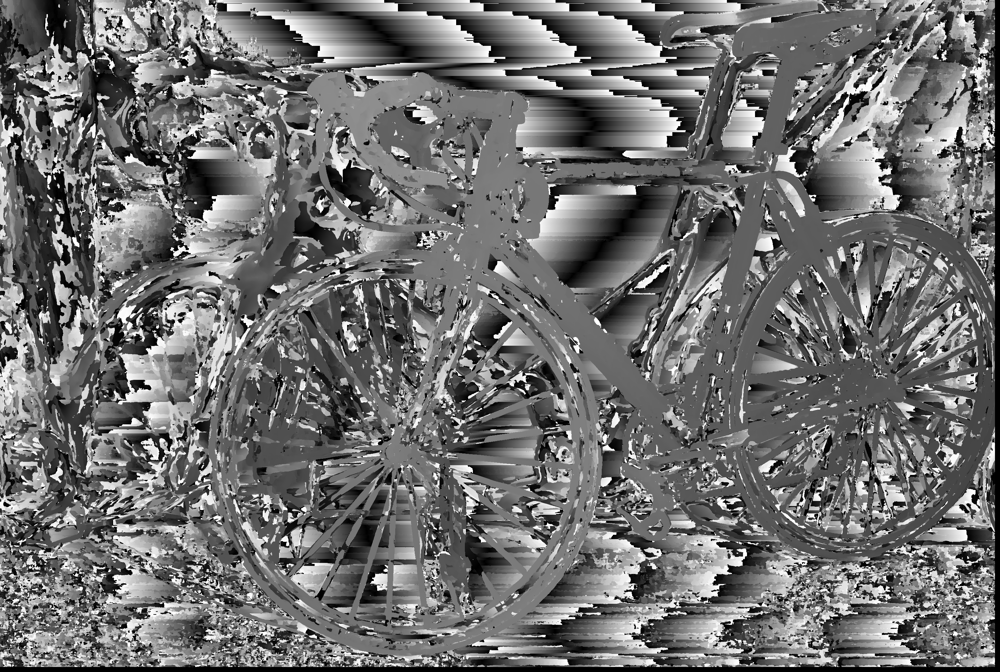

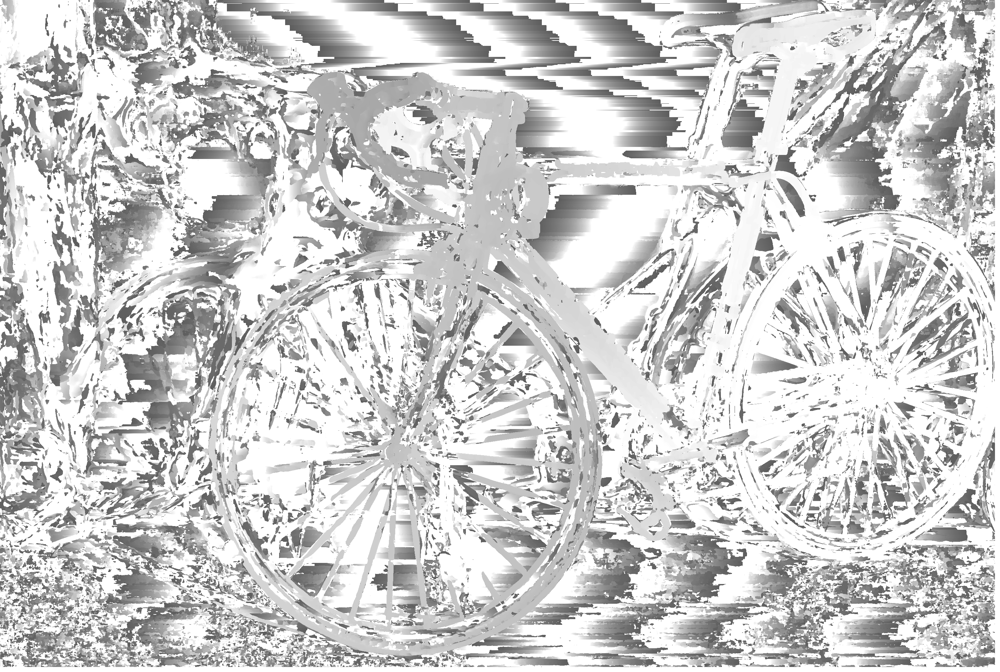

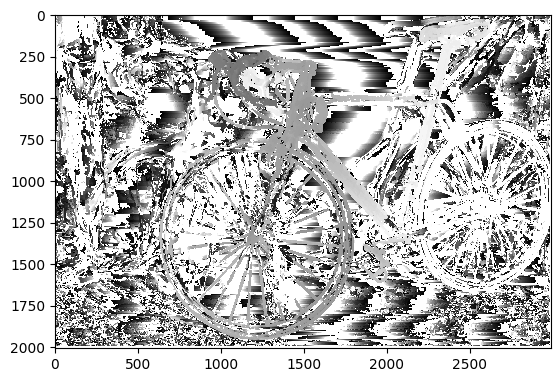

In [ ]:
from matplotlib import pyplot as plt
gray1 = img_left
gray2 = img_right
disparity_map =  get_disparity(gray1,gray2,50)
cv2_imshow(disparity_map)
plt.imshow(disparity_map, cmap="gray")
depth_map = get_depth(disparity_map,baseline,focal_length_1_x)
cv2_imshow(depth_map)
plt.imshow(depth_map, cmap='gray', interpolation='nearest')

I computed a 3D point cloud from given disparity map and depth map by calculating the corresponding 3D coordinates (X, Y, Z) based on the disparity and depth values.

In [ ]:
def generate_point_cloud(disparity_map, depth_map, camera_parameters):
    fx, fy = camera_parameters['focal_length']
    cx, cy = camera_parameters['principal_point']

    #deriving 3D coordinates
    points_3d = []
    for v in range(disparity_map.shape[0]):
        for u in range(disparity_map.shape[1]):
            disparity = disparity_map[v, u]
            depth = depth_map[v, u]
            if disparity > 0:
                Z = depth
                X = (u - cx) * Z / fx
                Y = (v - cy) * Z / fy
                points_3d.append([X, Y, Z])

    return np.array(points_3d)

#example:
camera_parameters = {
    'focal_length': (focal_length_1_x, focal_length_1_y),
    'principal_point': (principal_point_1_x, principal_point_1_y)
}
point_cloud = generate_point_cloud(disparity_map, depth_map, camera_parameters)

I visualised a point cloud, i.e., created a 3-D scatter plot of the point cloud using blue markers and displayed it with labeled axes for X, Y, and Z dimensions

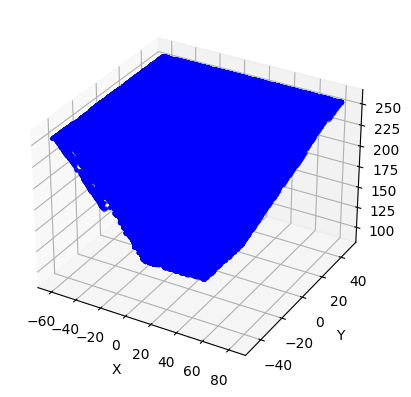

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

def display_point_cloud(point_cloud):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(point_cloud[:, 0], point_cloud[:, 1], point_cloud[:, 2], c='b', marker='.')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    plt.show()

# Display the point cloud
display_point_cloud(point_cloud)